This was our first dataset we attempted before moving onto our 2nd dataset.

##XGBoost

/tmp/ipython-input-2-266733773.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre[policy_cols] = pre[policy_cols].fillna(0)



=== Data Overview ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 19 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Name                                   1800 non-null   object        
 1   Substance                              1800 non-null   object        
 2   Month                                  1800 non-null   datetime64[ns]
 3   StringencyIndex                        1800 non-null   int64         
 4   MonthlyTotal                           1800 non-null   float64       
 5   GDP                                    1800 non-null   float64       
 6   C1E_School_closing                     1800 non-null   int64         
 7   C2E_Workplace_closing                  1800 non-null   int64         
 8   C3E_Cancel_public_events               1800 non-null   int64         
 9   C4E_Restrictions_on_gatherings         1

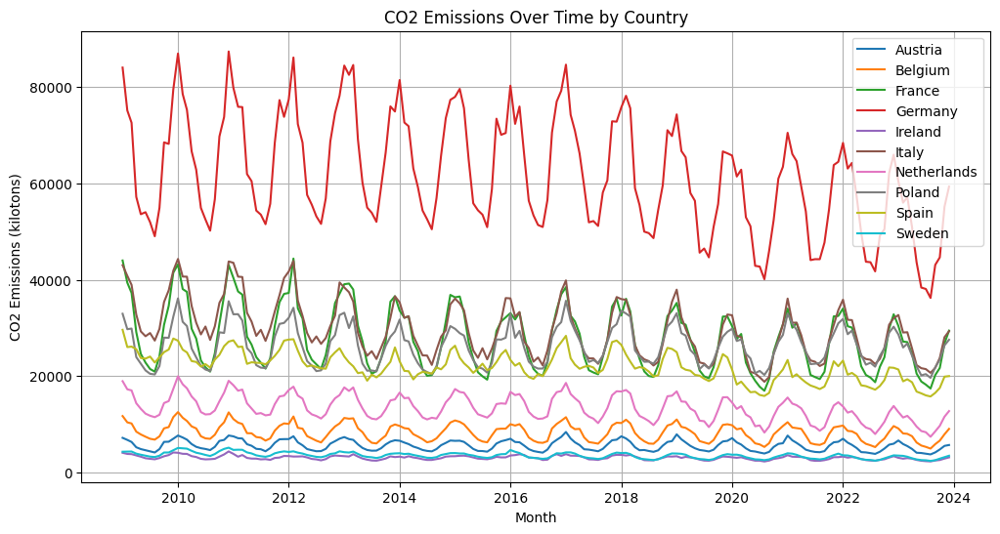

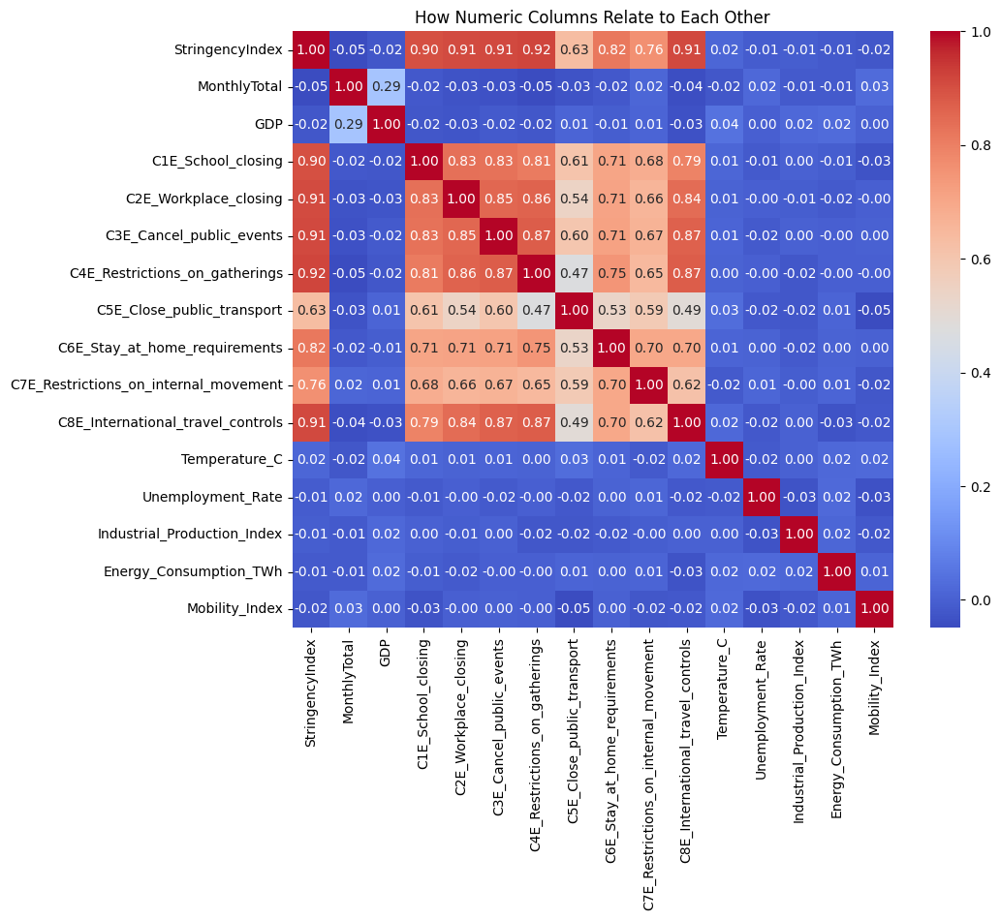

Removing 6 columns that are too similar: ['C1E_School_closing', 'C2E_Workplace_closing', 'C3E_Cancel_public_events', 'C4E_Restrictions_on_gatherings', 'C6E_Stay_at_home_requirements', 'C8E_International_travel_controls']
Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}

--- Model Performance ---
Average Error (MAE): 800.45
Accuracy Score (R2): 0.99
Percentage Error (MAPE): 4.61%
Root Mean Squared Error (RMSE): 1330.82
Saved comparison table to 'test_set_comparison.csv'
Error scores from 5 tests: [1071.68443312  943.81706204  944.08306466  934.876432   1021.19170417]
Average error: 983.1305391986467
Saved future predictions to 'co2_predictions_2023_2028.csv'
Available countries: ['Austria', 'Belgium', 'France', 'Germany', 'Ireland', 'Italy', 'Netherlands', 'Poland', 'Spain', 'Sweden']
Enter country to plot (or 'quit'): Italy


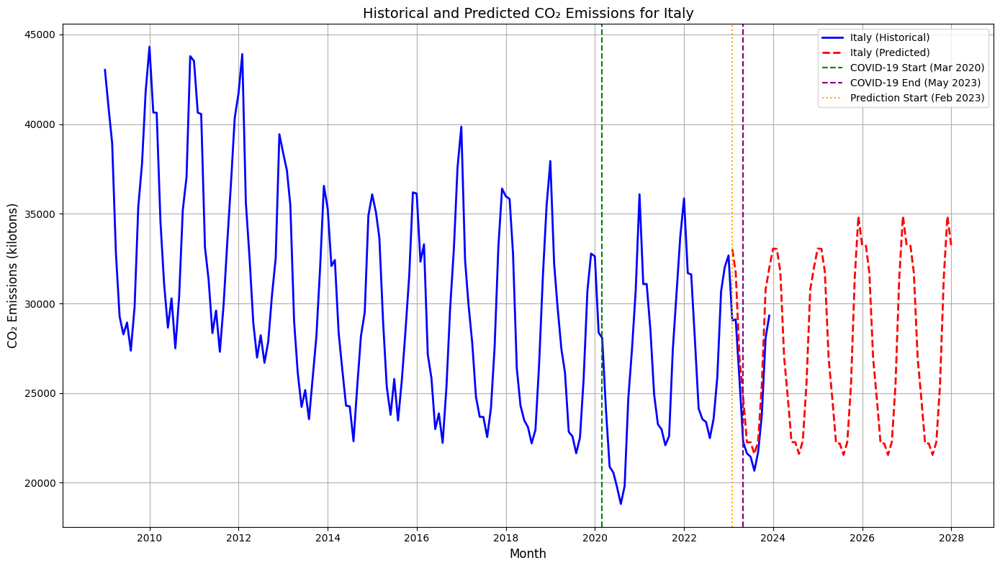

Enter country to plot (or 'quit'): Ireland


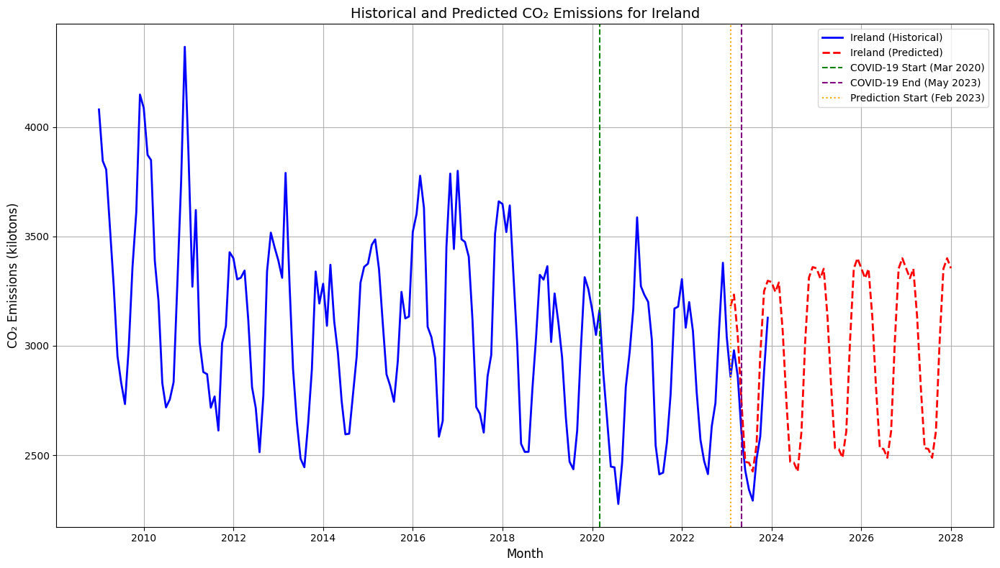

Enter country to plot (or 'quit'): France


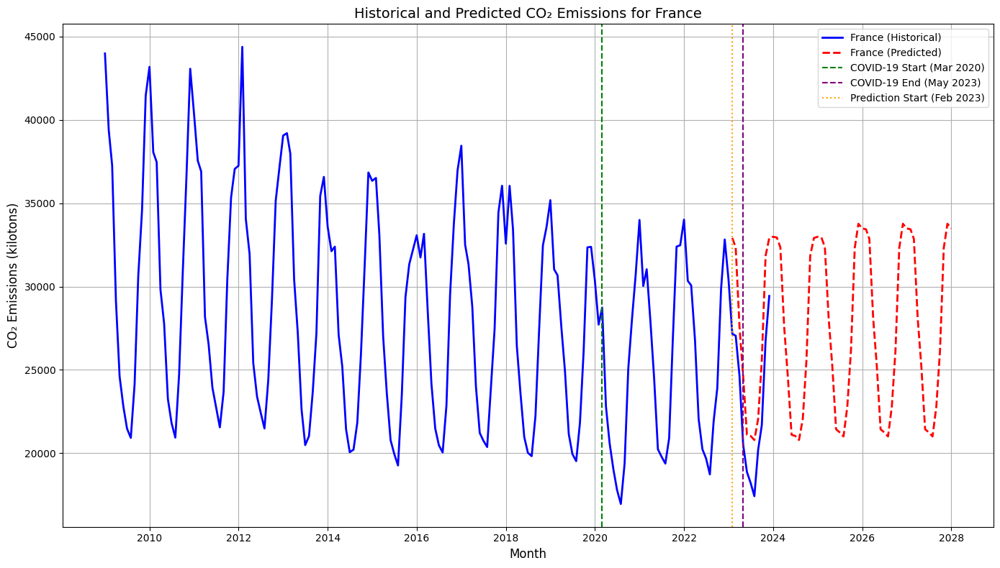

Enter country to plot (or 'quit'): Netherlands


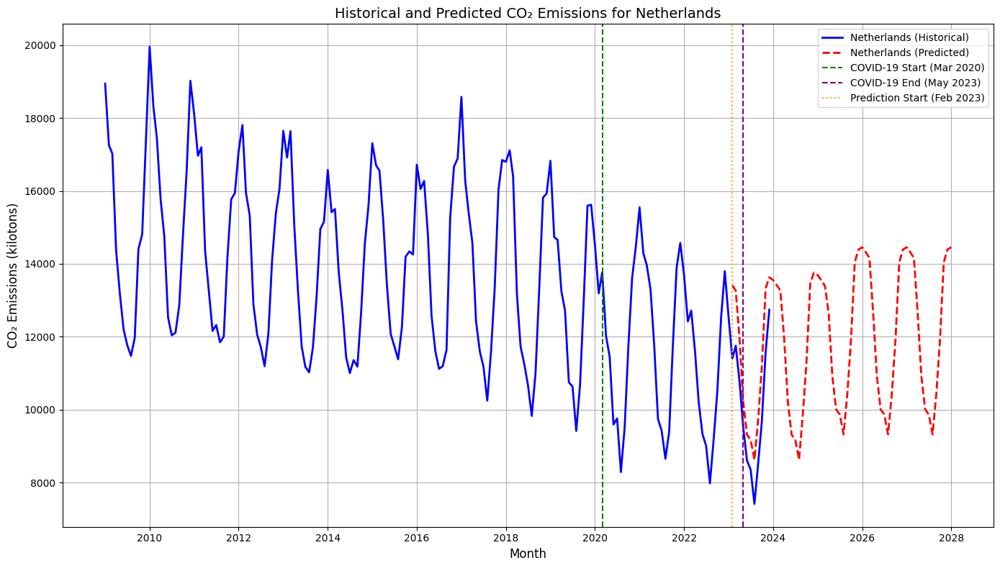

Enter country to plot (or 'quit'): Spain


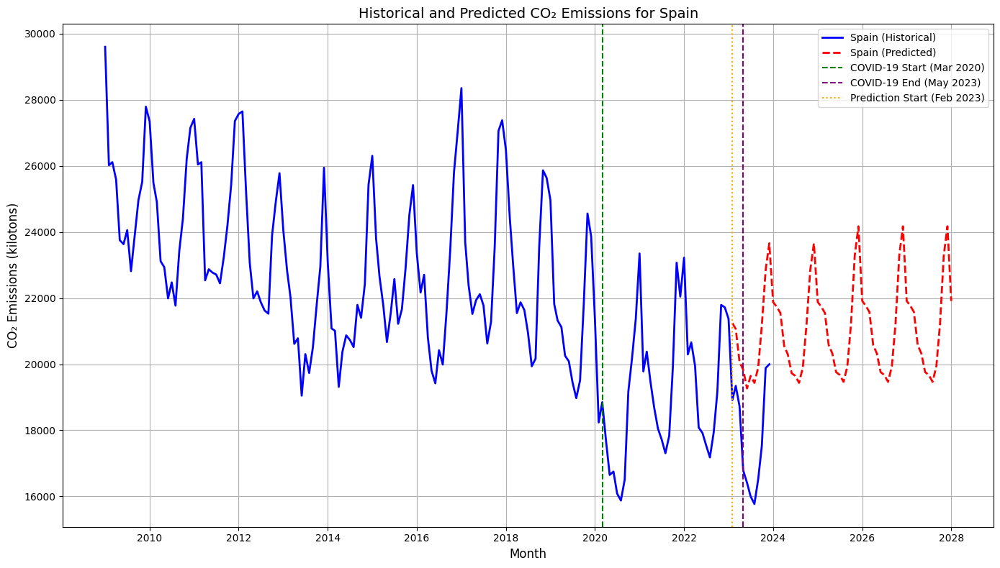

Enter country to plot (or 'quit'): Sweden


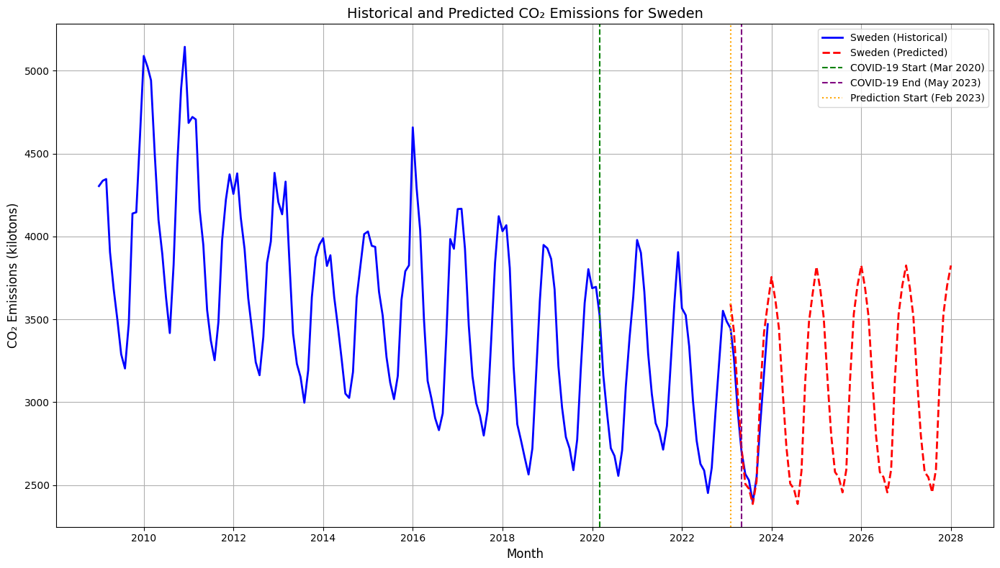

Enter country to plot (or 'quit'): Belgium


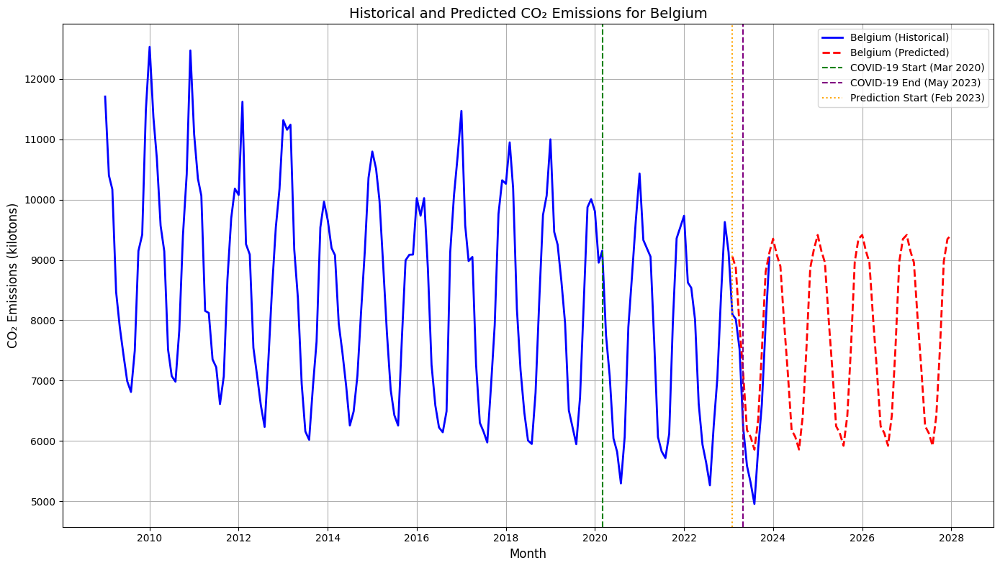

Enter country to plot (or 'quit'): Germany


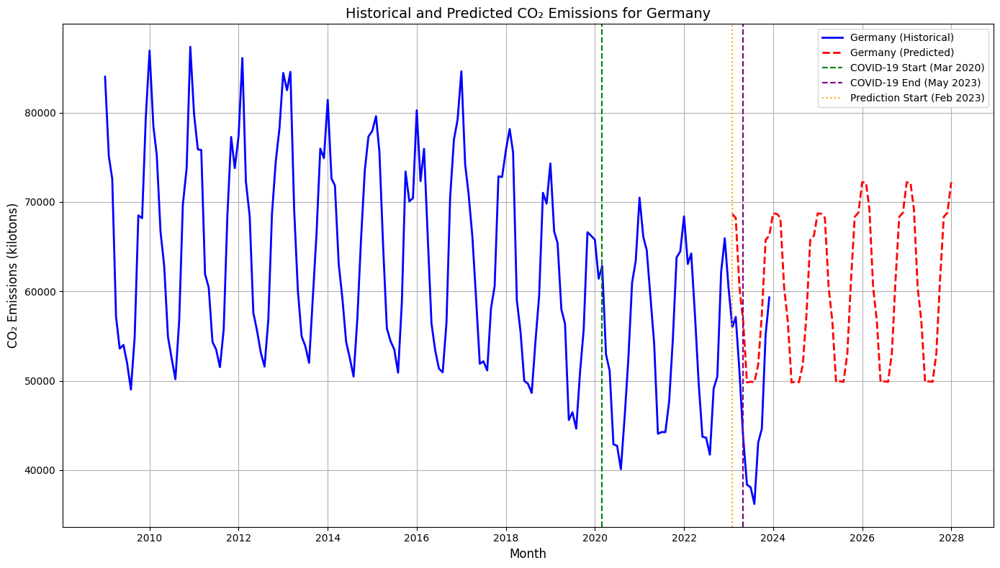

Enter country to plot (or 'quit'): quit
Program finished.


In [2]:
# https://cienciadedatos.net/documentos/py56-forecasting-time-series-with-xgboost
# https://machinelearningmastery.com/xgboost-for-time-series-forecasting/
import pandas as pd
import numpy as np
from datetime import datetime
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, mean_absolute_percentage_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Function to find and list columns that are too similar to others
def remove_correlated_features(df, thresh=0.8, verbose=True):
    """
    Finds columns in the data that are too similar to each other (above a certain limit)
    and returns a list of columns to remove to avoid confusion in the model.
    """
    # Calculate how similar columns are to each other
    corr = df.corr().abs()
    # Look at only the upper half of the similarity table to avoid duplicates
    upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
    # Find columns that are too similar (above the limit)
    to_drop = [col for col in upper.columns if any(upper[col] > thresh)]
    # Printing which columns will be removed
    if verbose:
        print(f"Removing {len(to_drop)} columns that are too similar: {to_drop}")
    return to_drop

# Function to load and clean the data
# https://mlpills.dev/time-series/xgboost-to-forecast-univariate-time-series-data-with-exogenous-variables/
def load_and_clean_data(filepath='cgrt_edgar_combined1.xlsx'):
    """
    Loads the data from an Excel file and cleans it up so it's ready to use.
    """
    # Loading Excel file
    data = pd.read_excel(filepath, sheet_name='cgrt_edgar_combined')
    # Removing any rows that are completely empty
    data = data.dropna(how='all')
    # Cleaning up column names (remove extra spaces, replace spaces with underscores)
    data.columns = data.columns.str.strip().str.replace(' ', '_')

    # Checking if the 'Name' column (for countries) exists
    if 'Name' not in data.columns:
        raise KeyError("The 'Name' column is missing from the data!")

    # Converting the 'Month' column to a proper date format
    data['Month'] = pd.to_datetime(data['Month'], format='%Y-%m')

    # Splitting data into before and after January 2020 (pre/post-COVID)
    pre = data[data['Month'] < '2020-01-01']
    post = data[data['Month'] >= '2020-01-01']

    # List of columns related to COVID restrictions
    # https://skforecast.org/0.11.0/user_guides/exogenous-variables
    policy_cols = [
        'StringencyIndex',
        'C1E_School_closing', 'C2E_Workplace_closing', 'C3E_Cancel_public_events',
        'C4E_Restrictions_on_gatherings', 'C5E_Close_public_transport',
        'C6E_Stay_at_home_requirements', 'C7E_Restrictions_on_internal_movement',
        'C8E_International_travel_controls'
    ]
    # Adding any missing restriction columns with empty values
    for col in policy_cols:
        if col not in data.columns:
            data[col] = np.nan

    # Assuming no restrictions existed before COVID, so fill with zeros
    pre[policy_cols] = pre[policy_cols].fillna(0)
    # Combine the pre- and post-COVID data back together
    data = pd.concat([pre, post], ignore_index=True)

    # List of columns that should be numbers
    numeric_cols = [
        'MonthlyTotal', 'GDP', 'Temperature_C', 'Unemployment_Rate',
        'Industrial_Production_Index', 'Energy_Consumption_TWh', 'Mobility_Index'
    ] + policy_cols
    # Convert these columns to numbers, filling any invalid values with 0
    for col in numeric_cols:
        data[col] = pd.to_numeric(data[col], errors='coerce').fillna(0)

    return data

# Function to explore and understand the data
def exploratory_data_analysis(data):
    """
    Looks at the data to show its structure and create graphs for understanding trends.
    """
    # Basic info about the data
    print("\n=== Data Overview ===")
    print(data.info())
    # Missing values in each column
    print("\n=== Missing Values ===")
    print(data.isnull().sum())

    # Graph of CO2 emissions over time for each country
    plt.figure(figsize=(12, 6))
    for country in data['Name'].dropna().unique():
        dfc = data[data['Name'] == country]
        plt.plot(dfc['Month'], dfc['MonthlyTotal'], label=country)
    plt.title('CO2 Emissions Over Time by Country')
    plt.xlabel('Month')
    plt.ylabel('CO2 Emissions (kilotons)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Heatmap to show how columns relate to each other
    num = data.select_dtypes(include=[np.number])
    plt.figure(figsize=(10, 8))
    sns.heatmap(num.corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('How Numeric Columns Relate to Each Other')
    plt.show()

# Function to add new columns and prepare data for the model
def feature_engineering(data):
    """
    Adds new columns like year and month, and converts categories into numbers.
    """
    # Copy of the original data
    data_orig = data.copy()

    # Adding columns for year, month, and quarter from the date
    data['Year'] = data['Month'].dt.year
    data['Month_num'] = data['Month'].dt.month
    data['Quarter'] = data['Month'].dt.quarter

    # Labeling time periods as Pre-COVID, COVID, or Post-COVID
    data['Period'] = 'Pre-COVID'
    mask_covid = (data['Month'] >= '2020-03-01') & (data['Month'] <= '2023-05-01')
    data.loc[mask_covid, 'Period'] = 'COVID'
    data.loc[data['Month'] > '2023-05-01', 'Period'] = 'Post-COVID'

    # Convert country names and periods into number codes (one-hot encoding)
    data = pd.get_dummies(data, columns=['Name', 'Period'], drop_first=True)

    return data, data_orig

# Function to split data into training and testing parts
def train_test_split_data(data, data_orig):
    """
    Divides the data into parts for training the model and testing it.
    """
    # Use data up to 2022 for training
    train_mask = data['Month'] <= '2022-12-31'
    train = data[train_mask]
    train_orig = data_orig[train_mask]

    # Choose columns to use as inputs (exclude date, substance, and CO2)
    feature_cols = [c for c in data.columns if c not in ['Month', 'Substance', 'MonthlyTotal']]
    X = train[feature_cols]
    y = train['MonthlyTotal']

    # Split data: 80% for training, 20% for testing
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )
    # Get the original data for the test set
    test_orig = train_orig.loc[X_test.index]

    return X_train, X_test, y_train, y_test, feature_cols, test_orig

# Function to train the prediction model
def train_model(X_train, y_train):
    """
    Trains a model to predict CO2 emissions using different settings to find the best one.
    """
    model = xgb.XGBRegressor(random_state=42)
    params = {
        'n_estimators': [100, 200],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.3]
    }
    grid = GridSearchCV(
        model, params, cv=5,
        scoring='neg_mean_absolute_error', n_jobs=-1
    )
    grid.fit(X_train, y_train)
    print("Best Parameters:", grid.best_params_)
    return grid.best_estimator_

# Function to check how good the model is
def evaluate_model(model, X_test, y_test, test_orig):
    """
    Tests the model and shows how accurate its predictions are.
    """
    # Make predictions on test data
    y_pred = model.predict(X_test)
    # Show error metrics
    print("\n--- Model Performance ---")
    print(f"Average Error (MAE): {mean_absolute_error(y_test, y_pred):.2f}")
    print(f"Accuracy Score (R2): {r2_score(y_test, y_pred):.2f}")
    print(f"Percentage Error (MAPE): {mean_absolute_percentage_error(y_test, y_pred):.2%}")
    print(f"Root Mean Squared Error (RMSE): {np.sqrt(mean_squared_error(y_test, y_pred)):.2f}")

    # Creating a table comparing actual and predicted CO2
    comp = pd.DataFrame({
        'Month': test_orig['Month'],
        'Name': test_orig['Name'],
        'Actual_CO2': y_test,
        'Predicted_CO2': y_pred
    })
    comp['Diff'] = comp['Actual_CO2'] - comp['Predicted_CO2']
    comp['AbsDiff'] = comp['Diff'].abs()
    comp.sort_values('Month', inplace=True)
    # Save the comparison table
    comp.to_csv('test_set_comparison.csv', index=False)
    print("Saved comparison table to 'test_set_comparison.csv'")

    return y_pred

# Function to predict future CO2 emissions - here I used AI to help formulate predictions
def make_predictions(model, data, feature_cols, data_orig):
    """
    Predicts CO2 emissions for future dates (2023-2028).
    """
    # Creating a list of future months
    future_dates = pd.date_range(start='2023-02-01', end='2028-01-01', freq='MS')
    country_cols = [c for c in data.columns if c.startswith('Name_')]

    # Calculating average values for each country
    avg = data_orig.groupby('Name').agg({
        'GDP':'mean', 'Temperature_C':'mean', 'Unemployment_Rate':'mean',
        'Industrial_Production_Index':'mean','Energy_Consumption_TWh':'mean','Mobility_Index':'mean'
    }).reset_index()

    rows = []
    for date in future_dates:
        # Calculating months since COVID ended
        months_since = (date - pd.to_datetime('2023-05-01')).days / 30
        for c in country_cols:
            name = c.replace('Name_','')
            row = {
                'Month': date,
                'Year': date.year,
                'Month_num': date.month,
                'Quarter': date.quarter if hasattr(date, 'quarter') else (date.month-1)//3+1,
                # Assuming restrictions decrease over time
                'StringencyIndex': 10*np.exp(-0.1*months_since)
            }
            # Setting restriction values to decrease over time
            for policy in [
                'C1E_School_closing','C2E_Workplace_closing','C3E_Cancel_public_events',
                'C4E_Restrictions_on_gatherings','C5E_Close_public_transport',
                'C6E_Stay_at_home_requirements','C7E_Restrictions_on_internal_movement',
                'C8E_International_travel_controls'
            ]:
                row[policy] = 0.5*np.exp(-0.1*months_since)
            # Using average values for each country
            hist = avg[avg['Name']==name]
            if not hist.empty:
                for col in ['GDP','Temperature_C','Unemployment_Rate',
                            'Industrial_Production_Index','Energy_Consumption_TWh','Mobility_Index']:
                    row[col] = hist.iloc[0][col]
            else:
                # Using overall average if country data is missing
                for col in ['GDP','Temperature_C','Unemployment_Rate',
                            'Industrial_Production_Index','Energy_Consumption_TWh','Mobility_Index']:
                    row[col] = data_orig[col].mean()
            # Setting country and period flags
            for cc in country_cols:
                row[cc] = 1 if cc==c else 0
            row['Period_Post-COVID'] = 1
            row['Period_Pre-COVID'] = 0 if 'Period_Pre-COVID' in data.columns else 0
            row['Period_COVID'] = 0 if 'Period_COVID' in data.columns else 0
            rows.append(row)

    # Creating a table for future data and predict CO2
    fut = pd.DataFrame(rows)
    fut['Predicted_CO2'] = model.predict(fut[feature_cols])
    # Save predictions
    fut.to_csv('co2_predictions_2023_2028.csv', index=False)
    print("Saved future predictions to 'co2_predictions_2023_2028.csv'")
    return fut

# Function to draw graphs of CO2 data
def visualize_predictions(data_orig, predictions):
    """
    Draws graphs to compare historical and predicted CO2 for a chosen country.
    """
    countries = data_orig['Name'].unique()
    print("Available countries:", countries.tolist())

    # Getting the start date of predictions
    pred_start = predictions['Month'].min()
    pred_start_str = pred_start.strftime('%b %Y')

    while True:
        # Insert country to graph
        country = input("Enter country to plot (or 'quit'): ").strip()
        if country.lower() == 'quit':
            break
        if country not in countries:
            print(f"Error: '{country}' not found. Options are: {countries.tolist()}")
            continue

        # Getting data for the chosen country
        hist = data_orig[data_orig['Name'] == country]
        pred = predictions[predictions[f'Name_{country}'] == 1]

        plt.figure(figsize=(14, 8))

        # Plotting historical CO2 data
        plt.plot(
            hist['Month'], hist['MonthlyTotal'],
            label=f'{country} (Historical)',
            color='blue',
            linewidth=2
        )

        # Plotting predicted CO2 data
        plt.plot(
            pred['Month'], pred['Predicted_CO2'],
            '--', label=f'{country} (Predicted)',
            color='red',
            linewidth=2
        )

        # Adding lines to mark important dates
        plt.axvline(
            pd.to_datetime('2020-03-01'),
            color='green', linestyle='--', linewidth=1.5,
            label='COVID-19 Start (Mar 2020)'
        )
        plt.axvline(
            pd.to_datetime('2023-05-01'),
            color='purple', linestyle='--', linewidth=1.5,
            label='COVID-19 End (May 2023)'
        )
        plt.axvline(
            pred_start,
            color='orange', linestyle=':', linewidth=1.5,
            label=f'Prediction Start ({pred_start_str})'
        )

        # Adding titles and labels to the graph
        plt.title(
            f'Historical and Predicted CO₂ Emissions for {country}',
            fontsize=14
        )
        plt.xlabel('Month', fontsize=12)
        plt.ylabel('CO₂ Emissions (kilotons)', fontsize=12)
        plt.grid(True)
        plt.legend(fontsize=10, loc='upper right')
        plt.tight_layout()
        plt.show()

# Function to test the model's reliability
def test_and_validate(model, X, y):
    """
    Tests the model multiple times to see how reliable it is.
    """
    # Test the model 5 times and measure the error
    scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_absolute_error')
    print("Error scores from 5 tests:", -scores)
    print("Average error:", -scores.mean())

# Main program to run everything
if __name__ == '__main__':
    # Load and clean the data
    data = load_and_clean_data()

    # Explore the data with tables and graphs
    exploratory_data_analysis(data)

    # Remove columns that are too similar
    numeric_feats = data.select_dtypes(include=[np.number])
    drops = remove_correlated_features(numeric_feats, thresh=0.8)
    data.drop(columns=drops, inplace=True)

    # Add new columns for the model
    data_fe, data_orig = feature_engineering(data)

    # Split data into training and testing
    X_train, X_test, y_train, y_test, feats, test_orig = train_test_split_data(data_fe, data_orig)

    # Training the model
    model = train_model(X_train, y_train)

    # Checking how good the model is
    y_pred = evaluate_model(model, X_test, y_test, test_orig)

    # Testing model's reliability
    test_and_validate(model, X_train, y_train)

    # Predict future CO2 emissions
    fut = make_predictions(model, data_fe, feats, data_orig)

    # Graphs of the results
    visualize_predictions(data_orig, fut)

    print("Program finished.")

###Feature importance of whole dataset

In [9]:
import pandas as pd

# Load the dataset
filepath = 'cgrt_edgar_combined1.xlsx'
try:
    data = pd.read_excel(filepath)
    data.columns = data.columns.str.strip().str.replace(' ', '_')

    # Select only numeric columns and the target variable
    numeric_cols = data.select_dtypes(include=np.number).columns.tolist()
    if 'MonthlyTotal' not in numeric_cols:
        print("Error: 'MonthlyTotal' column not found in the numeric columns.")
    else:
        numeric_data = data[numeric_cols]

        # Calculate correlation with 'MonthlyTotal'
        correlation_with_target = numeric_data.corr()['MonthlyTotal'].sort_values(ascending=False)

        print("\n=== Correlation of Numeric Features with MonthlyTotal ===")
        print(correlation_with_target)

except FileNotFoundError:
    print(f"Error: File not found at {filepath}")
except Exception as e:
    print(f"An error occurred: {e}")


=== Correlation of Numeric Features with MonthlyTotal ===
MonthlyTotal                             1.000000
GDP                                      0.289982
Mobility_Index                           0.027932
Unemployment_Rate                        0.020387
C7E_Restrictions_on_internal_movement    0.015348
Energy_Consumption_TWh                  -0.012740
Industrial_Production_Index             -0.013002
C6E_Stay_at_home_requirements           -0.016380
C1E_School_closing                      -0.018743
Temperature_C                           -0.024269
C2E_Workplace_closing                   -0.029373
C5E_Close_public_transport              -0.029815
C3E_Cancel_public_events                -0.034162
C8E_International_travel_controls       -0.041865
C4E_Restrictions_on_gatherings          -0.045005
StringencyIndex                         -0.045019
Name: MonthlyTotal, dtype: float64


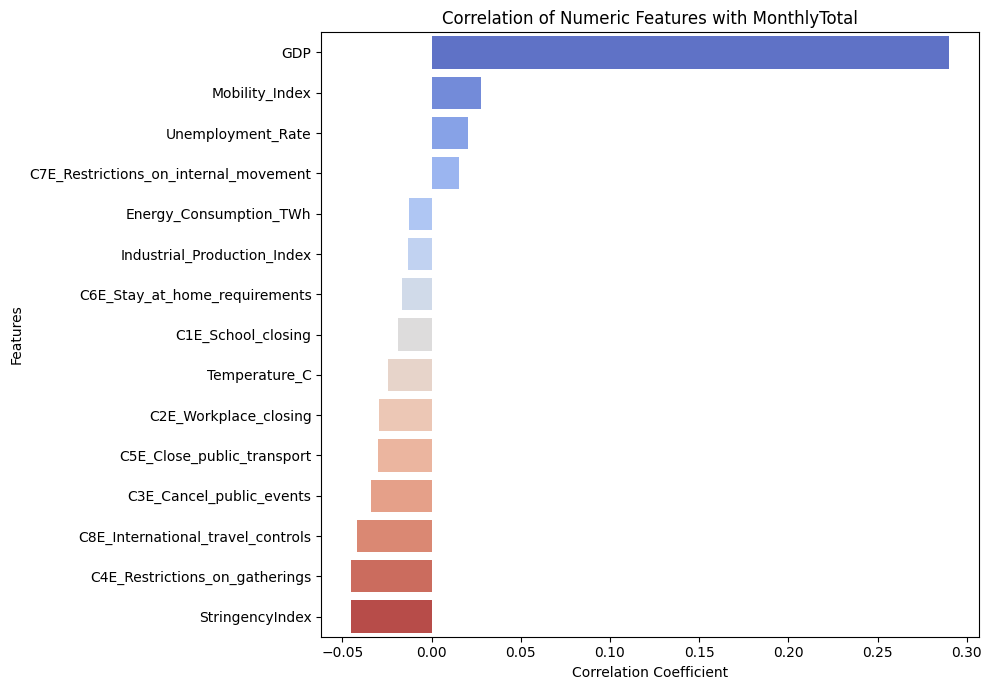

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Load the dataset
filepath = 'cgrt_edgar_combined1.xlsx'
try:
    data = pd.read_excel(filepath)
    data.columns = data.columns.str.strip().str.replace(' ', '_')

    # Select only numeric columns and the target variable
    numeric_cols = data.select_dtypes(include=np.number).columns.tolist()
    if 'MonthlyTotal' not in numeric_cols:
        print("Error: 'MonthlyTotal' column not found in the numeric columns.")
    else:
        numeric_data = data[numeric_cols]

        # Calculate correlation with 'MonthlyTotal'
        correlation_with_target = numeric_data.corr()['MonthlyTotal'].sort_values(ascending=False)

        # Remove the correlation of 'MonthlyTotal' with itself (which is always 1) for visualization
        correlation_plot_data = correlation_with_target.drop('MonthlyTotal')

        plt.figure(figsize=(10, 7))
        sns.barplot(x=correlation_plot_data.values, y=correlation_plot_data.index, palette='coolwarm')
        plt.title('Correlation of Numeric Features with MonthlyTotal')
        plt.xlabel('Correlation Coefficient')
        plt.ylabel('Features')
        plt.tight_layout()
        plt.show()

except FileNotFoundError:
    print(f"Error: File not found at {filepath}")
except Exception as e:
    print(f"An error occurred: {e}")

##SARIMAX with ADF tests


=== Processing Austria ===


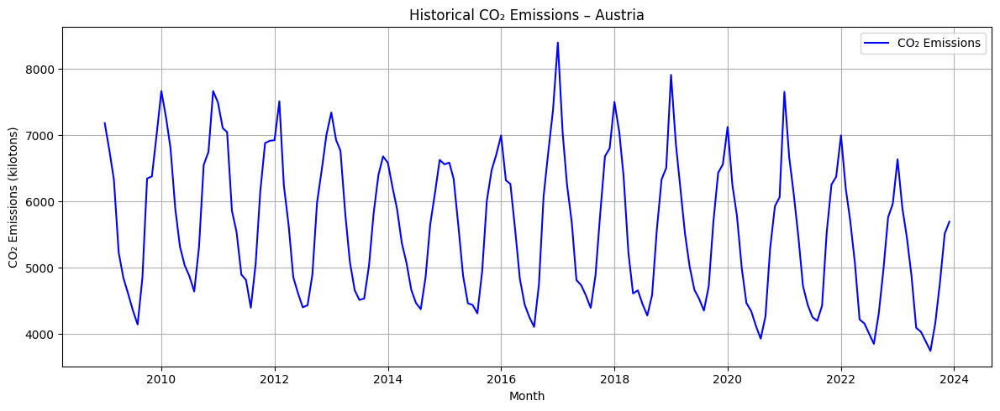

ADF Statistic for Austria: -0.6640
p-value: 0.8559
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



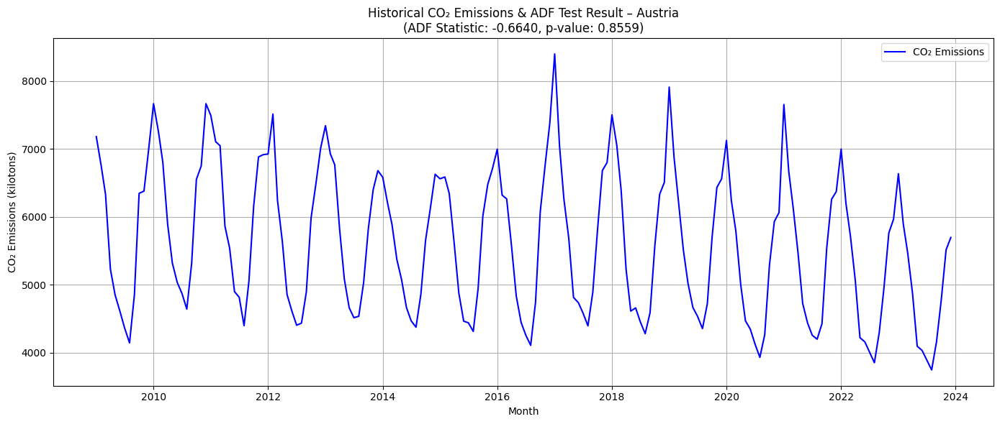

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Austria (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 250.96    
RMSE       | 282.78    
MAPE       | 5.78%     
R-squared  | 0.8619    
----------------------------------------------------------------------------------------------------


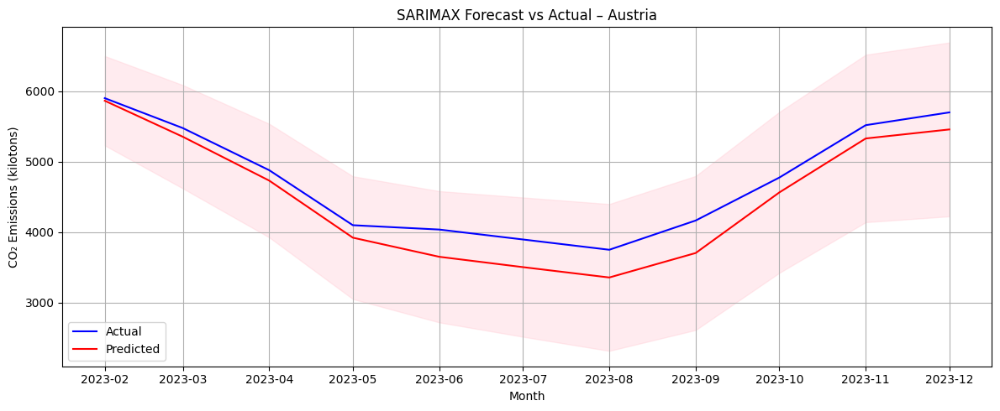


Saved 'sarimax_test_comparison_Austria.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  5900.087113    5863.378267   36.708846            36.708846
1 2023-03-01  5475.470858    5352.146710  123.324148           123.324148
2 2023-04-01  4877.425768    4729.820708  147.605061           147.605061
3 2023-05-01  4096.731921    3919.771911  176.960010           176.960010
4 2023-06-01  4034.937556    3648.410895  386.526662           386.526662


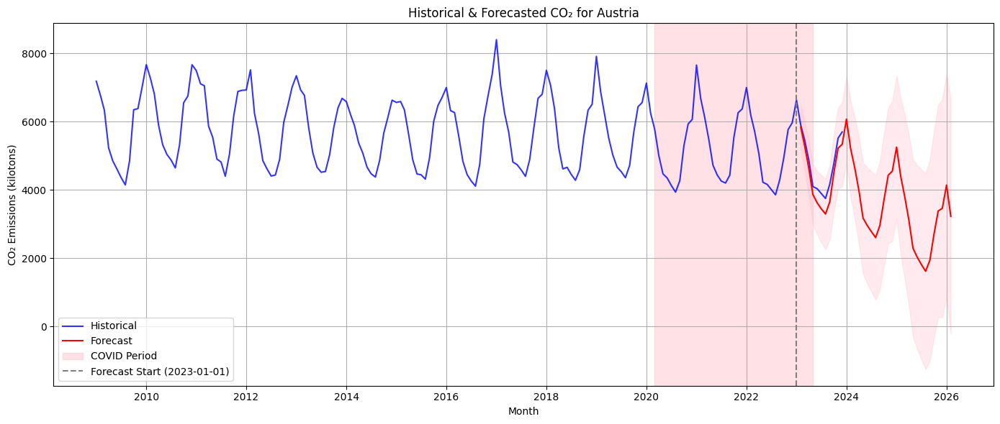


Saved 'sarimax_future_forecast_Austria.csv'
        Month  Forecasted_CO2     CI_Lower     CI_Upper
0 2023-02-01     5836.226843  5201.921396  6470.532290
1 2023-03-01     5306.813288  4573.645674  6039.980901
2 2023-04-01     4638.536532  3832.567287  5444.505776
3 2023-05-01     3863.890070  2992.724347  4735.055792
4 2023-06-01     3620.475613  2688.842276  4552.108949

=== Processing Belgium ===


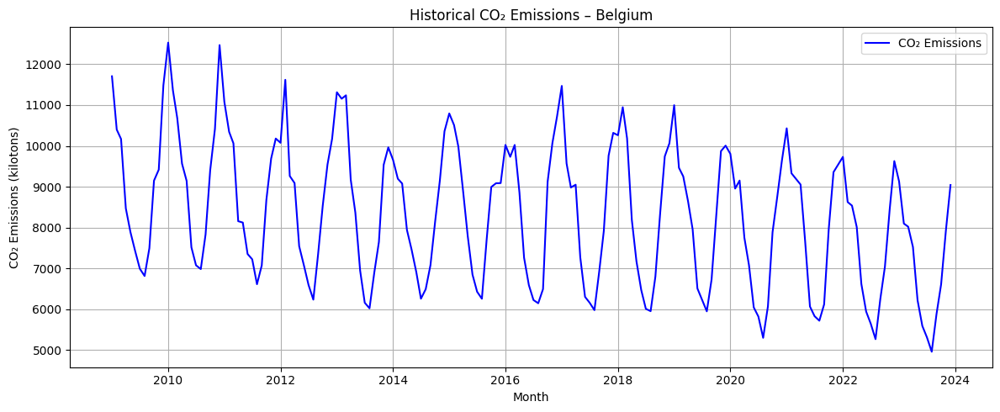

ADF Statistic for Belgium: -0.2307
p-value: 0.9348
Critical Values:
   1%: -3.4699
   5%: -2.8789
   10%: -2.5760
Stationary: False



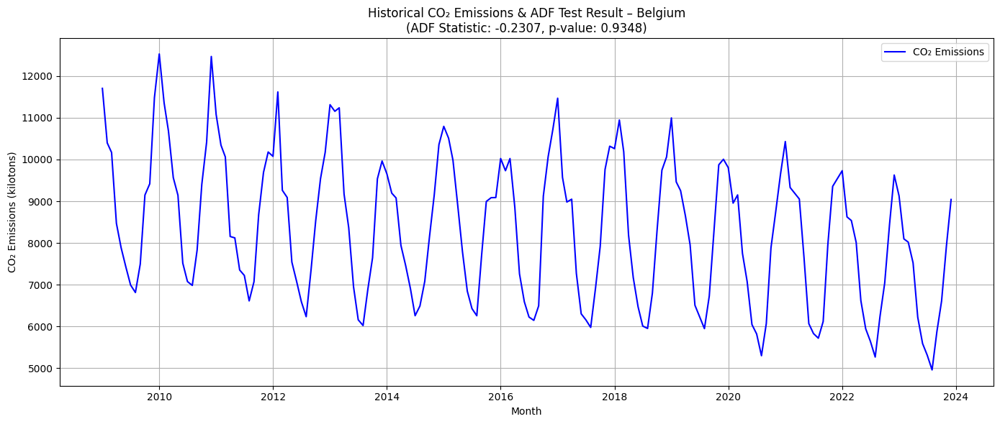

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Belgium (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 304.35    
RMSE       | 346.19    
MAPE       | 4.73%     
R-squared  | 0.9279    
----------------------------------------------------------------------------------------------------


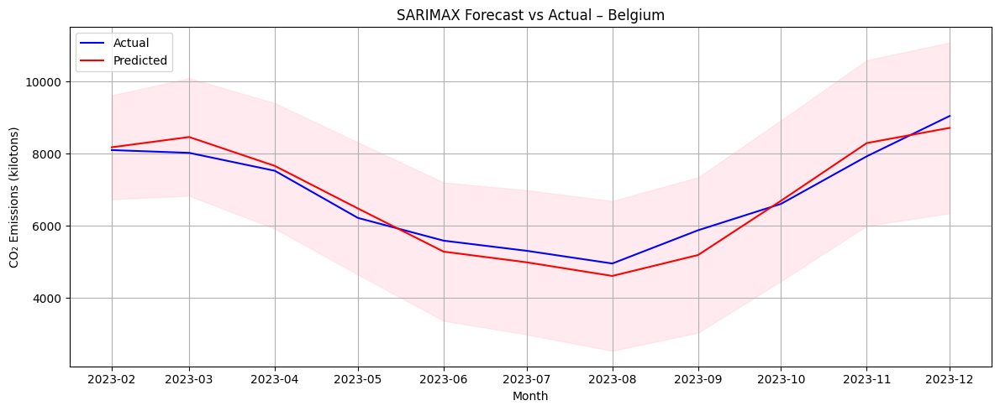


Saved 'sarimax_test_comparison_Belgium.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  8097.974378    8175.691069  -77.716691            77.716691
1 2023-03-01  8020.984974    8459.503795 -438.518821           438.518821
2 2023-04-01  7524.211649    7658.638934 -134.427285           134.427285
3 2023-05-01  6220.430661    6481.775230 -261.344570           261.344570
4 2023-06-01  5590.271261    5286.659123  303.612138           303.612138


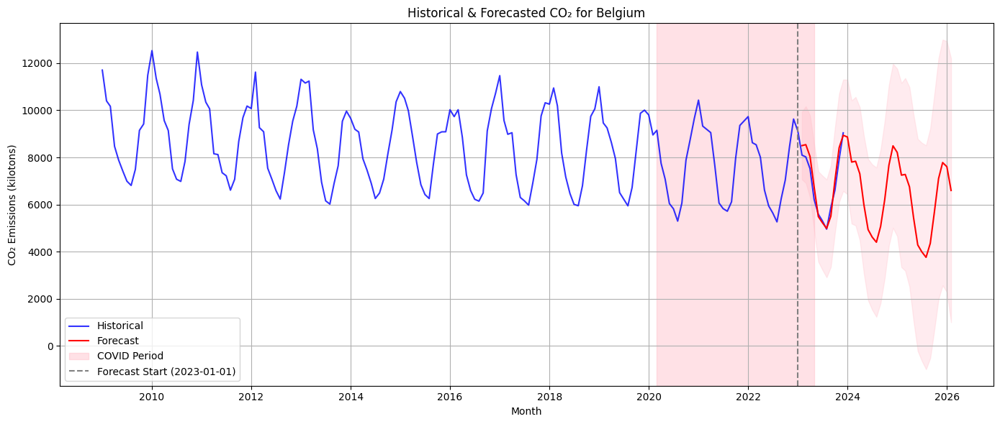


Saved 'sarimax_future_forecast_Belgium.csv'
        Month  Forecasted_CO2     CI_Lower      CI_Upper
0 2023-02-01     8502.555255  7063.709033   9941.401478
1 2023-03-01     8542.521785  6915.841688  10169.201882
2 2023-04-01     8040.784532  6304.249109   9777.319955
3 2023-05-01     6755.196160  4926.154324   8584.237997
4 2023-06-01     5490.368390  3575.495242   7405.241538

=== Processing Germany ===


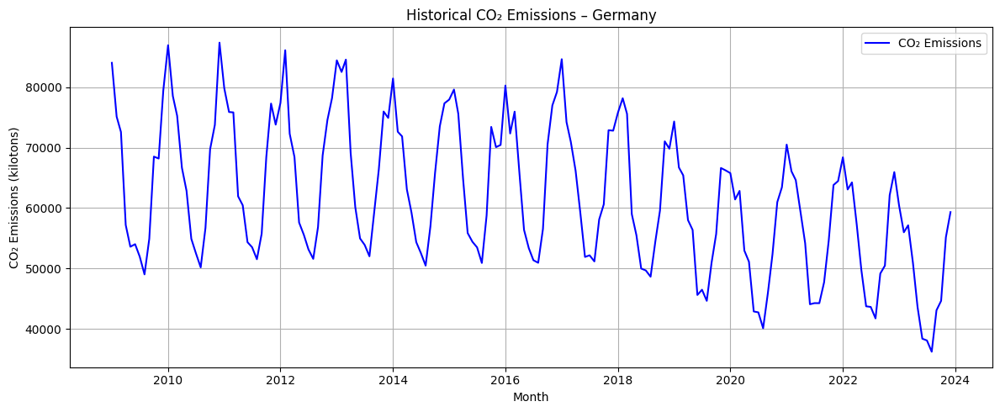

ADF Statistic for Germany: 0.9547
p-value: 0.9938
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



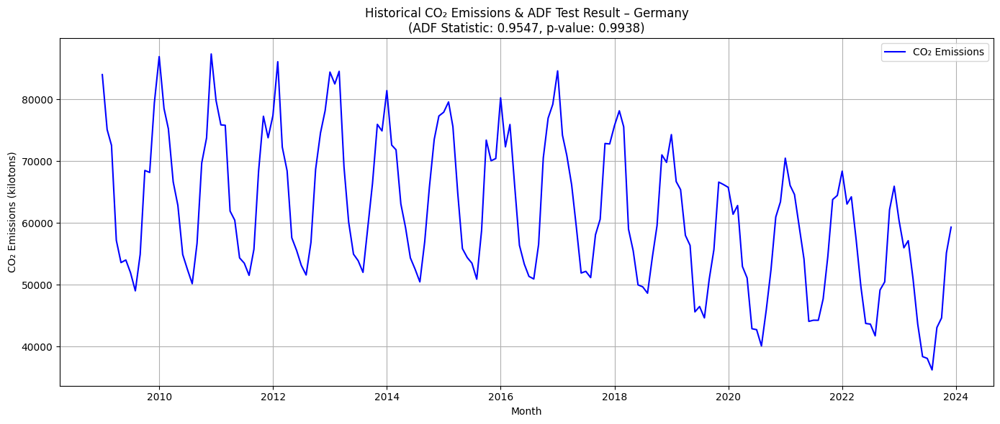

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Germany (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 1884.23   
RMSE       | 2279.14   
MAPE       | 3.87%     
R-squared  | 0.9203    
----------------------------------------------------------------------------------------------------


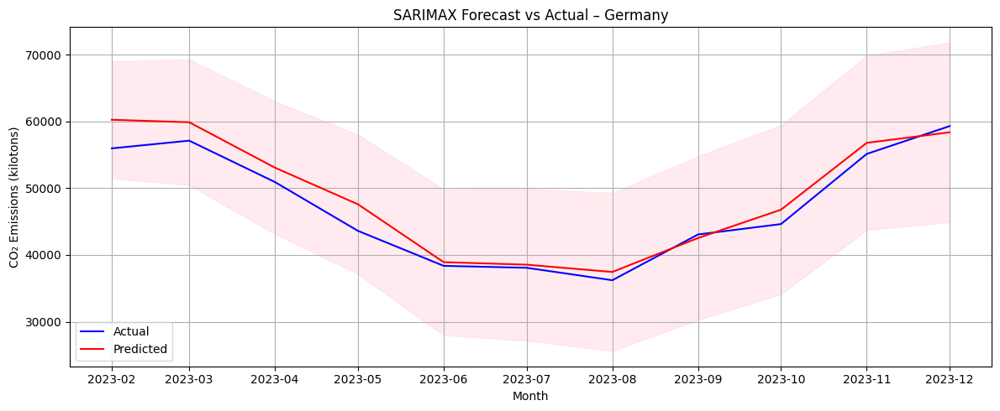


Saved 'sarimax_test_comparison_Germany.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  55985.026987   60273.676504 -4288.649517          4288.649517
1 2023-03-01  57140.411905   59901.073486 -2760.661581          2760.661581
2 2023-04-01  50936.192424   53093.483100 -2157.290675          2157.290675
3 2023-05-01  43623.413774   47604.207293 -3980.793519          3980.793519
4 2023-06-01  38372.806203   38925.035387  -552.229185           552.229185


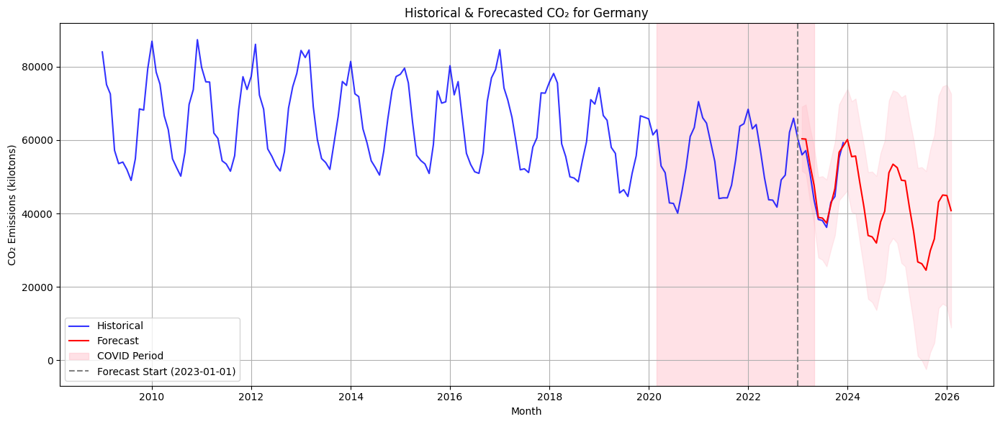


Saved 'sarimax_future_forecast_Germany.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    60350.373114  51580.097791  69120.648436
1 2023-03-01    60275.970099  50861.125710  69690.814487
2 2023-04-01    53273.880388  43325.809726  63221.951051
3 2023-05-01    47649.125673  37197.534493  58100.716852
4 2023-06-01    38927.138795  27995.290071  49858.987519

=== Processing France ===


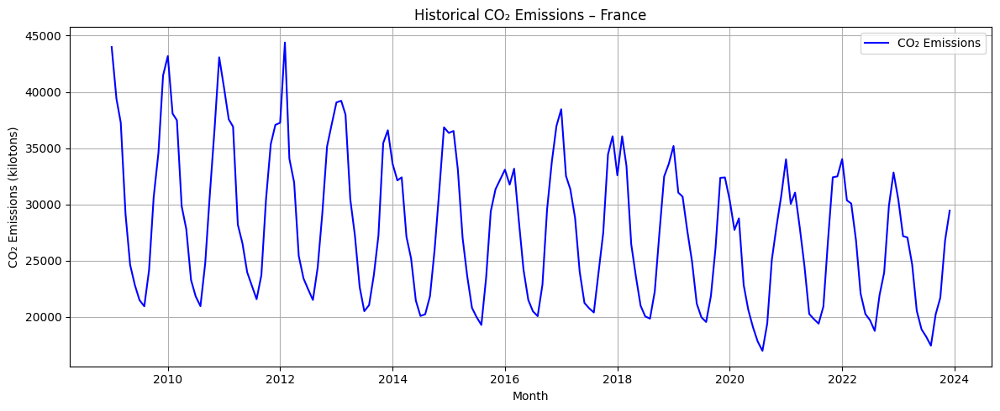

ADF Statistic for France: -0.5499
p-value: 0.8819
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



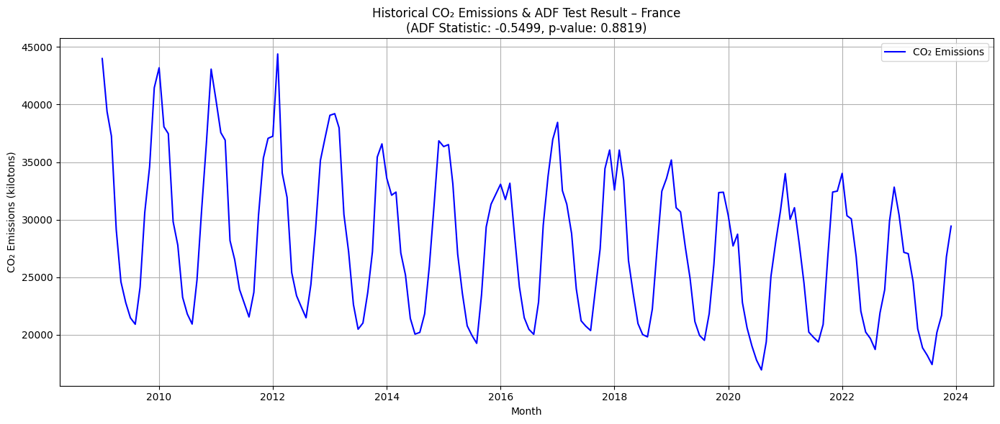

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for France (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 1153.12   
RMSE       | 1443.04   
MAPE       | 5.56%     
R-squared  | 0.8717    
----------------------------------------------------------------------------------------------------


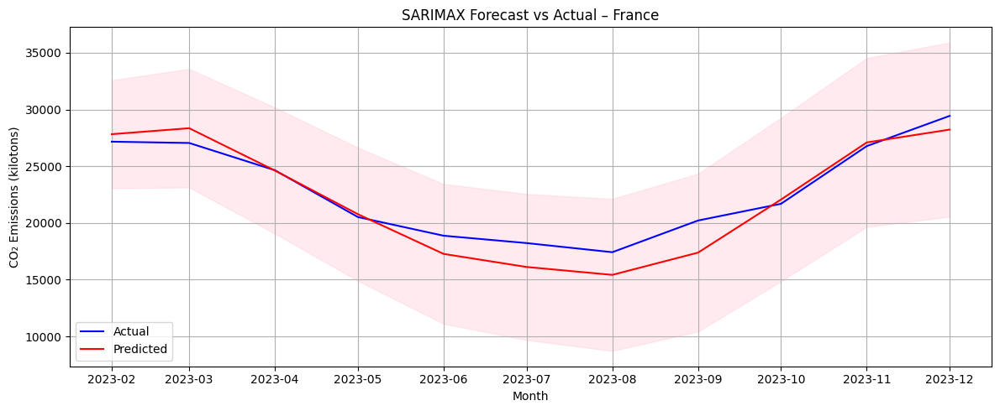


Saved 'sarimax_test_comparison_France.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  27163.232346   27823.601365  -660.369019           660.369019
1 2023-03-01  27048.173994   28349.234137 -1301.060143          1301.060143
2 2023-04-01  24644.126358   24616.726634    27.399724            27.399724
3 2023-05-01  20520.009174   20771.659085  -251.649911           251.649911
4 2023-06-01  18873.769150   17271.104656  1602.664494          1602.664494


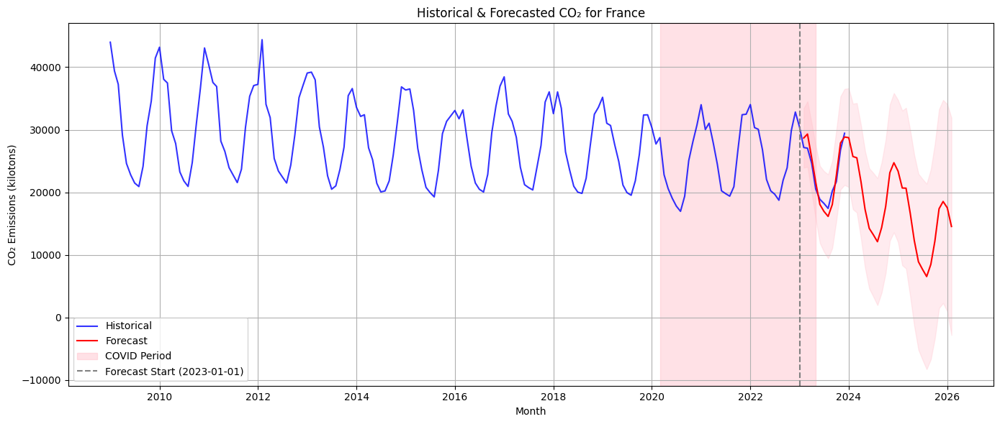


Saved 'sarimax_future_forecast_France.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    28679.018701  23919.517410  33438.519992
1 2023-03-01    29307.341925  24080.374571  34534.309279
2 2023-04-01    25502.658087  19941.672747  31063.643427
3 2023-05-01    21601.377041  15733.833895  27468.920187
4 2023-06-01    18056.112114  11898.063488  24214.160741

=== Processing Ireland ===


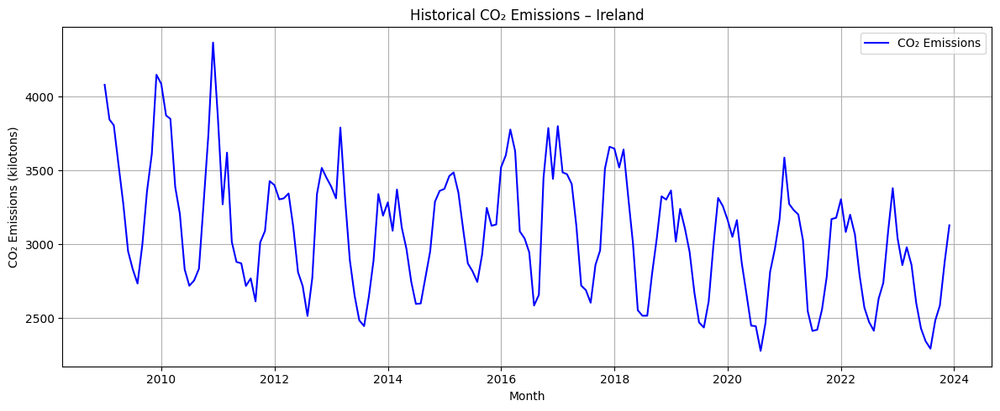

ADF Statistic for Ireland: -1.1929
p-value: 0.6766
Critical Values:
   1%: -3.4701
   5%: -2.8790
   10%: -2.5761
Stationary: False



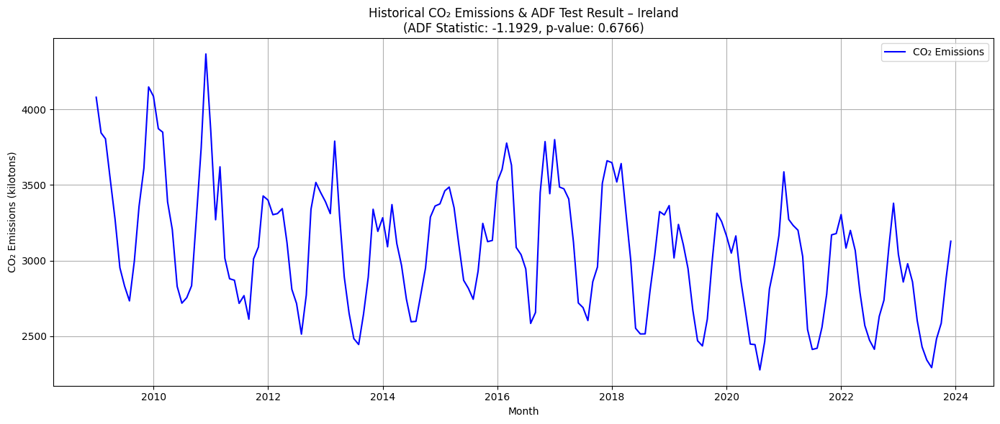

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Ireland (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 152.81    
RMSE       | 171.31    
MAPE       | 5.89%     
R-squared  | 0.5841    
----------------------------------------------------------------------------------------------------


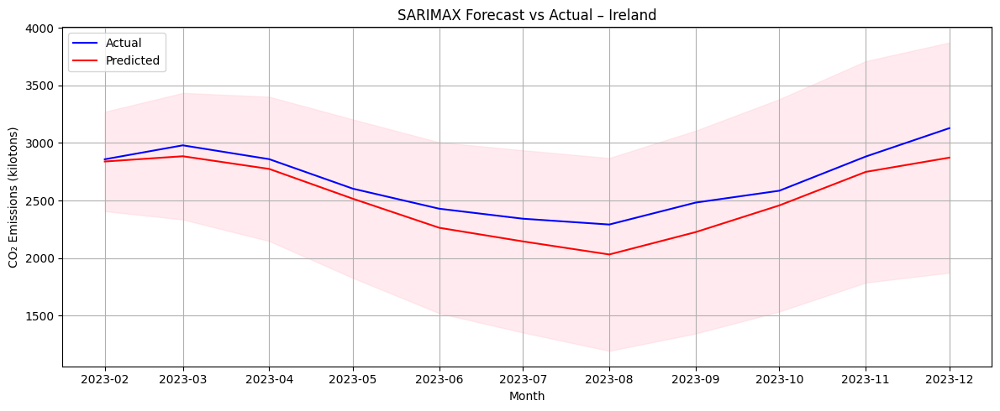


Saved 'sarimax_test_comparison_Ireland.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  2858.135173    2838.809275   19.325899            19.325899
1 2023-03-01  2979.243016    2884.499017   94.744000            94.744000
2 2023-04-01  2859.231048    2774.435866   84.795182            84.795182
3 2023-05-01  2603.262043    2515.983168   87.278876            87.278876
4 2023-06-01  2429.196550    2263.790413  165.406137           165.406137


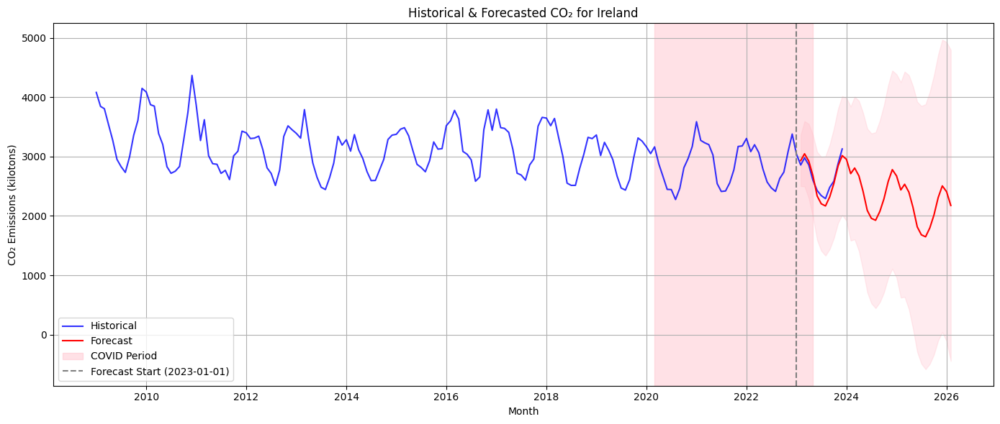


Saved 'sarimax_future_forecast_Ireland.csv'
        Month  Forecasted_CO2     CI_Lower     CI_Upper
0 2023-02-01     2932.741579  2501.370142  3364.113016
1 2023-03-01     3047.015944  2498.001282  3596.030606
2 2023-04-01     2923.022373  2296.983207  3549.061539
3 2023-05-01     2679.541573  1991.902799  3367.180346
4 2023-06-01     2336.526443  1594.987118  3078.065767

=== Processing Italy ===


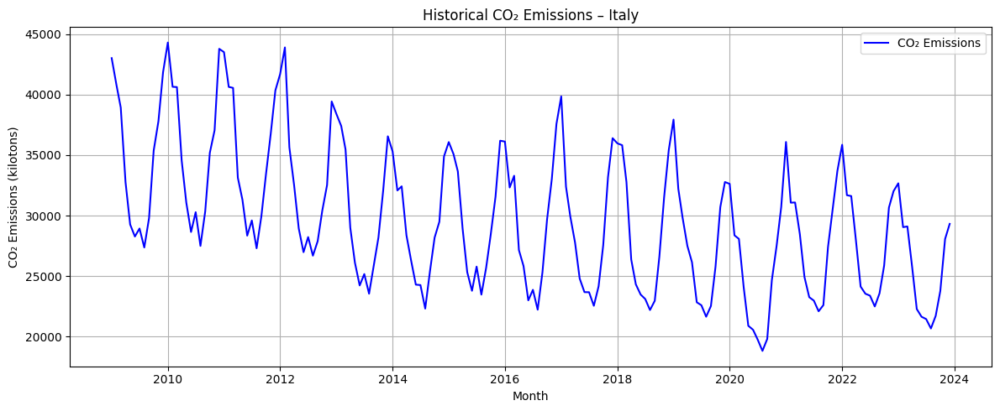

ADF Statistic for Italy: -1.5151
p-value: 0.5260
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



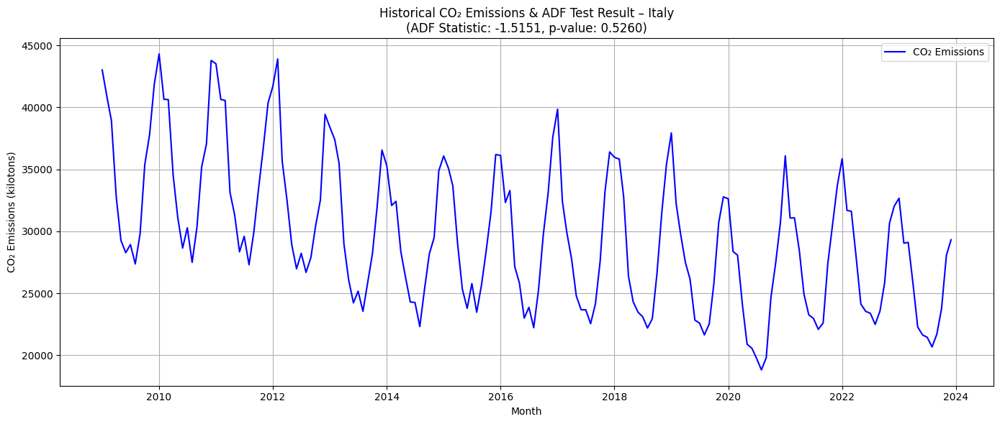

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Italy (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 553.57    
RMSE       | 669.95    
MAPE       | 2.19%     
R-squared  | 0.9601    
----------------------------------------------------------------------------------------------------


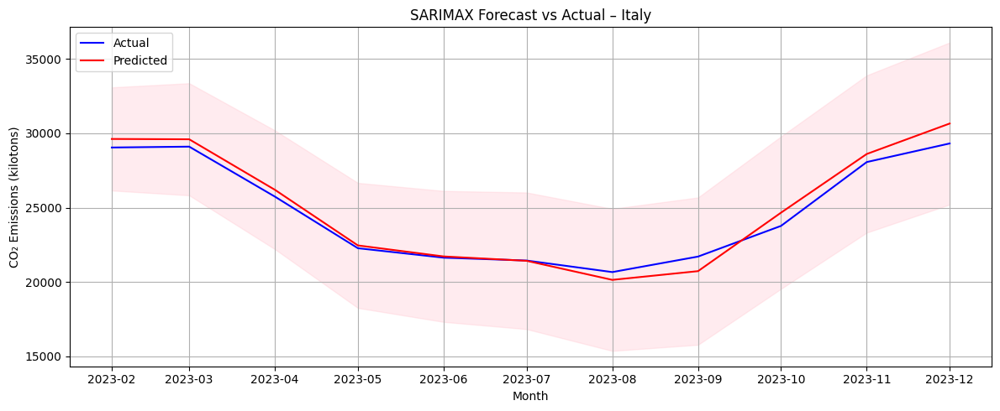


Saved 'sarimax_test_comparison_Italy.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  29046.750209   29620.988732 -574.238524           574.238524
1 2023-03-01  29105.204610   29599.041787 -493.837177           493.837177
2 2023-04-01  25744.022809   26202.538078 -458.515268           458.515268
3 2023-05-01  22276.974007   22464.865612 -187.891605           187.891605
4 2023-06-01  21641.653871   21724.726072  -83.072200            83.072200


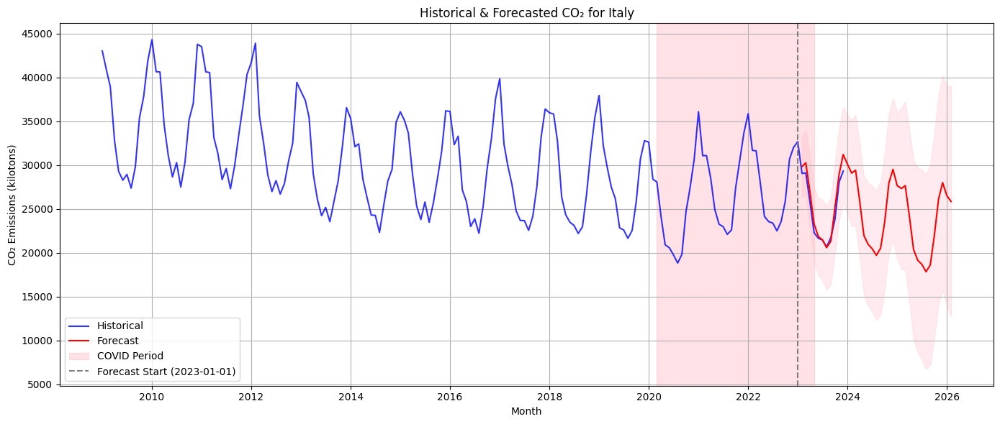


Saved 'sarimax_future_forecast_Italy.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    29839.317082  26373.460579  33305.173585
1 2023-03-01    30257.051102  26490.139452  34023.962752
2 2023-04-01    26832.588873  22840.602400  30824.575346
3 2023-05-01    23278.583608  19077.288315  27479.878901
4 2023-06-01    21842.949129  17442.564158  26243.334099

=== Processing Netherlands ===


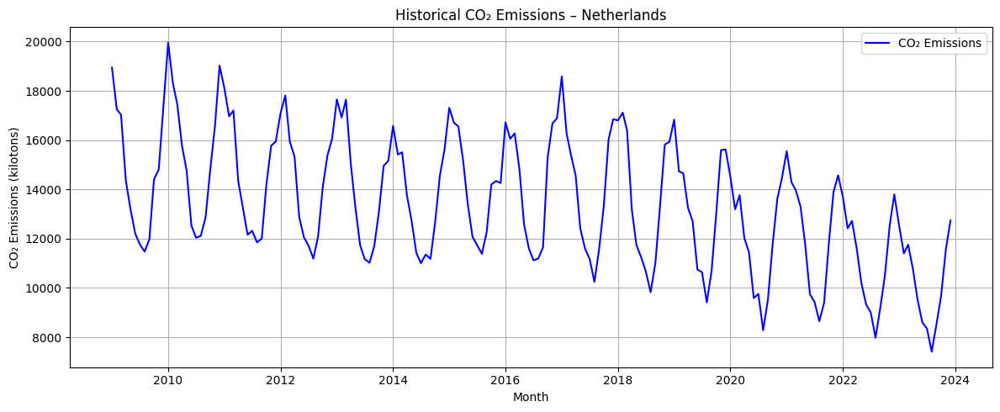

ADF Statistic for Netherlands: 0.5143
p-value: 0.9853
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



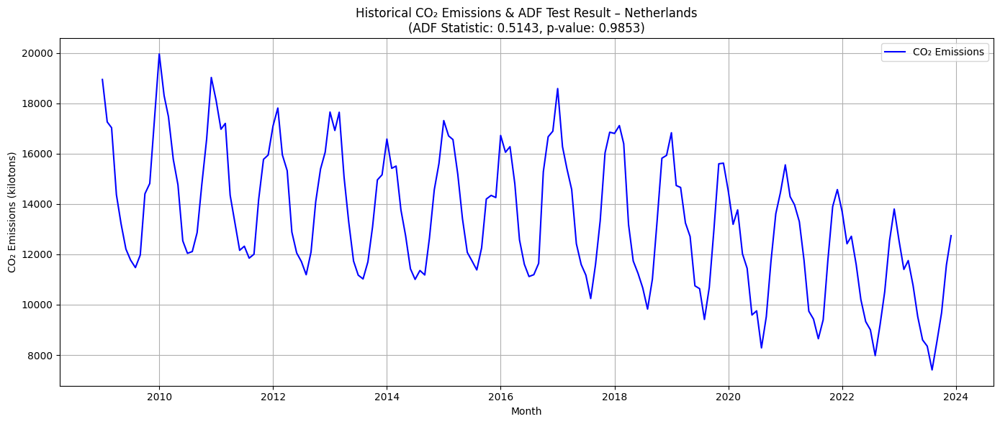

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Netherlands (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 369.13    
RMSE       | 498.40    
MAPE       | 4.24%     
R-squared  | 0.9073    
----------------------------------------------------------------------------------------------------


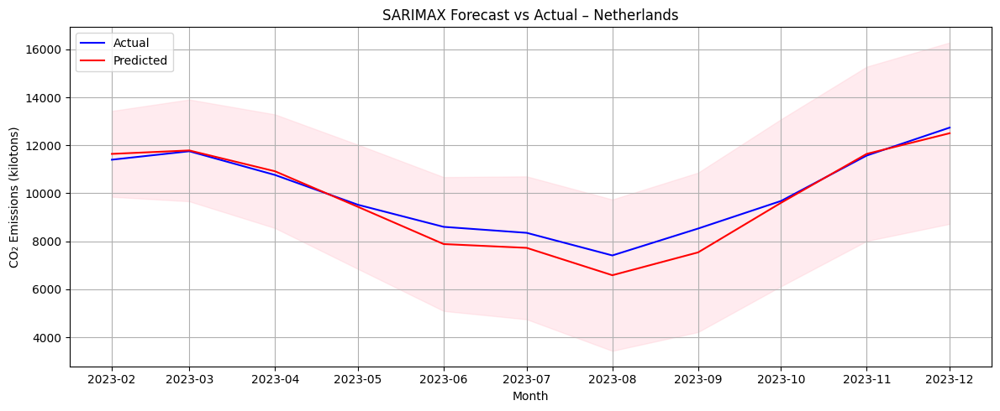


Saved 'sarimax_test_comparison_Netherlands.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  11401.436924   11643.742795 -242.305871           242.305871
1 2023-03-01  11753.282882   11787.202598  -33.919716            33.919716
2 2023-04-01  10764.907832   10918.986829 -154.078998           154.078998
3 2023-05-01   9522.175179    9435.745764   86.429415            86.429415
4 2023-06-01   8601.282842    7883.591973  717.690869           717.690869


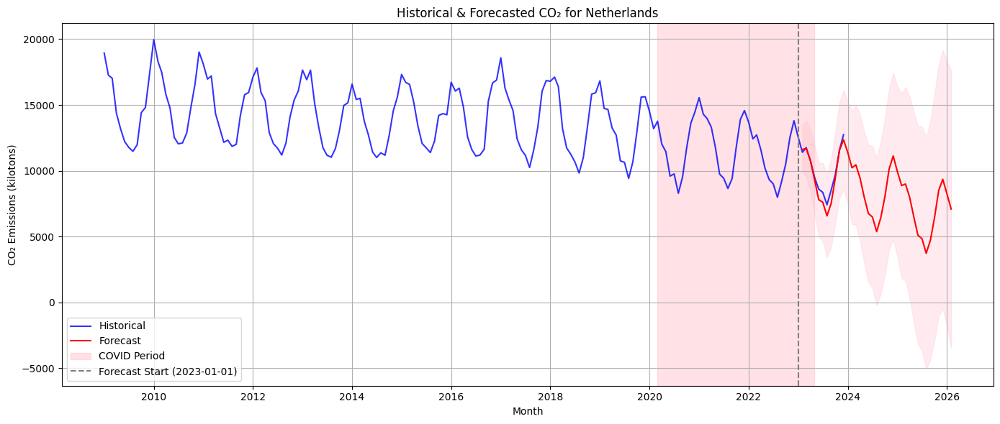


Saved 'sarimax_future_forecast_Netherlands.csv'
        Month  Forecasted_CO2     CI_Lower      CI_Upper
0 2023-02-01    11617.337182  9828.195320  13406.479045
1 2023-03-01    11693.884363  9572.047673  13815.721054
2 2023-04-01    10767.078524  8397.652921  13136.504128
3 2023-05-01     9345.519421  6756.669889  11934.368954
4 2023-06-01     7799.043513  5008.535788  10589.551239

=== Processing Poland ===


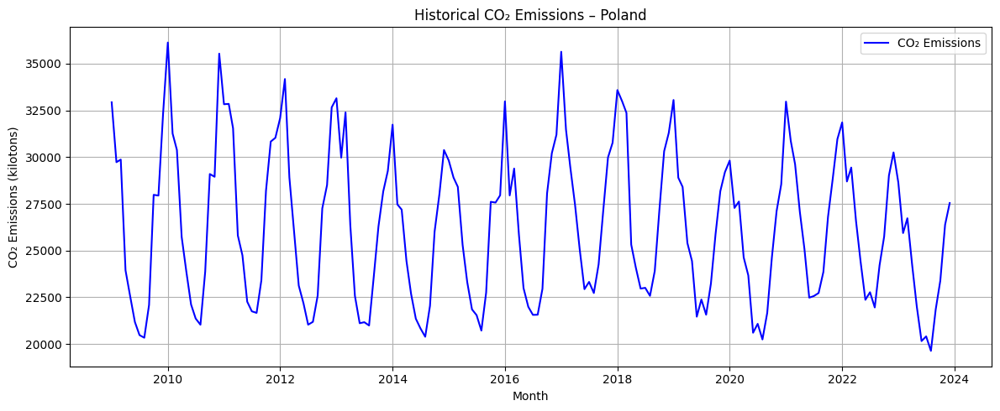

ADF Statistic for Poland: -1.8239
p-value: 0.3687
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



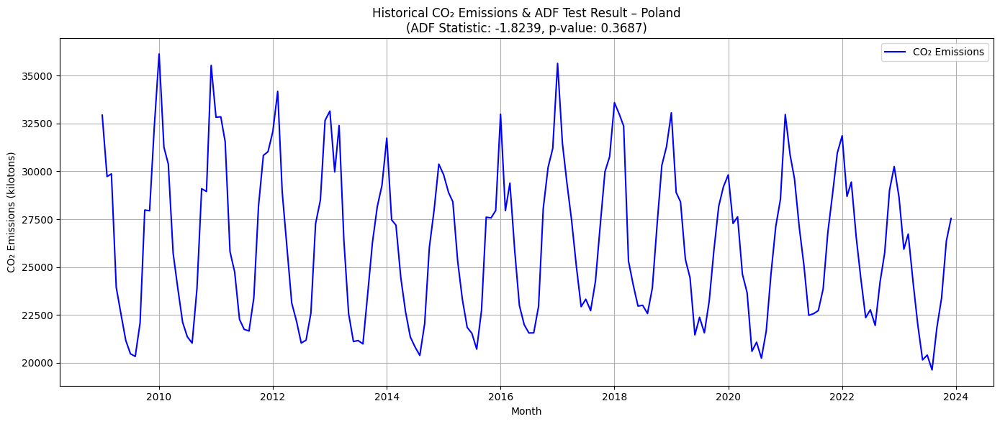

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Poland (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 641.48    
RMSE       | 948.07    
MAPE       | 2.64%     
R-squared  | 0.8797    
----------------------------------------------------------------------------------------------------


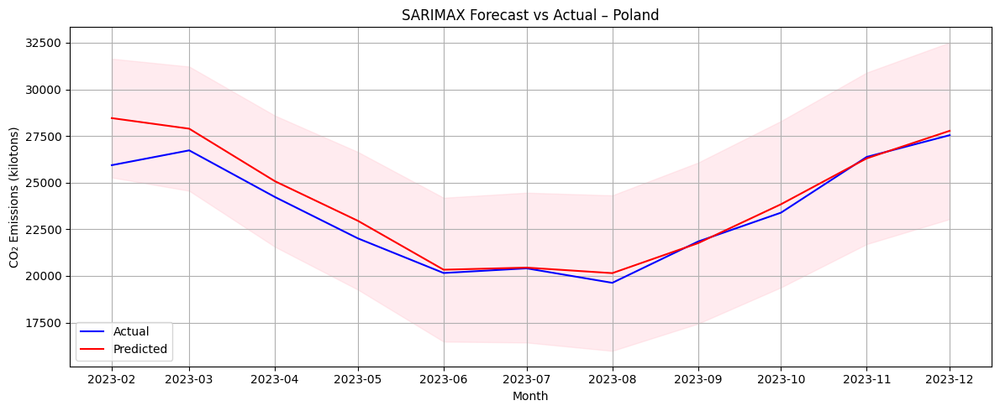


Saved 'sarimax_test_comparison_Poland.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  25936.026455   28457.898180 -2521.871725          2521.871725
1 2023-03-01  26729.181721   27891.001058 -1161.819337          1161.819337
2 2023-04-01  24230.123948   25076.385845  -846.261896           846.261896
3 2023-05-01  22013.294691   22955.344309  -942.049618           942.049618
4 2023-06-01  20158.109222   20334.392602  -176.283379           176.283379


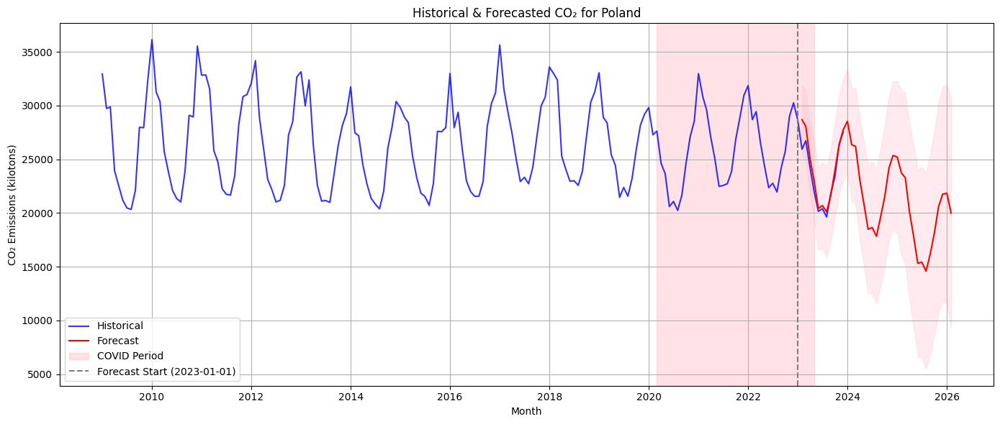


Saved 'sarimax_future_forecast_Poland.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    28681.925477  25499.995121  31863.855833
1 2023-03-01    28055.762357  24727.428005  31384.096710
2 2023-04-01    25062.052800  21547.382086  28576.723514
3 2023-05-01    23015.646246  19327.261874  26704.030618
4 2023-06-01    20430.431301  16575.941277  24284.921326

=== Processing Spain ===


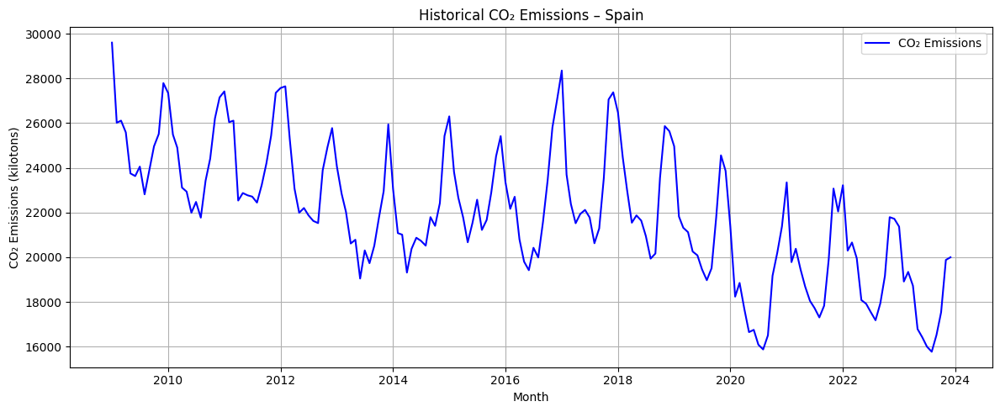

ADF Statistic for Spain: -1.0666
p-value: 0.7282
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



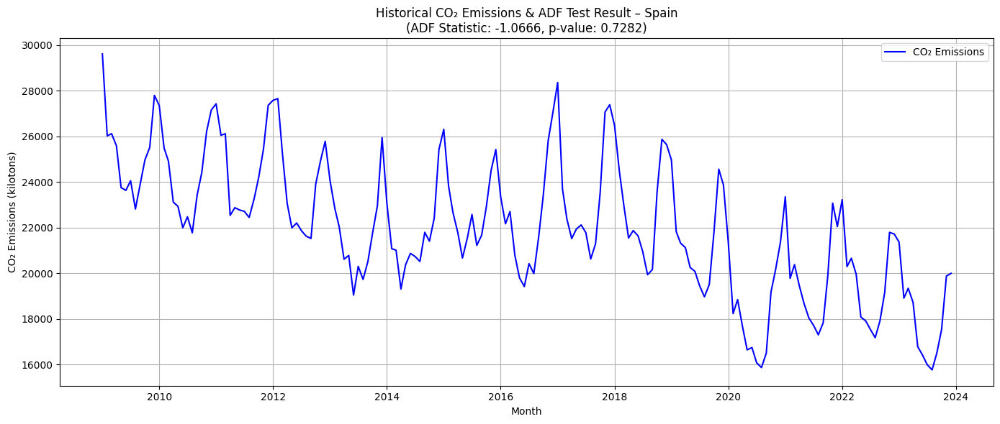

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Spain (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 763.45    
RMSE       | 817.70    
MAPE       | 4.32%     
R-squared  | 0.7133    
----------------------------------------------------------------------------------------------------


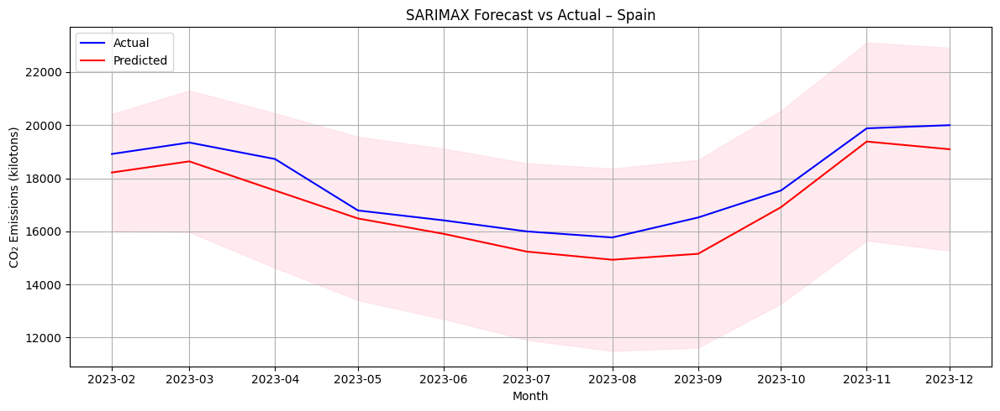


Saved 'sarimax_test_comparison_Spain.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  18913.739341   18216.306543   697.432799           697.432799
1 2023-03-01  19344.562202   18635.197080   709.365123           709.365123
2 2023-04-01  18724.030617   17539.069205  1184.961411          1184.961411
3 2023-05-01  16786.861266   16485.754733   301.106533           301.106533
4 2023-06-01  16414.423633   15906.551359   507.872274           507.872274


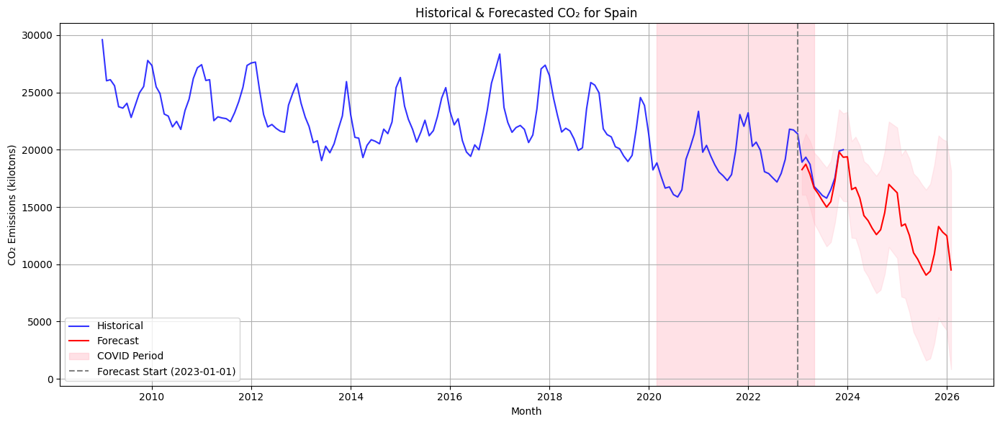


Saved 'sarimax_future_forecast_Spain.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    18263.799465  16062.956018  20464.642912
1 2023-03-01    18737.282114  16070.534750  21404.029478
2 2023-04-01    17843.144094  14933.335945  20752.952243
3 2023-05-01    16659.649306  13584.030131  19735.268481
4 2023-06-01    16141.033575  12932.591335  19349.475815

=== Processing Sweden ===


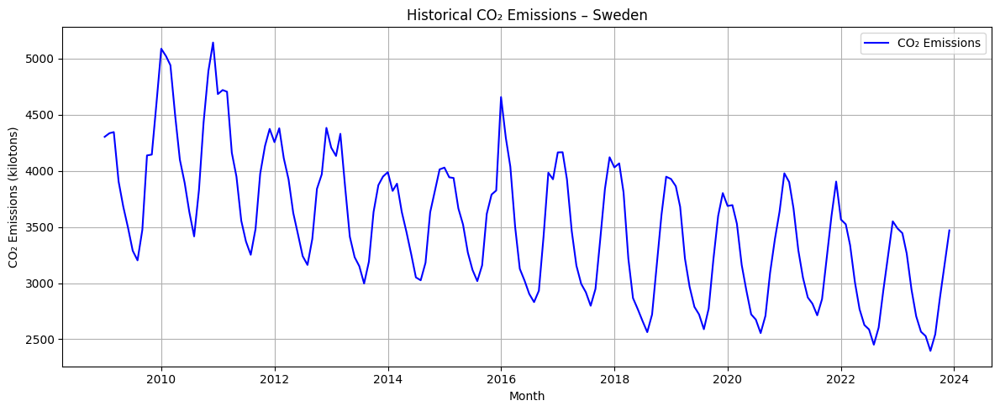

ADF Statistic for Sweden: -1.4989
p-value: 0.5341
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



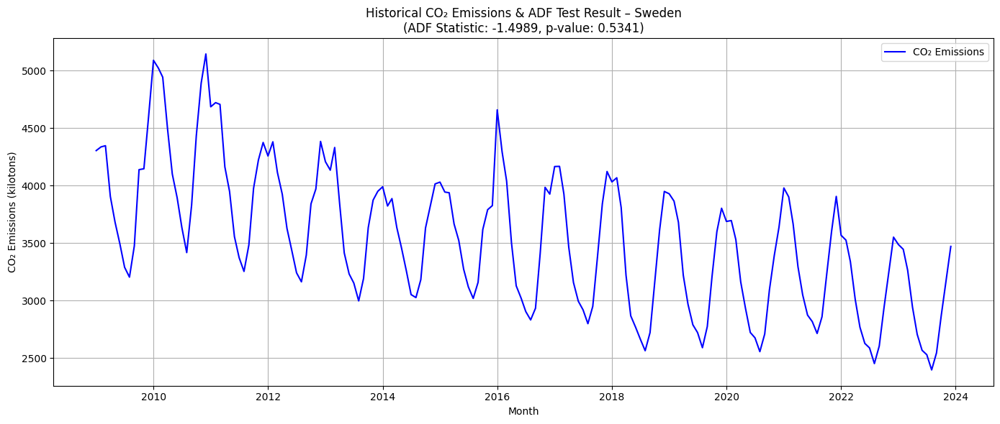

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Evaluation Metrics for Sweden (Test Set):
----------------------------------------------------------------------------------------------------
Metric     | SARIMAX   
----------------------------------------------------------------------------------------------------
MAE        | 116.71    
RMSE       | 122.42    
MAPE       | 4.21%     
R-squared  | 0.8900    
----------------------------------------------------------------------------------------------------


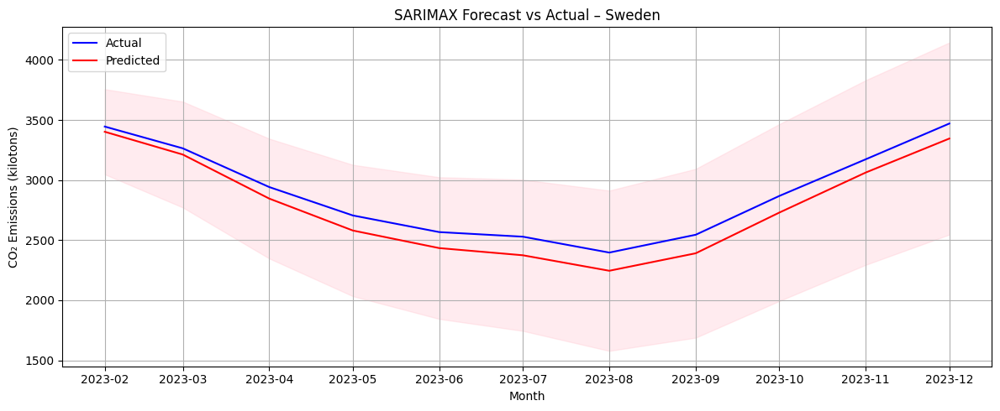


Saved 'sarimax_test_comparison_Sweden.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  3445.403540    3402.134690   43.268850            43.268850
1 2023-03-01  3264.110514    3212.363326   51.747188            51.747188
2 2023-04-01  2941.981960    2845.933735   96.048225            96.048225
3 2023-05-01  2705.426422    2580.079056  125.347366           125.347366
4 2023-06-01  2566.987493    2433.708661  133.278832           133.278832


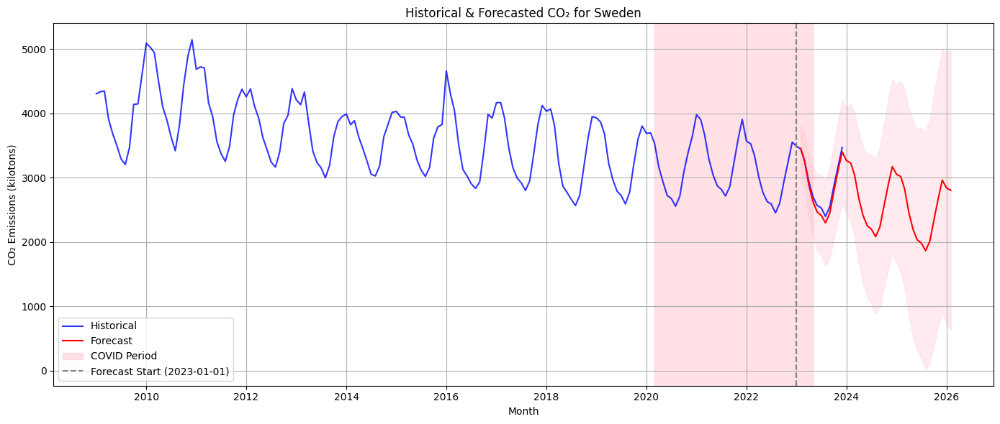


Saved 'sarimax_future_forecast_Sweden.csv'
        Month  Forecasted_CO2     CI_Lower     CI_Upper
0 2023-02-01     3453.536334  3099.195350  3807.877317
1 2023-03-01     3260.407535  2819.780512  3701.034559
2 2023-04-01     2887.303638  2388.795826  3385.811450
3 2023-05-01     2633.148009  2086.543978  3179.752041
4 2023-06-01     2465.485059  1875.738093  3055.232024

=== Model Performance Comparison ===
----------------------------------------------------------------------------------------------------
Country         | RMSE       | MAE        | MAPE       | R-squared 
----------------------------------------------------------------------------------------------------
Austria         | 282.78     | 250.96     | 5.78%      | 0.8619    
Belgium         | 346.19     | 304.35     | 4.73%      | 0.9279    
Germany         | 2279.14    | 1884.23    | 3.87%      | 0.9203    
France          | 1443.04    | 1153.12    | 5.56%      | 0.8717    
Ireland         | 171.31     | 152.81     | 5

In [3]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
    r2_score
)
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# Forecast monthly CO2 emissions for multiple countries, capturing pre, during, and post-COVID,
# using exogenous covariates (GDP, Energy Consumption, StringencyIndex, Mobility_Index).

# Collect and Clean Data with Exogenous covariates
def load_with_exog(filepath, country_name):
    try:
        df = pd.read_excel(filepath)
        # Cleaning column names (remove spaces, use underscores)
        df.columns = df.columns.str.strip().str.replace(' ', '_')
        # Converting 'Month' column to a proper date format
        df['Month'] = pd.to_datetime(df['Month'], format='%Y-%m')
        # Filter data for the chosen country and sort by date
        df = df[df['Name'] == country_name].sort_values('Month')
        # Choosing columns to be used
        exog_cols = ['GDP', 'Energy_Consumption_TWh', 'StringencyIndex', 'Mobility_Index']
        df = df[['Month', 'MonthlyTotal'] + exog_cols].dropna()  # Remove rows with missing values
        df = df.set_index('Month')
        # Split into CO2 data (what we predict) and factors (what influences it)
        endog = df['MonthlyTotal']
        exog = df[exog_cols]
        return endog, exog
    except Exception as e:
        print(f"Problem loading data for {country_name}: {e}")
        return None, None

# Exploratory Analysis
def exploratory_analysis(endog, country_name):
    plt.figure(figsize=(12, 5))
    plt.plot(endog.index, endog, color='blue', label='CO₂ Emissions')
    plt.title(f'Historical CO₂ Emissions – {country_name}')
    plt.xlabel('Month')
    plt.ylabel('CO₂ Emissions (kilotons)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Stationarity Test (ADF Test)
def adf_test_and_visualization(endog, country_name):
    """
    Tests if the CO2 data is stable (good for predictions) and shows a graph.
    """
    try:
        result = adfuller(endog)
        print(f'ADF Statistic for {country_name}: {result[0]:.4f}')
        print(f'p-value: {result[1]:.4f}')
        print('Critical Values:')
        for key, value in result[4].items():
            print(f'   {key}: {value:.4f}')
        is_stationary = result[1] < 0.05
        print(f'Stationary: {is_stationary}\n')

        plt.figure(figsize=(14, 6))
        plt.plot(endog.index, endog, color='blue', label='CO₂ Emissions')
        plt.title(f'Historical CO₂ Emissions & ADF Test Result – {country_name}\n(ADF Statistic: {result[0]:.4f}, p-value: {result[1]:.4f})')
        plt.xlabel('Month')
        plt.ylabel('CO₂ Emissions (kilotons)')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error in ADF test for {country_name}: {e}")

# Splitting Data into Training and Testing
def split_with_exog(endog, exog, cutoff='2023-01-01'):
    """
    Divides data into training (before cutoff) and testing (after cutoff) parts.
    """
    try:
        # Split CO2 data
        train_endog = endog[endog.index <= cutoff]
        test_endog = endog[endog.index > cutoff]
        # Split influencing factors
        train_exog = exog.loc[train_endog.index]
        test_exog = exog.loc[test_endog.index]
        return train_endog, test_endog, train_exog, test_exog
    except Exception as e:
        print(f"Error splitting data: {e}")
        return None, None, None, None

# Building and training model
def train_sarimax_with_exog(endog_train, exog_train, country_name,
                            order=(1,1,1), seasonal_order=(1,1,1,12), trend='t'):
    try:
        """
        Creating a model (SARIMAX) to predict CO2 emissions using historical data and factors.
        """
        model = SARIMAX(
            endog_train,
            exog=exog_train,
            order=order,
            seasonal_order=seasonal_order,
            trend=trend,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        fit = model.fit(disp=False)
        return fit
    except Exception as e:
        print(f"Error training SARIMAX for {country_name}: {e}")
        return None

# Evaluating the model
def evaluate_model(fit, endog_test, exog_test, country_name):
    try:
        """
        Tests the model by comparing predictions to actual CO2 data and draws a graph.
        """
        fc = fit.get_forecast(steps=len(endog_test), exog=exog_test)
        pred = fc.predicted_mean
        ci = fc.conf_int().astype(float)
        lower_ci = ci.iloc[:,0].to_numpy()
        upper_ci = ci.iloc[:,1].to_numpy()

        # Metrics
        mae = mean_absolute_error(endog_test, pred)
        rmse = np.sqrt(mean_squared_error(endog_test, pred))
        mape = mean_absolute_percentage_error(endog_test, pred)
        r2 = r2_score(endog_test, pred)

        # Print metrics
        print(f"\nEvaluation Metrics for {country_name} (Test Set):")
        print("-" * 100)
        print(f"{'Metric':<10} | {'SARIMAX':<10}")
        print("-" * 100)
        print(f"{'MAE':<10} | {mae:<10.2f}")
        print(f"{'RMSE':<10} | {rmse:<10.2f}")
        print(f"{'MAPE':<10} | {mape:<10.2%}")
        print(f"{'R-squared':<10} | {r2:<10.4f}")
        print("-" * 100)

        # Plot
        plt.figure(figsize=(12, 5))
        plt.plot(endog_test.index, endog_test, label='Actual', color='blue')
        plt.plot(endog_test.index, pred, label='Predicted', color='red')
        plt.fill_between(endog_test.index, lower_ci, upper_ci, color='pink', alpha=0.3)
        plt.title(f'SARIMAX Forecast vs Actual – {country_name}')
        plt.xlabel('Month')
        plt.ylabel('CO₂ Emissions (kilotons)')
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()

        # Export comparison
        comp = pd.DataFrame({
            'Month': endog_test.index,
            'Actual_CO2': endog_test.values,
            'Predicted_CO2': pred.values,
            'Difference': (endog_test - pred).values,
            'Absolute_Difference': np.abs(endog_test - pred).values
        })
        comp.to_csv(f'sarimax_test_comparison_{country_name}.csv', index=False)
        print(f"\nSaved 'sarimax_test_comparison_{country_name}.csv'\n", comp.head())
        return rmse, mae, mape, r2
    except Exception as e:
        print(f"Error evaluating model for {country_name}: {e}")
        return None, None, None, None

# Forecast Future with Exog predicting CO2 emissions + Visualization
def forecast_and_plot_future(fit, endog, exog, start_date, end_date, country_name):
    try:
        fut_idx = pd.date_range(start=start_date, end=end_date, freq='MS')
        # Use the last known values for factors, with some growth
        last_exog = exog.iloc[-1]
        fut_exog = pd.DataFrame({
            'GDP': last_exog['GDP'] * (1.05 ** np.arange(1, len(fut_idx)+1)),  # Assume 5% growth
            'Energy_Consumption_TWh': last_exog['Energy_Consumption_TWh'] * (1.02 ** np.arange(1, len(fut_idx)+1)),  # Assume 2% growth
            'StringencyIndex': 0,  # Assume no COVID restrictions
            'Mobility_Index': last_exog['Mobility_Index']  # Keep movement the same
        }, index=fut_idx)

        # Predict future CO2
        fc = fit.get_forecast(steps=len(fut_idx), exog=fut_exog)
        pred = fc.predicted_mean
        ci = fc.conf_int().astype(float)
        lower_ci = ci.iloc[:,0].to_numpy()
        upper_ci = ci.iloc[:,1].to_numpy()

        # Drawing a graph with past and future CO2
        plt.figure(figsize=(14, 6))
        plt.plot(endog.index, endog.values, label='Historical', color='blue', alpha=0.8)
        plt.plot(pred.index, pred, label='Forecast', color='red')
        plt.fill_between(pred.index, lower_ci, upper_ci, color='pink', alpha=0.3)
        plt.axvspan(pd.to_datetime('2020-03-01'), pd.to_datetime('2023-05-01'),
                    color='lightpink', alpha=0.4, label='COVID Period')
        plt.axvline(pd.to_datetime(start_date), color='gray', linestyle='--',
                    label=f'Forecast Start ({start_date})')
        plt.title(f'Historical & Forecasted CO₂ for {country_name}')
        plt.xlabel('Month')
        plt.ylabel('CO₂ Emissions (kilotons)')
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()

        fut_df = pd.DataFrame({
            'Month': pred.index,
            'Forecasted_CO2': pred.values,
            'CI_Lower': lower_ci,
            'CI_Upper': upper_ci
        })
        fut_df.to_csv(f'sarimax_future_forecast_{country_name}.csv', index=False)
        print(f"\nSaved 'sarimax_future_forecast_{country_name}.csv'\n", fut_df.head())
    except Exception as e:
        print(f"Error forecasting for {country_name}: {e}")

# Execute for Multiple Countries
if __name__ == "__main__":
    FILEPATH = 'cgrt_edgar_combined1.xlsx'
    COUNTRIES = ['Austria', 'Belgium', 'Germany', 'France', 'Ireland', 'Italy', 'Netherlands', 'Poland', 'Spain', 'Sweden'] # Insert the country or countries to view
    metrics = {}

    for COUNTRY_NAME in COUNTRIES:
        print(f"\n=== Processing {COUNTRY_NAME} ===")
        endog, exog = load_with_exog(FILEPATH, COUNTRY_NAME)
        if endog is None or exog is None:
            continue
        exploratory_analysis(endog, COUNTRY_NAME)
        adf_test_and_visualization(endog, COUNTRY_NAME)
        train_y, test_y, train_x, test_x = split_with_exog(endog, exog, cutoff='2023-01-01')
        if train_y is None:
            continue
        fit = train_sarimax_with_exog(train_y, train_x, COUNTRY_NAME)
        if fit is None:
            continue
        rmse, mae, mape, r2 = evaluate_model(fit, test_y, test_x, COUNTRY_NAME)
        if rmse is None:
            continue
        forecast_and_plot_future(fit, endog, exog, '2023-01-01', '2026-01-01', COUNTRY_NAME)
        metrics[COUNTRY_NAME] = {'RMSE': rmse, 'MAE': mae, 'MAPE': mape, 'R-squared': r2}

    # Compare metrics
    if metrics:
        print("\n=== Model Performance Comparison ===")
        print("-" * 100)
        print(f"{'Country':<15} | {'RMSE':<10} | {'MAE':<10} | {'MAPE':<10} | {'R-squared':<10}")
        print("-" * 100)
        for country, metric in metrics.items():
            print(f"{country:<15} | {metric['RMSE']:<10.2f} | {metric['MAE']:<10.2f} | {metric['MAPE']:<10.2%} | {metric['R-squared']:<10.4f}")
        print("-" * 100)

##SARIMAX and XGBoost model comparison with exogenous features

Removing 6 columns that are too similar: ['C1E_School_closing', 'C2E_Workplace_closing', 'C3E_Cancel_public_events', 'C4E_Restrictions_on_gatherings', 'C6E_Stay_at_home_requirements', 'C8E_International_travel_controls']

=== Processing Austria ===


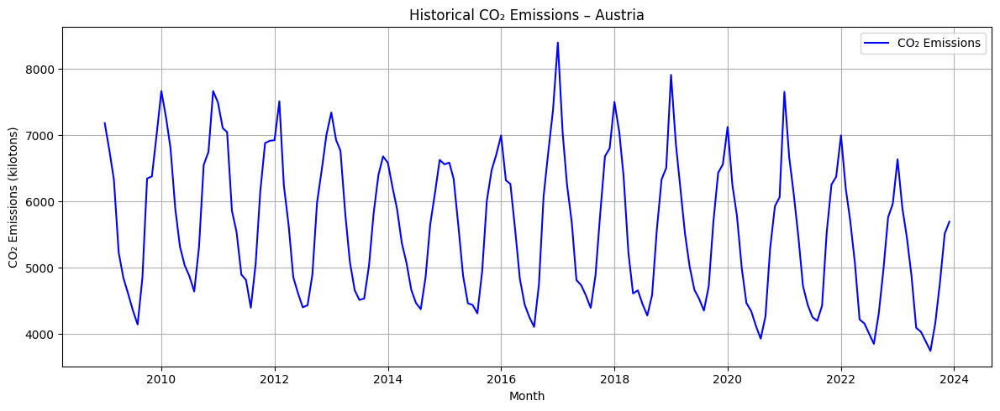

ADF Statistic for Austria: -0.6640
p-value: 0.8559
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



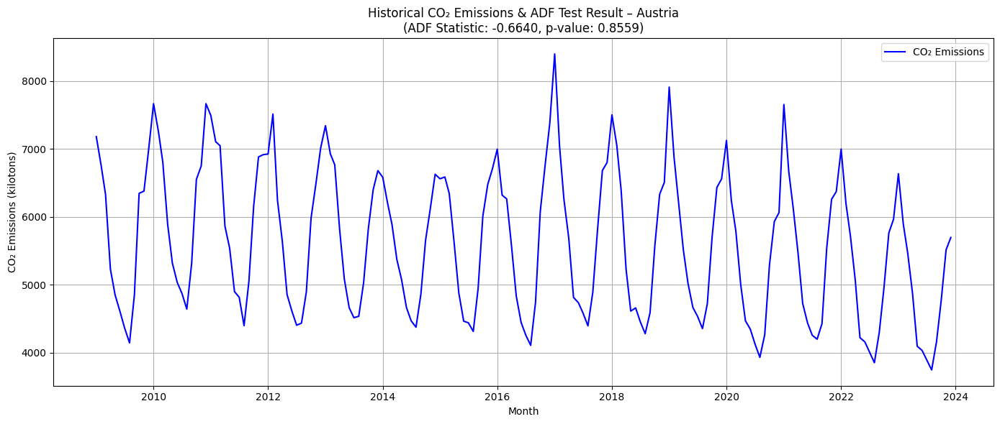

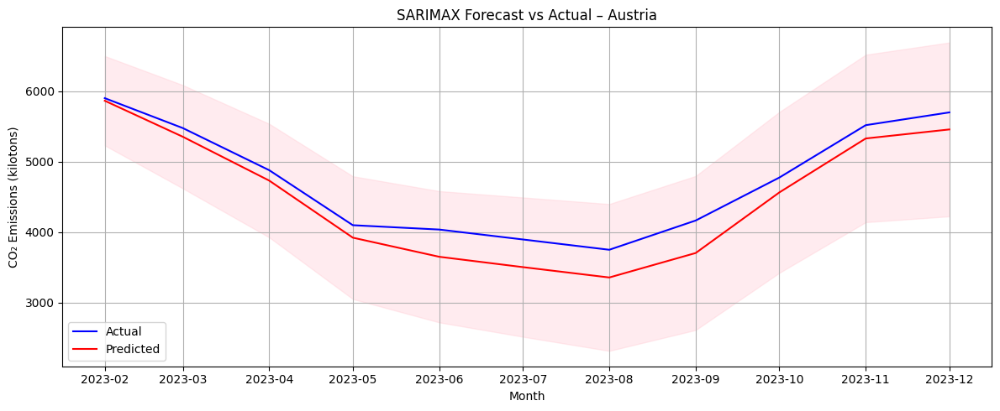


Saved 'sarimax_test_comparison_Austria.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  5900.087113    5863.378267   36.708846            36.708846
1 2023-03-01  5475.470858    5352.146710  123.324148           123.324148
2 2023-04-01  4877.425768    4729.820708  147.605061           147.605061
3 2023-05-01  4096.731921    3919.771911  176.960010           176.960010
4 2023-06-01  4034.937556    3648.410895  386.526662           386.526662
Best Parameters for Austria: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 200}


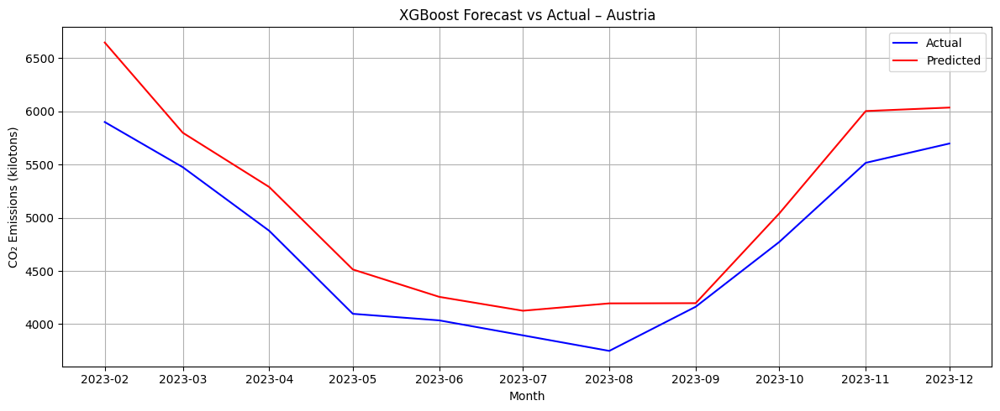


Saved 'xgboost_test_comparison_Austria.csv'
           Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
1681 2023-02-01  5900.087113    6647.768555 -747.681441           747.681441
1682 2023-03-01  5475.470858    5799.407227 -323.936369           323.936369
1683 2023-04-01  4877.425768    5289.162109 -411.736341           411.736341
1684 2023-05-01  4096.731921    4513.743652 -417.011732           417.011732
1685 2023-06-01  4034.937556    4256.174805 -221.237248           221.237248

=== Processing Belgium ===


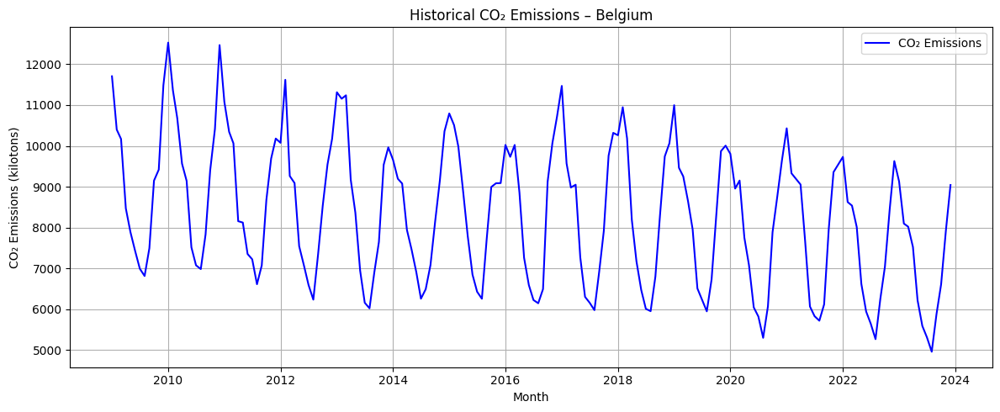

ADF Statistic for Belgium: -0.2307
p-value: 0.9348
Critical Values:
   1%: -3.4699
   5%: -2.8789
   10%: -2.5760
Stationary: False



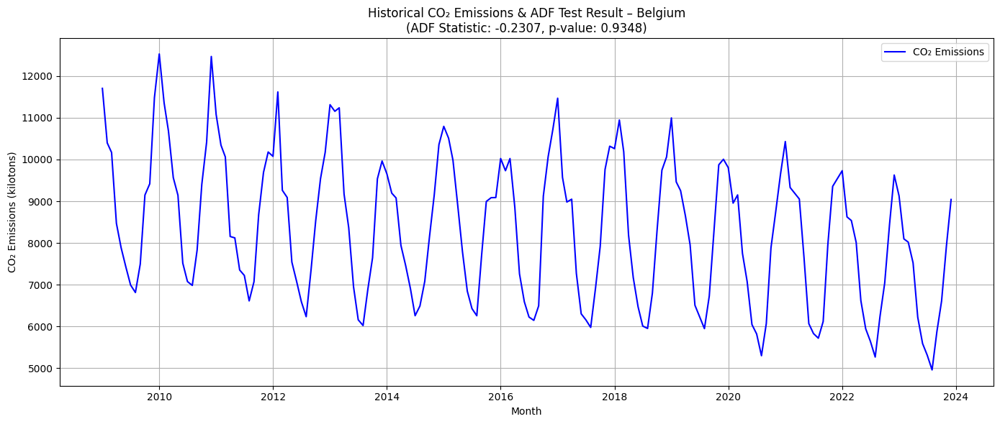

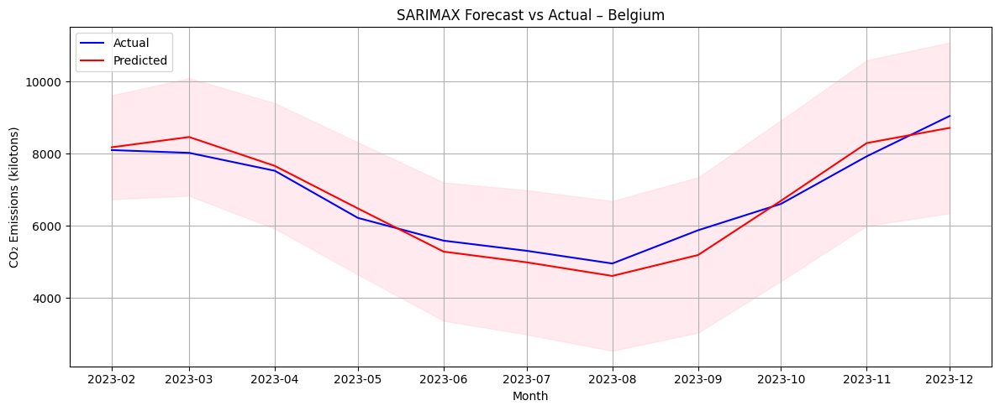


Saved 'sarimax_test_comparison_Belgium.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  8097.974378    8175.691069  -77.716691            77.716691
1 2023-03-01  8020.984974    8459.503795 -438.518821           438.518821
2 2023-04-01  7524.211649    7658.638934 -134.427285           134.427285
3 2023-05-01  6220.430661    6481.775230 -261.344570           261.344570
4 2023-06-01  5590.271261    5286.659123  303.612138           303.612138
Best Parameters for Belgium: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 200}


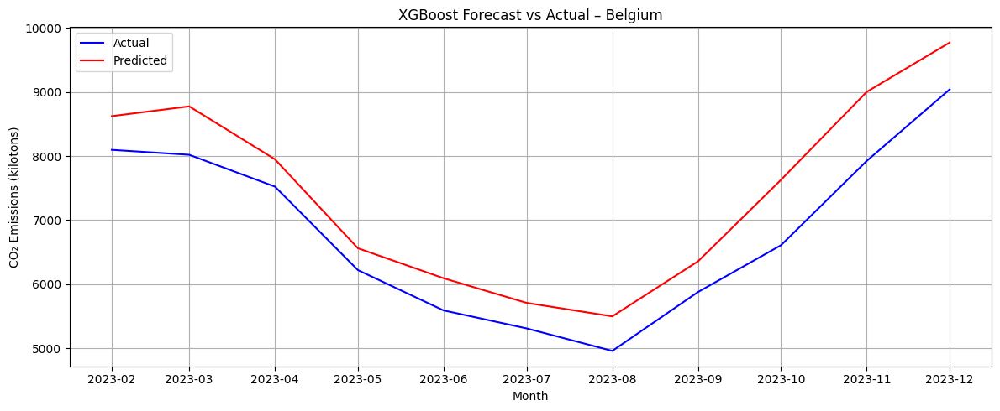


Saved 'xgboost_test_comparison_Belgium.csv'
           Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
1693 2023-02-01  8097.974378    8624.641602 -526.667223           526.667223
1694 2023-03-01  8020.984974    8777.546875 -756.561901           756.561901
1695 2023-04-01  7524.211649    7950.997070 -426.785421           426.785421
1696 2023-05-01  6220.430661    6561.777832 -341.347171           341.347171
1697 2023-06-01  5590.271261    6092.969238 -502.697977           502.697977

=== Processing Germany ===


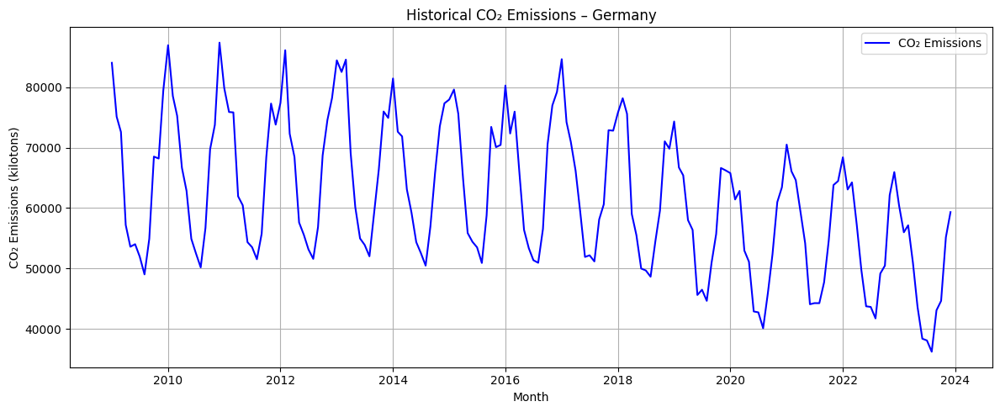

ADF Statistic for Germany: 0.9547
p-value: 0.9938
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



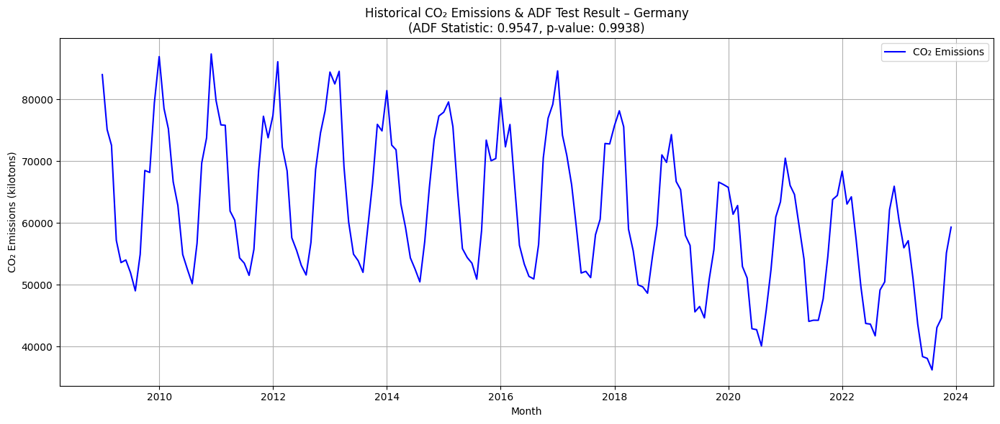

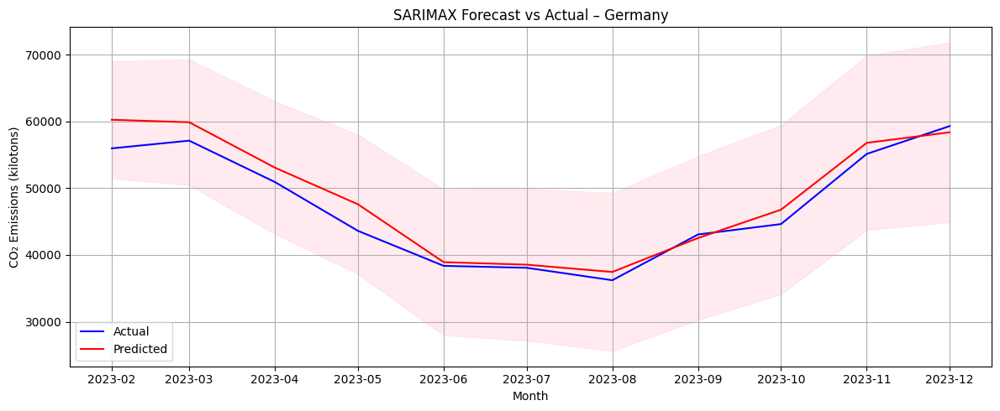


Saved 'sarimax_test_comparison_Germany.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  55985.026987   60273.676504 -4288.649517          4288.649517
1 2023-03-01  57140.411905   59901.073486 -2760.661581          2760.661581
2 2023-04-01  50936.192424   53093.483100 -2157.290675          2157.290675
3 2023-05-01  43623.413774   47604.207293 -3980.793519          3980.793519
4 2023-06-01  38372.806203   38925.035387  -552.229185           552.229185
Best Parameters for Germany: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


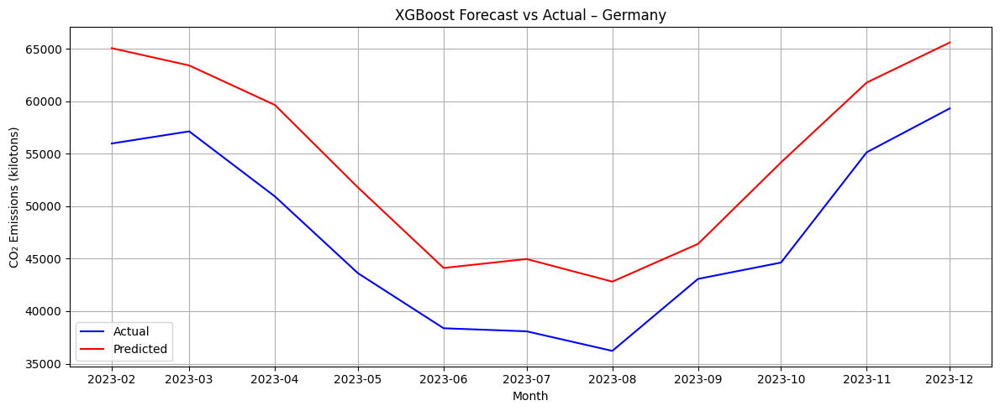


Saved 'xgboost_test_comparison_Germany.csv'
           Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
1717 2023-02-01  55985.026987   65069.265625 -9084.238638          9084.238638
1718 2023-03-01  57140.411905   63422.257812 -6281.845907          6281.845907
1719 2023-04-01  50936.192424   59655.398438 -8719.206013          8719.206013
1720 2023-05-01  43623.413774   51796.589844 -8173.176070          8173.176070
1721 2023-06-01  38372.806203   44121.882812 -5749.076610          5749.076610

=== Processing France ===


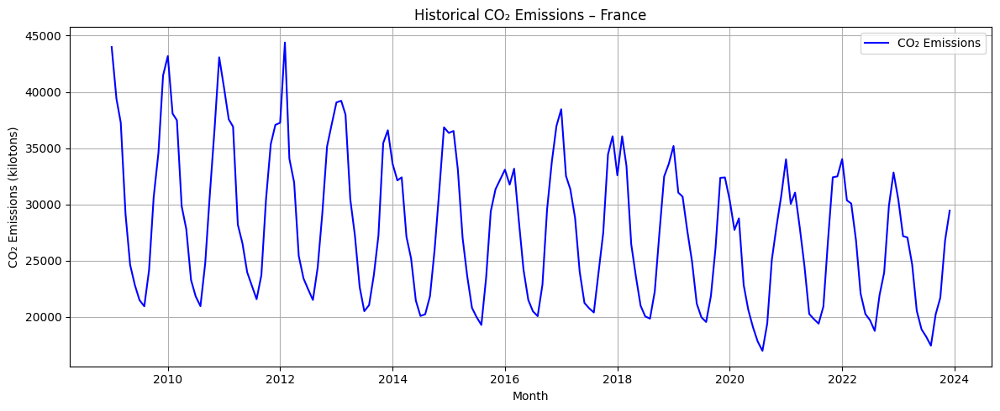

ADF Statistic for France: -0.5499
p-value: 0.8819
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



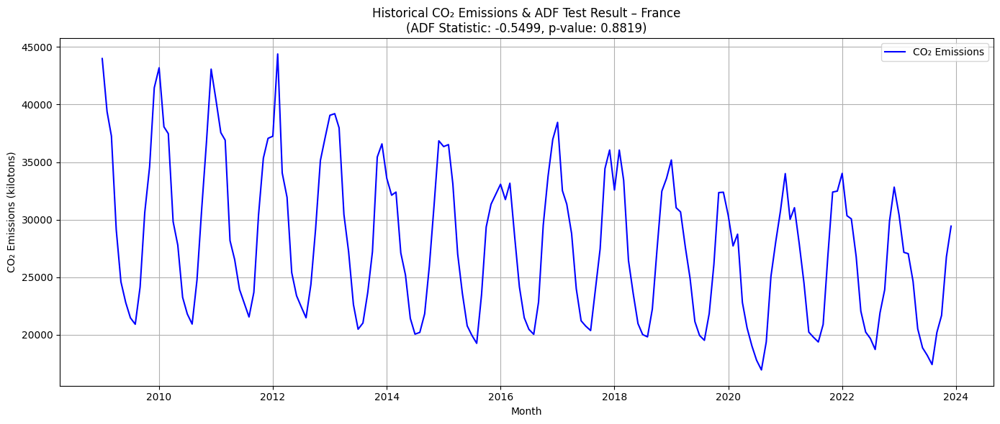

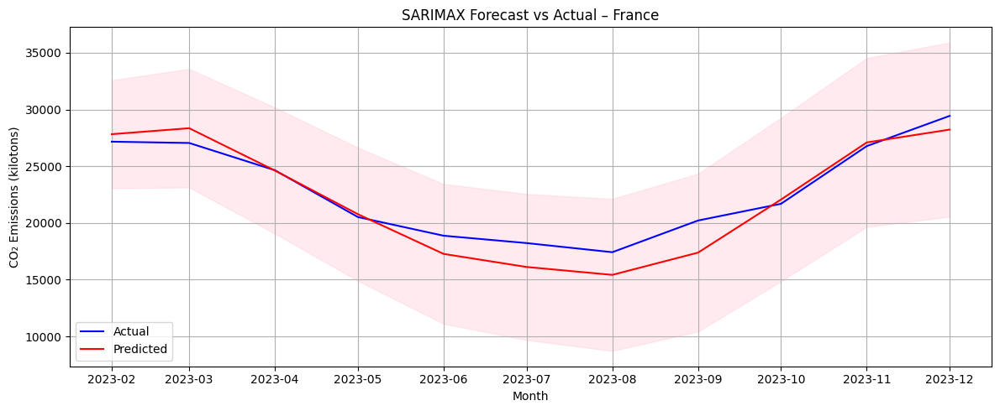


Saved 'sarimax_test_comparison_France.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  27163.232346   27823.601365  -660.369019           660.369019
1 2023-03-01  27048.173994   28349.234137 -1301.060143          1301.060143
2 2023-04-01  24644.126358   24616.726634    27.399724            27.399724
3 2023-05-01  20520.009174   20771.659085  -251.649911           251.649911
4 2023-06-01  18873.769150   17271.104656  1602.664494          1602.664494
Best Parameters for France: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


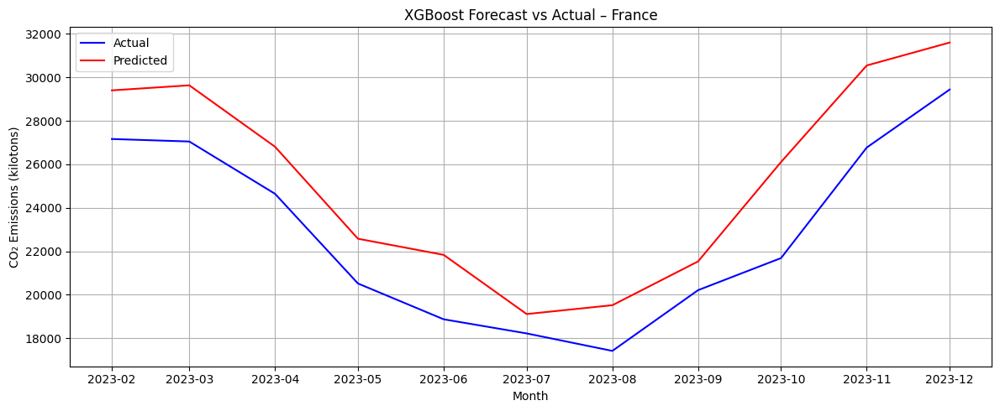


Saved 'xgboost_test_comparison_France.csv'
           Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
1705 2023-02-01  27163.232346   29399.060547 -2235.828200          2235.828200
1706 2023-03-01  27048.173994   29631.296875 -2583.122881          2583.122881
1707 2023-04-01  24644.126358   26807.382812 -2163.256454          2163.256454
1708 2023-05-01  20520.009174   22578.218750 -2058.209576          2058.209576
1709 2023-06-01  18873.769150   21836.158203 -2962.389053          2962.389053

=== Processing Ireland ===


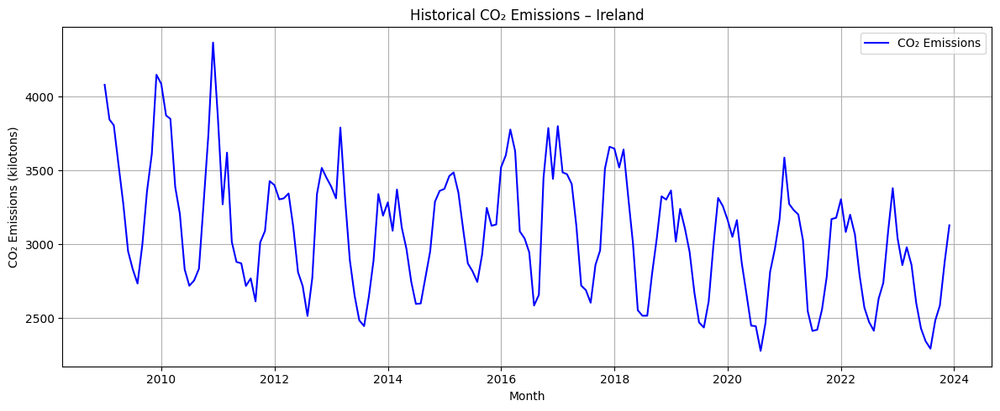

ADF Statistic for Ireland: -1.1929
p-value: 0.6766
Critical Values:
   1%: -3.4701
   5%: -2.8790
   10%: -2.5761
Stationary: False



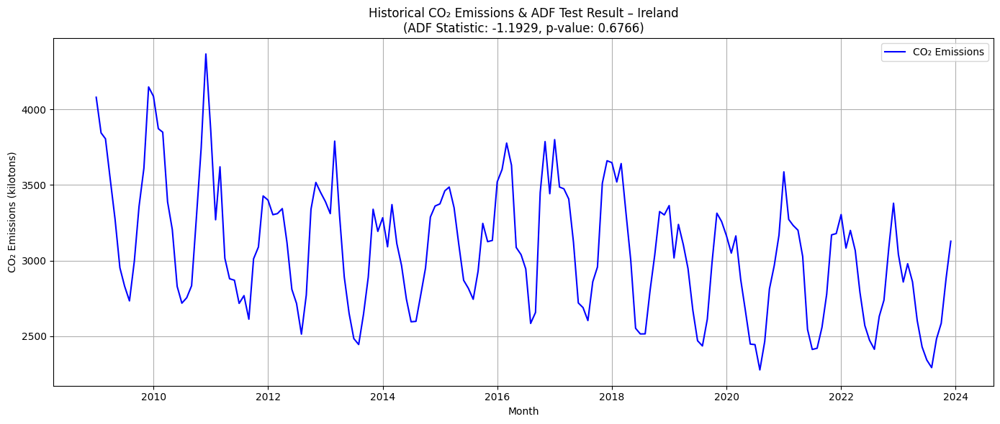

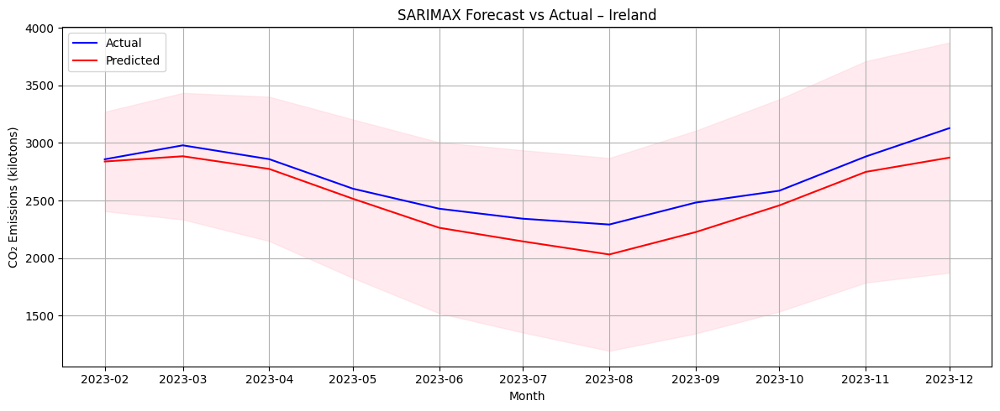


Saved 'sarimax_test_comparison_Ireland.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  2858.135173    2838.809275   19.325899            19.325899
1 2023-03-01  2979.243016    2884.499017   94.744000            94.744000
2 2023-04-01  2859.231048    2774.435866   84.795182            84.795182
3 2023-05-01  2603.262043    2515.983168   87.278876            87.278876
4 2023-06-01  2429.196550    2263.790413  165.406137           165.406137
Best Parameters for Ireland: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}


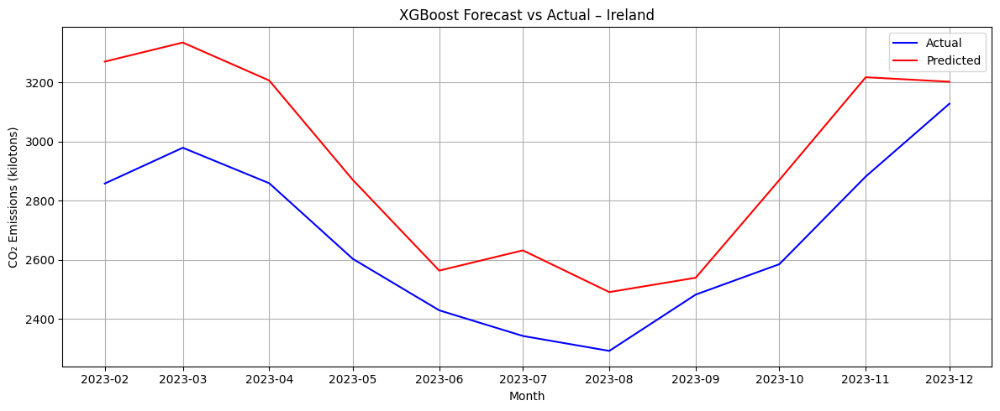


Saved 'xgboost_test_comparison_Ireland.csv'
           Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
1729 2023-02-01  2858.135173    3270.692139 -412.556965           412.556965
1730 2023-03-01  2979.243016    3335.179443 -355.936427           355.936427
1731 2023-04-01  2859.231048    3206.760010 -347.528962           347.528962
1732 2023-05-01  2603.262043    2870.398682 -267.136638           267.136638
1733 2023-06-01  2429.196550    2563.603271 -134.406722           134.406722

=== Processing Italy ===


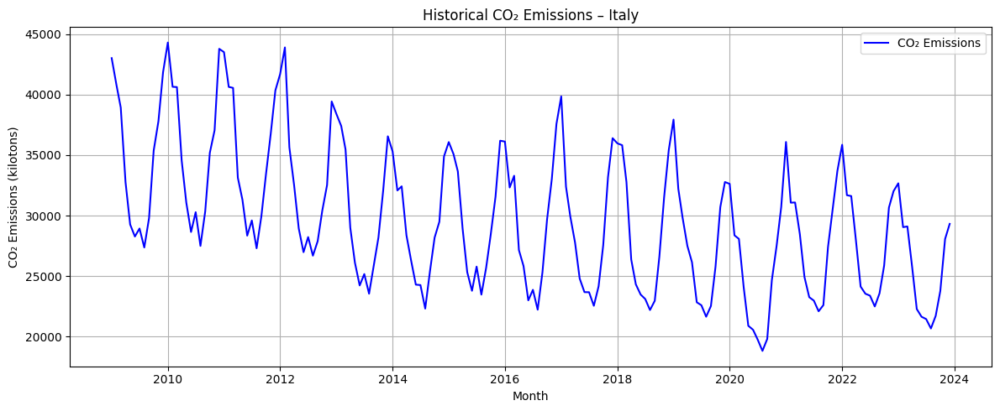

ADF Statistic for Italy: -1.5151
p-value: 0.5260
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



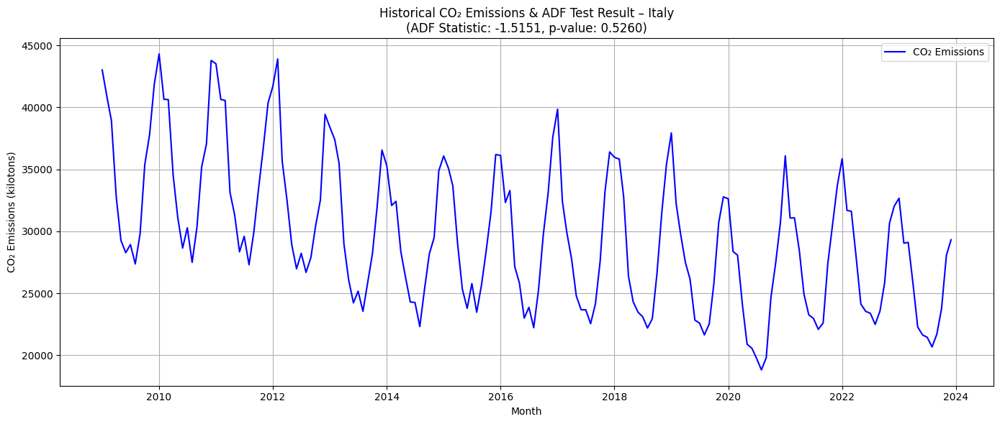

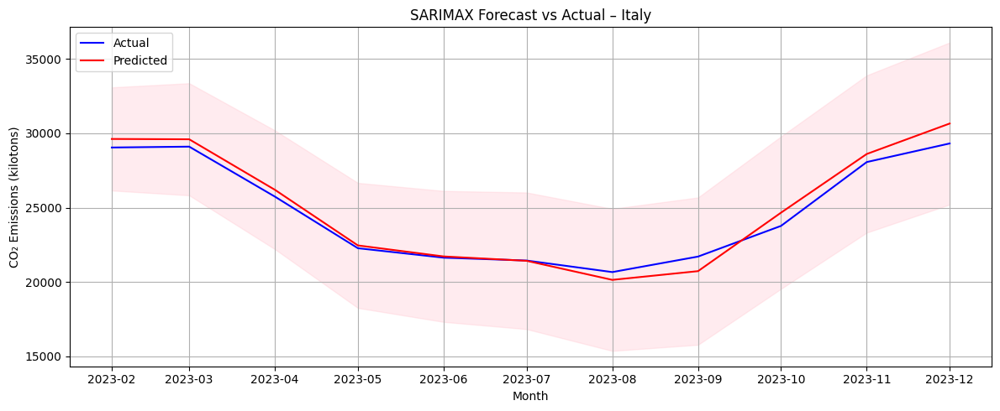


Saved 'sarimax_test_comparison_Italy.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  29046.750209   29620.988732 -574.238524           574.238524
1 2023-03-01  29105.204610   29599.041787 -493.837177           493.837177
2 2023-04-01  25744.022809   26202.538078 -458.515268           458.515268
3 2023-05-01  22276.974007   22464.865612 -187.891605           187.891605
4 2023-06-01  21641.653871   21724.726072  -83.072200            83.072200
Best Parameters for Italy: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 100}


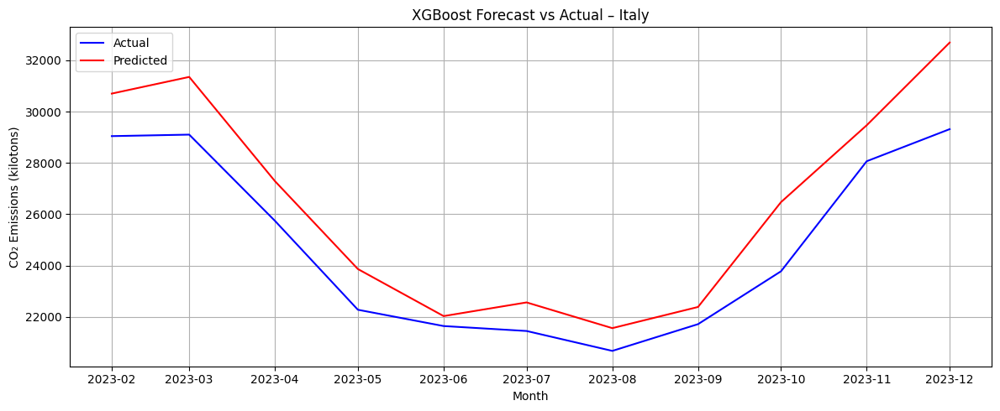


Saved 'xgboost_test_comparison_Italy.csv'
           Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
1741 2023-02-01  29046.750209   30704.751953 -1658.001745          1658.001745
1742 2023-03-01  29105.204610   31354.410156 -2249.205546          2249.205546
1743 2023-04-01  25744.022809   27292.015625 -1547.992816          1547.992816
1744 2023-05-01  22276.974007   23864.406250 -1587.432243          1587.432243
1745 2023-06-01  21641.653871   22029.785156  -388.131285           388.131285

=== Processing Netherlands ===


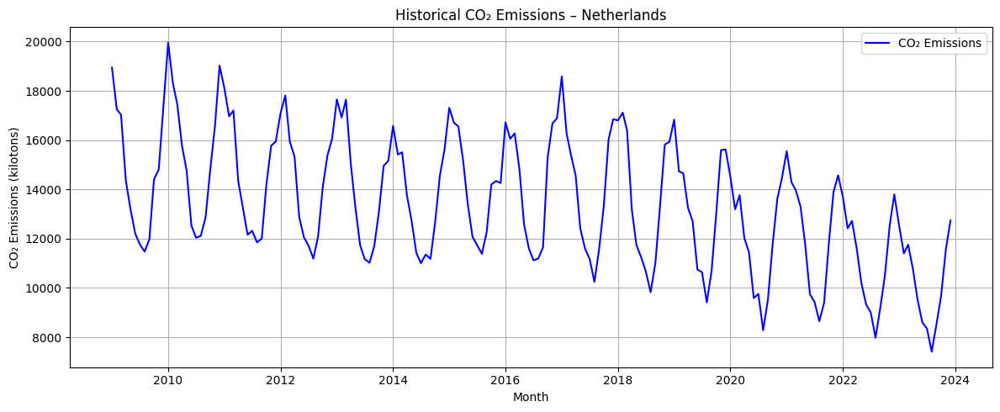

ADF Statistic for Netherlands: 0.5143
p-value: 0.9853
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



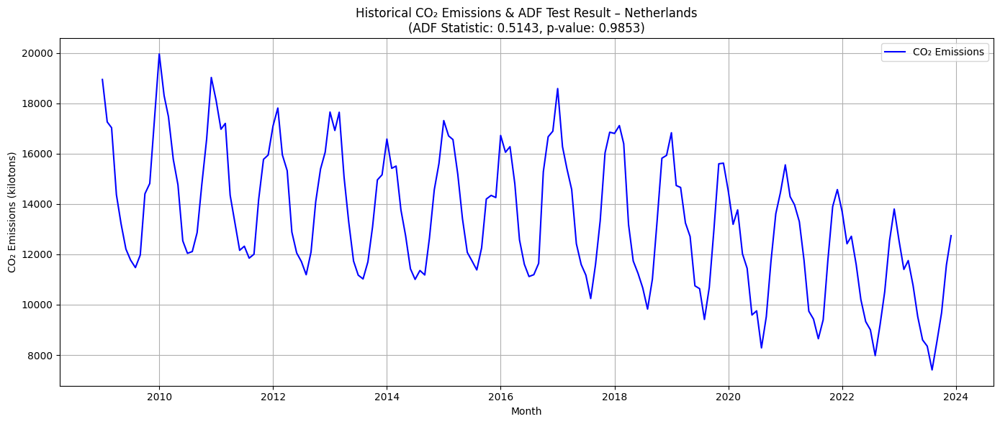

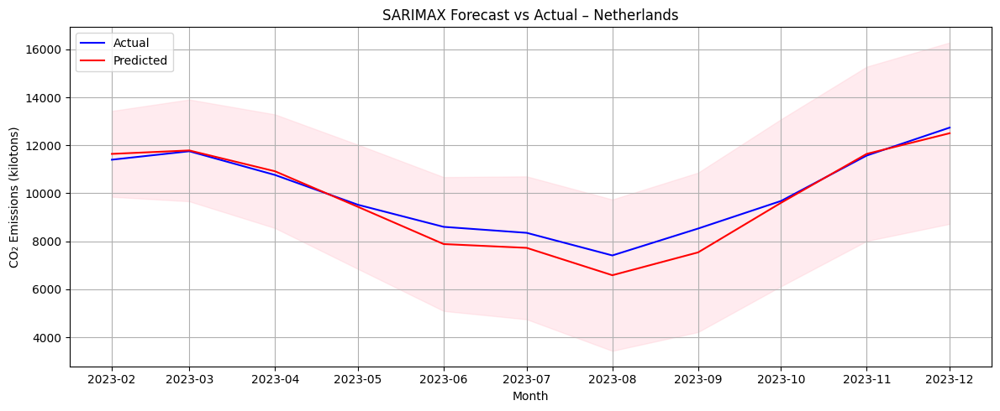


Saved 'sarimax_test_comparison_Netherlands.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  11401.436924   11643.742795 -242.305871           242.305871
1 2023-03-01  11753.282882   11787.202598  -33.919716            33.919716
2 2023-04-01  10764.907832   10918.986829 -154.078998           154.078998
3 2023-05-01   9522.175179    9435.745764   86.429415            86.429415
4 2023-06-01   8601.282842    7883.591973  717.690869           717.690869
Best Parameters for Netherlands: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 200}


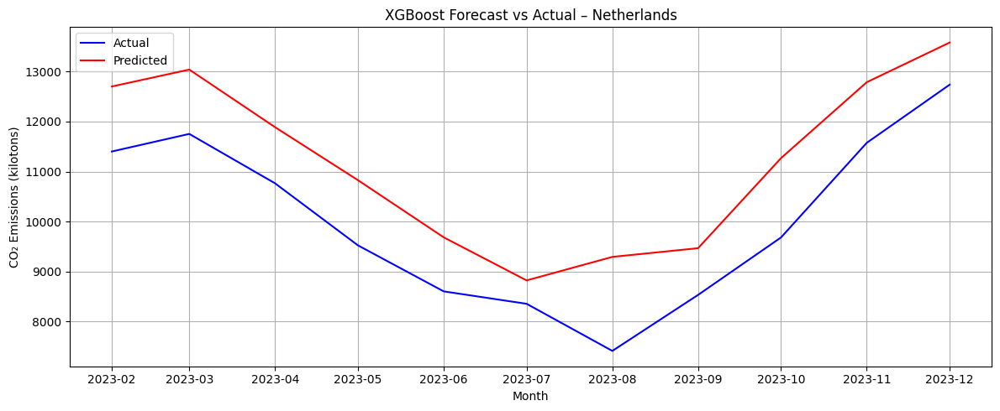


Saved 'xgboost_test_comparison_Netherlands.csv'
           Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
1753 2023-02-01  11401.436924   12702.710938 -1301.274013          1301.274013
1754 2023-03-01  11753.282882   13041.208008 -1287.925126          1287.925126
1755 2023-04-01  10764.907832   11888.894531 -1123.986700          1123.986700
1756 2023-05-01   9522.175179   10827.566406 -1305.391227          1305.391227
1757 2023-06-01   8601.282842    9683.466797 -1082.183955          1082.183955

=== Processing Poland ===


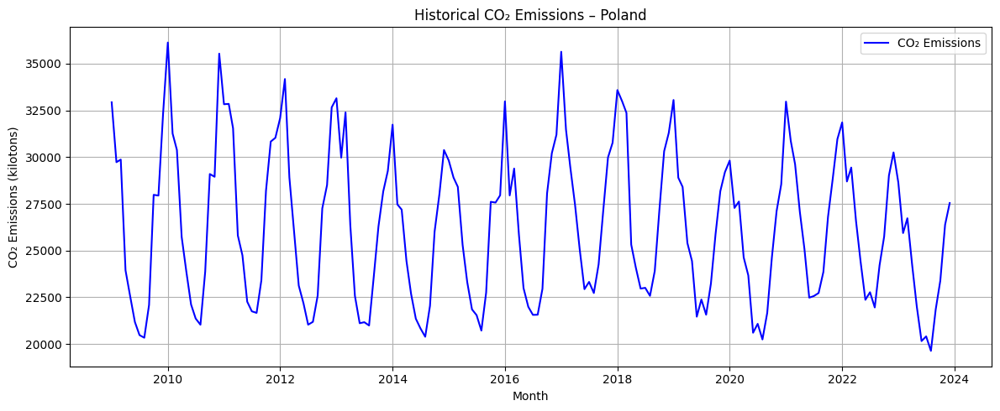

ADF Statistic for Poland: -1.8239
p-value: 0.3687
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



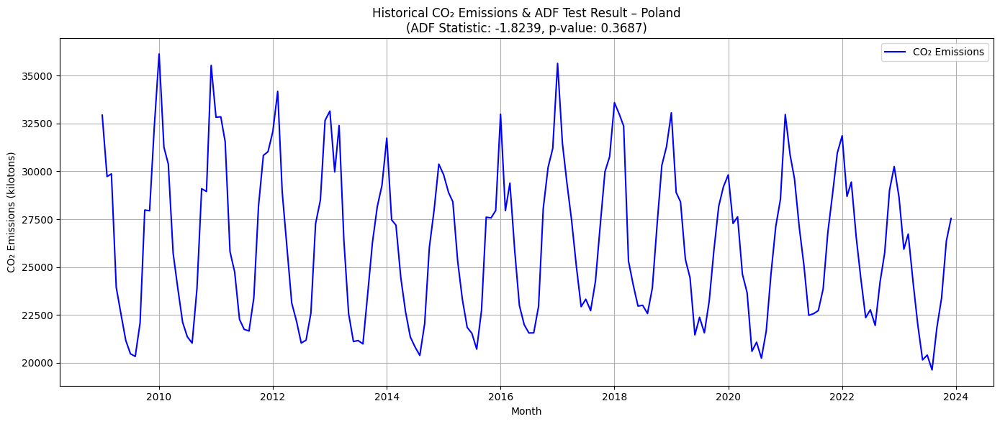

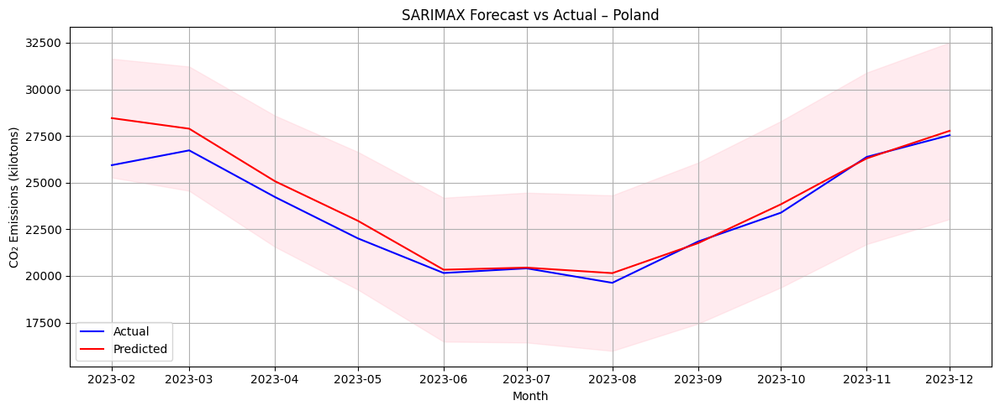


Saved 'sarimax_test_comparison_Poland.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  25936.026455   28457.898180 -2521.871725          2521.871725
1 2023-03-01  26729.181721   27891.001058 -1161.819337          1161.819337
2 2023-04-01  24230.123948   25076.385845  -846.261896           846.261896
3 2023-05-01  22013.294691   22955.344309  -942.049618           942.049618
4 2023-06-01  20158.109222   20334.392602  -176.283379           176.283379
Best Parameters for Poland: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}


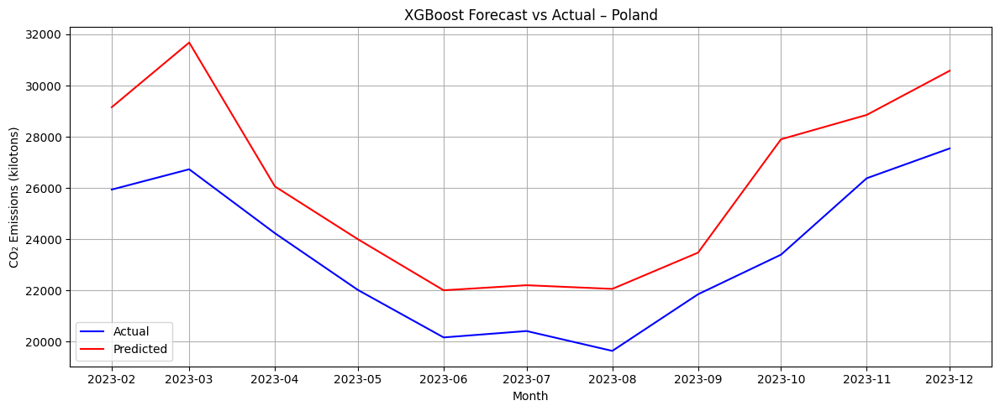


Saved 'xgboost_test_comparison_Poland.csv'
           Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
1765 2023-02-01  25936.026455   29155.425781 -3219.399326          3219.399326
1766 2023-03-01  26729.181721   31681.546875 -4952.365154          4952.365154
1767 2023-04-01  24230.123948   26058.275391 -1828.151442          1828.151442
1768 2023-05-01  22013.294691   23994.796875 -1981.502184          1981.502184
1769 2023-06-01  20158.109222   22000.226562 -1842.117340          1842.117340

=== Processing Spain ===


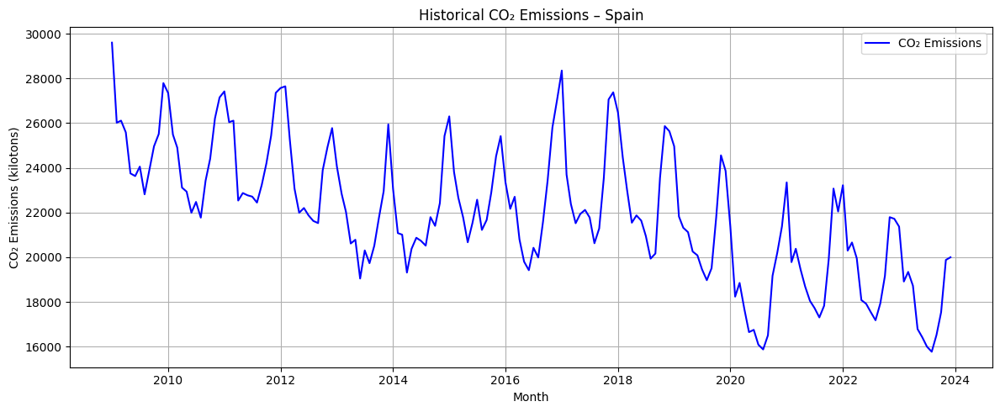

ADF Statistic for Spain: -1.0666
p-value: 0.7282
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



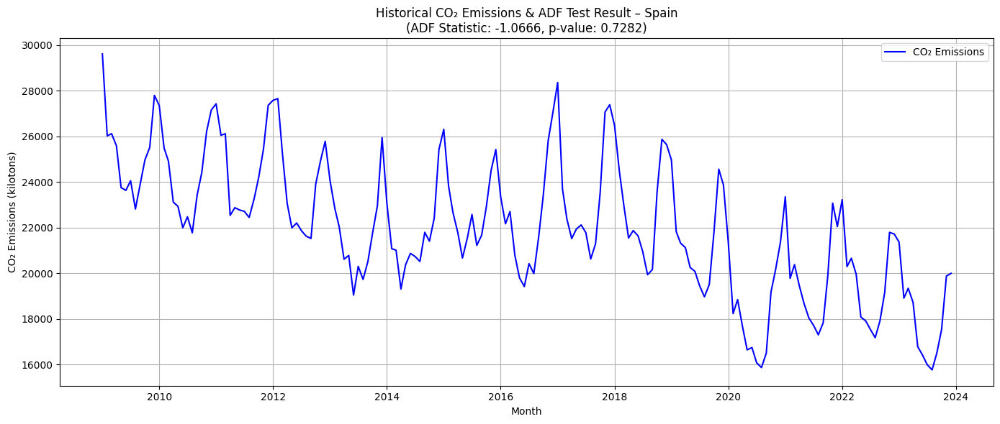

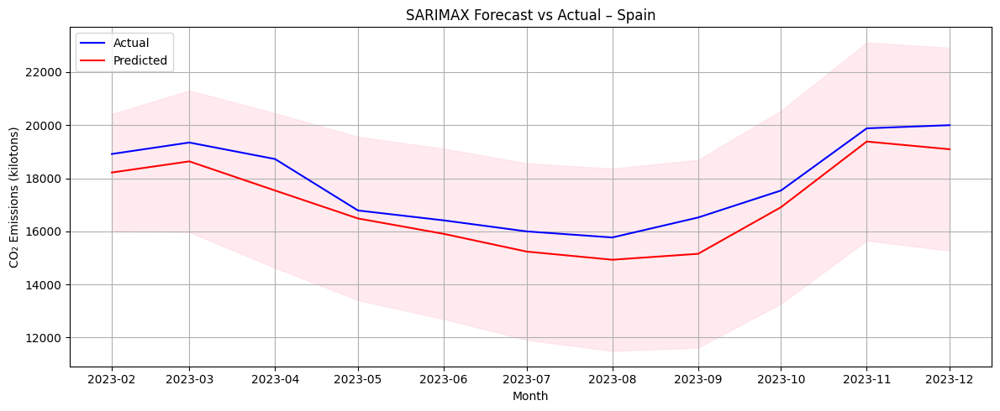


Saved 'sarimax_test_comparison_Spain.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  18913.739341   18216.306543   697.432799           697.432799
1 2023-03-01  19344.562202   18635.197080   709.365123           709.365123
2 2023-04-01  18724.030617   17539.069205  1184.961411          1184.961411
3 2023-05-01  16786.861266   16485.754733   301.106533           301.106533
4 2023-06-01  16414.423633   15906.551359   507.872274           507.872274
Best Parameters for Spain: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}


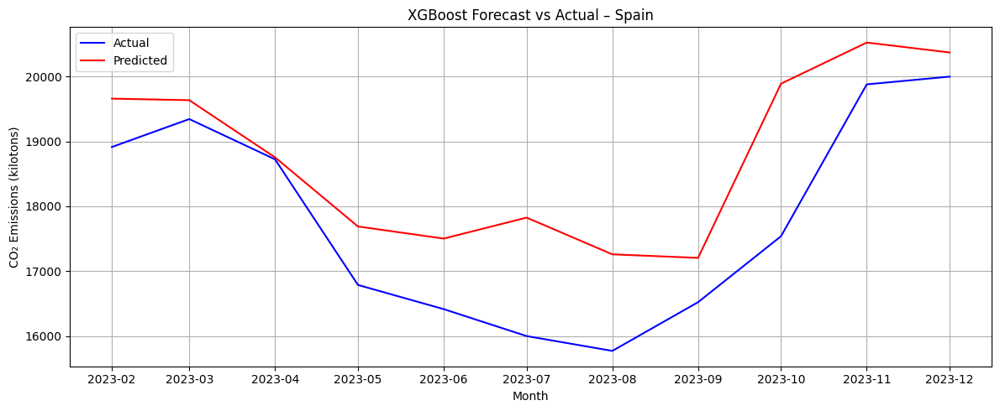


Saved 'xgboost_test_comparison_Spain.csv'
           Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
1777 2023-02-01  18913.739341   19659.628906  -745.889565           745.889565
1778 2023-03-01  19344.562202   19635.650391  -291.088188           291.088188
1779 2023-04-01  18724.030617   18754.335938   -30.305321            30.305321
1780 2023-05-01  16786.861266   17688.392578  -901.531312           901.531312
1781 2023-06-01  16414.423633   17501.761719 -1087.338086          1087.338086

=== Processing Sweden ===


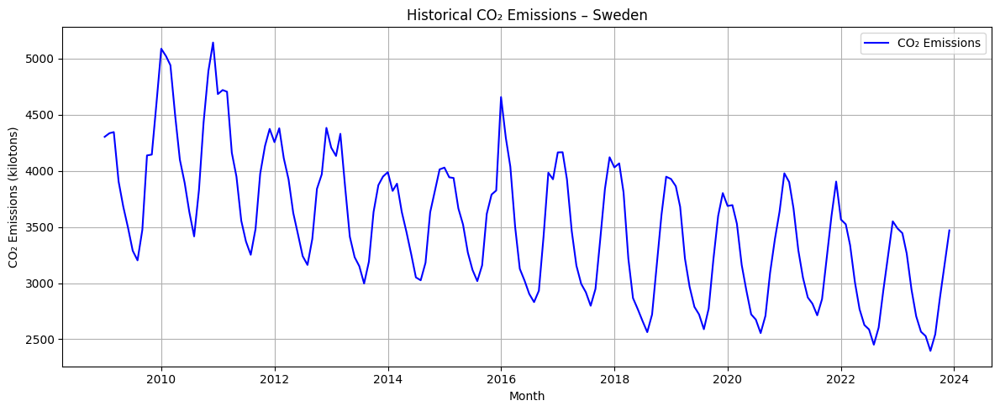

ADF Statistic for Sweden: -1.4989
p-value: 0.5341
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



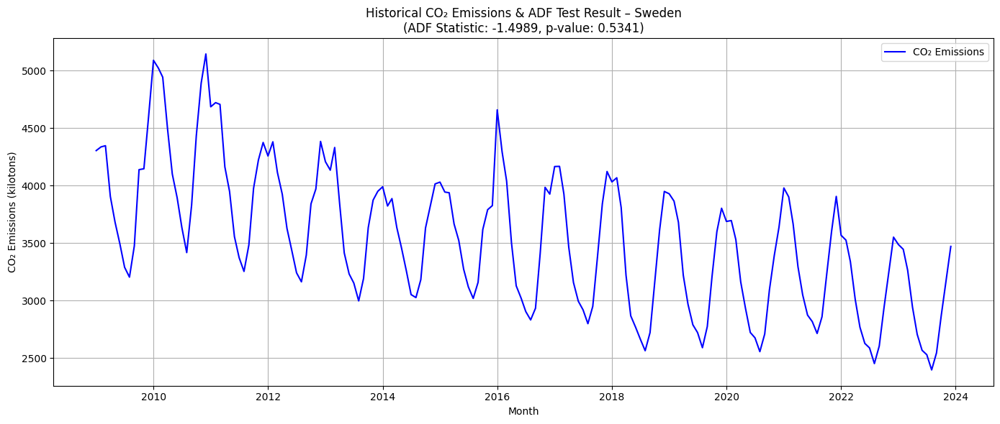

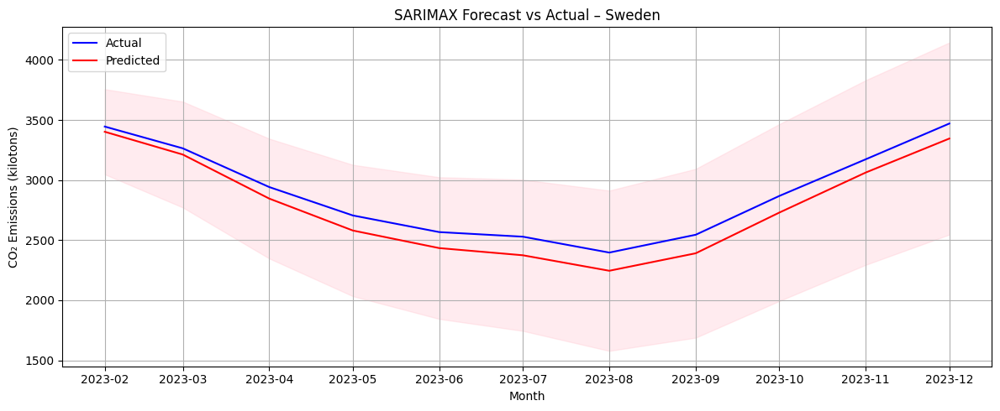


Saved 'sarimax_test_comparison_Sweden.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  3445.403540    3402.134690   43.268850            43.268850
1 2023-03-01  3264.110514    3212.363326   51.747188            51.747188
2 2023-04-01  2941.981960    2845.933735   96.048225            96.048225
3 2023-05-01  2705.426422    2580.079056  125.347366           125.347366
4 2023-06-01  2566.987493    2433.708661  133.278832           133.278832
Best Parameters for Sweden: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}


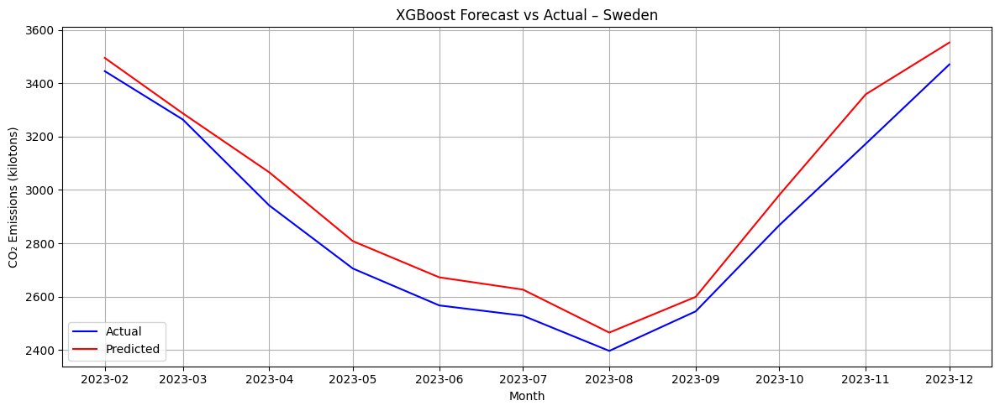


Saved 'xgboost_test_comparison_Sweden.csv'
           Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
1789 2023-02-01  3445.403540    3495.072510  -49.668970            49.668970
1790 2023-03-01  3264.110514    3287.250000  -23.139486            23.139486
1791 2023-04-01  2941.981960    3066.232910 -124.250950           124.250950
1792 2023-05-01  2705.426422    2808.091797 -102.665375           102.665375
1793 2023-06-01  2566.987493    2672.297363 -105.309870           105.309870

=== Model Performance Comparison ===
------------------------------------------------------------------------------------------------------------------------
Country         | Model      | RMSE       | MAE        | MAPE       | R-squared 
------------------------------------------------------------------------------------------------------------------------
Austria         | XGBoost    | 397.03     | 356.96     | 7.43%      | 0.7278    
Austria         | SARIMAX    | 282.78     | 250.96 

In [4]:
import warnings
warnings.filterwarnings("ignore")  # Suppress warnings to keep output clean
import pandas as pd
import numpy as np
from datetime import datetime
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, mean_absolute_percentage_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()  # Ensure proper datetime plotting with matplotlib

# Function to load and preprocess data for a specific country, including exogenous variables
def load_with_exog(filepath, country_name):
    """
    Load and preprocess data from an Excel file for a specific country.
    Parameters:
        filepath (str): Path to the Excel file
        country_name (str): Name of the country to filter
    Returns:
        endog (Series): CO₂ emissions time series
        exog (DataFrame): Exogenous variables (GDP, Energy Consumption, etc.)
    """
    try:
        # Read Excel file and clean column names
        df = pd.read_excel(filepath)
        df.columns = df.columns.str.strip().str.replace(' ', '_')
        # Convert 'Month' column to datetime
        df['Month'] = pd.to_datetime(df['Month'], format='%Y-%m')
        # Filter for the specified country and sort by date
        df = df[df['Name'] == country_name].sort_values('Month')
        # Select exogenous variables
        exog_cols = ['GDP', 'Energy_Consumption_TWh', 'StringencyIndex', 'Mobility_Index']
        # Keep only relevant columns and drop missing values
        df = df[['Month', 'MonthlyTotal'] + exog_cols].dropna()
        df = df.set_index('Month')
        endog = df['MonthlyTotal']  # Target variable (CO₂ emissions)
        exog = df[exog_cols]  # Exogenous variables
        return endog, exog
    except Exception as e:
        print(f"Problem loading data for {country_name}: {e}")
        return None, None

# Function to perform exploratory data analysis by plotting historical CO₂ emissions
def exploratory_analysis(endog, country_name):
    """
    Plot historical CO₂ emissions for visualization.
    Parameters:
        endog (Series): CO₂ emissions time series
        country_name (str): Name of the country
    """
    plt.figure(figsize=(12, 5))
    plt.plot(endog.index, endog, color='blue', label='CO₂ Emissions')
    plt.title(f'Historical CO₂ Emissions – {country_name}')
    plt.xlabel('Month')
    plt.ylabel('CO₂ Emissions (kilotons)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Function to perform ADF test and visualize results to check stationarity
# https://www.geeksforgeeks.org/machine-learning/augmented-dickey-fuller-adf/
def adf_test_and_visualization(endog, country_name):
    """
    Perform Augmented Dickey-Fuller test to check if the time series is stationary.
    Parameters:
        endog (Series): CO₂ emissions time series
        country_name (str): Name of the country
    """
    try:
        # Run ADF test to check stationarity - https://www.askpython.com/python/examples/augmented-dickey-fuller-test-time-series
        result = adfuller(endog)
        print(f'ADF Statistic for {country_name}: {result[0]:.4f}')
        print(f'p-value: {result[1]:.4f}')
        print('Critical Values:')
        for key, value in result[4].items():
            print(f'   {key}: {value:.4f}')
        is_stationary = result[1] < 0.05  # p-value < 0.05 indicates stationarity
        print(f'Stationary: {is_stationary}\n')

        # Plot time series with ADF test results
        plt.figure(figsize=(14, 6))
        plt.plot(endog.index, endog, color='blue', label='CO₂ Emissions')
        plt.title(f'Historical CO₂ Emissions & ADF Test Result – {country_name}\n(ADF Statistic: {result[0]:.4f}, p-value: {result[1]:.4f})')
        plt.xlabel('Month')
        plt.ylabel('CO₂ Emissions (kilotons)')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error in ADF test for {country_name}: {e}")

# Function to split data into training and testing sets for SARIMAX
def split_with_exog(endog, exog, cutoff='2023-01-01'):
    """
    Split data into training and testing sets based on a cutoff date.
    Parameters:
        endog (Series): CO₂ emissions time series
        exog (DataFrame): Exogenous variables
        cutoff (str): Date to split train/test data (default: '2023-01-01')
    Returns:
        train_endog, test_endog, train_exog, test_exog: Split datasets
    """
    try:
        train_endog = endog[endog.index <= cutoff]
        test_endog = endog[endog.index > cutoff]
        train_exog = exog.loc[train_endog.index]
        test_exog = exog.loc[test_endog.index]
        return train_endog, test_endog, train_exog, test_exog
    except Exception as e:
        print(f"Error splitting data: {e}")
        return None, None, None, None

# Function to train a SARIMAX model with exogenous variables
def train_sarimax_with_exog(endog_train, exog_train, country_name, order=(1,1,1), seasonal_order=(1,1,1,12), trend='t'):
    """
    Train a SARIMAX model with specified parameters.
    Parameters:
        endog_train (Series): Training CO₂ emissions
        exog_train (DataFrame): Training exogenous variables
        country_name (str): Name of the country
        order (tuple): ARIMA order (p,d,q)
        seasonal_order (tuple): Seasonal ARIMA order (P,D,Q,s)
        trend (str): Trend component ('t' for linear trend)
    Returns:
        fit: Trained SARIMAX model
    """
    try:
        model = SARIMAX(
            endog_train,
            exog=exog_train,
            order=order,
            seasonal_order=seasonal_order,
            trend=trend,
            enforce_stationarity=False,  # Allow non-stationary series
            enforce_invertibility=False  # Allow non-invertible MA components
        )
        fit = model.fit(disp=False)  # Fit model without verbose output
        return fit
    except Exception as e:
        print(f"Error training SARIMAX for {country_name}: {e}")
        return None

# Function to evaluate SARIMAX model and plot forecasts
def evaluate_model_sarimax(fit, endog_test, exog_test, country_name):
    """
    Evaluate SARIMAX model by forecasting and computing metrics.
    Parameters:
        fit: Trained SARIMAX model
        endog_test (Series): Test CO₂ emissions
        exog_test (DataFrame): Test exogenous variables
        country_name (str): Name of the country
    Returns:
        rmse, mae, mape, r2: Performance metrics
    """
    try:
        # Generate forecast for the test period
        fc = fit.get_forecast(steps=len(endog_test), exog=exog_test)
        pred = fc.predicted_mean
        ci = fc.conf_int().astype(float)
        lower_ci = ci.iloc[:,0].to_numpy()
        upper_ci = ci.iloc[:,1].to_numpy()

        # Calculate performance metrics
        mae = mean_absolute_error(endog_test, pred)
        rmse = np.sqrt(mean_squared_error(endog_test, pred))
        mape = mean_absolute_percentage_error(endog_test, pred)
        r2 = r2_score(endog_test, pred)

        # Plot actual vs predicted values
        plt.figure(figsize=(12, 5))
        plt.plot(endog_test.index, endog_test, label='Actual', color='blue')
        plt.plot(endog_test.index, pred, label='Predicted', color='red')
        plt.fill_between(endog_test.index, lower_ci, upper_ci, color='pink', alpha=0.3)
        plt.title(f'SARIMAX Forecast vs Actual – {country_name}')
        plt.xlabel('Month')
        plt.ylabel('CO₂ Emissions (kilotons)')
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()

        # Save comparison of actual vs predicted values to CSV
        comp = pd.DataFrame({
            'Month': endog_test.index,
            'Actual_CO2': endog_test.values,
            'Predicted_CO2': pred.values,
            'Difference': (endog_test - pred).values,
            'Absolute_Difference': np.abs(endog_test - pred).values
        })
        comp.to_csv(f'sarimax_test_comparison_{country_name}.csv', index=False)
        print(f"\nSaved 'sarimax_test_comparison_{country_name}.csv'\n", comp.head())
        return rmse, mae, mape, r2
    except Exception as e:
        print(f"Error evaluating SARIMAX model for {country_name}: {e}")
        return None, None, None, None

# Function to remove highly correlated features to prevent multicollinearity
def remove_correlated_features(df, thresh=0.8, verbose=True):
    """
    Identify and remove features with high correlation.
    Parameters:
        df (DataFrame): Input data with numeric features
        thresh (float): Correlation threshold (default: 0.8)
        verbose (bool): Print removed columns if True
    Returns:
        to_drop (list): List of columns to drop
    """
    corr = df.corr().abs()  # Compute absolute correlation matrix
    upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))  # Upper triangle
    to_drop = [col for col in upper.columns if any(upper[col] > thresh)]  # Columns to drop
    if verbose:
        print(f"Removing {len(to_drop)} columns that are too similar: {to_drop}")
    return to_drop

# Function to load and clean raw data from Excel
def load_and_clean_data(filepath='cgrt_edgar_combined1.xlsx'):
    """
    Load and clean the dataset, handling missing values and policy columns.
    Parameters:
        filepath (str): Path to the Excel file
    Returns:
        data (DataFrame): Cleaned dataset
    """
    data = pd.read_excel(filepath)
    data = data.dropna(how='all')  # Drop rows with all missing values
    data.columns = data.columns.str.strip().str.replace(' ', '_')  # Clean column names
    if 'Name' not in data.columns:
        raise KeyError("The 'Name' column is missing from the data!")
    # Convert 'Month' to datetime
    data['Month'] = pd.to_datetime(data['Month'], format='%Y-%m')
    # Split data into pre- and post-COVID periods
    pre = data[data['Month'] < '2020-01-01']
    post = data[data['Month'] >= '2020-01-01']
    # Define policy-related columns
    policy_cols = [
        'StringencyIndex',
        'C1E_School_closing', 'C2E_Workplace_closing', 'C3E_Cancel_public_events',
        'C4E_Restrictions_on_gatherings', 'C5E_Close_public_transport',
        'C6E_Stay_at_home_requirements', 'C7E_Restrictions_on_internal_movement',
        'C8E_International_travel_controls'
    ]
    # Ensure all policy columns exist
    for col in policy_cols:
        if col not in data.columns:
            data[col] = np.nan
    # Fill missing policy values with 0 for pre-COVID data
    pre[policy_cols] = pre[policy_cols].fillna(0)
    data = pd.concat([pre, post], ignore_index=True)
    # Define numeric columns and convert to numeric, filling missing with 0
    numeric_cols = [
        'MonthlyTotal', 'GDP', 'Temperature_C', 'Unemployment_Rate',
        'Industrial_Production_Index', 'Energy_Consumption_TWh', 'Mobility_Index'
    ] + policy_cols
    for col in numeric_cols:
        data[col] = pd.to_numeric(data[col], errors='coerce').fillna(0)
    return data

# Function to engineer features for XGBoost model
def feature_engineering(data, country_name):
    """
    Create additional features for the dataset (e.g., year, month, COVID periods).
    Parameters:
        data (DataFrame): Input dataset
        country_name (str): Name of the country
    Returns:
        data (DataFrame): Dataset with engineered features
    """
    data = data[data['Name'] == country_name].copy()
    # Extract year, month, and quarter from 'Month'
    data['Year'] = data['Month'].dt.year
    data['Month_num'] = data['Month'].dt.month
    data['Quarter'] = data['Month'].dt.quarter
    # Define COVID periods
    data['Period'] = 'Pre-COVID'
    mask_covid = (data['Month'] >= '2020-03-01') & (data['Month'] <= '2023-05-01')
    data.loc[mask_covid, 'Period'] = 'COVID'
    data.loc[data['Month'] > '2023-05-01', 'Period'] = 'Post-COVID'
    # Create dummy variables for periods
    data = pd.get_dummies(data, columns=['Period'], drop_first=True)
    return data

# Function to split data into training and testing sets for XGBoost
def train_test_split_data(data, cutoff='2023-01-01'):
    """
    Split data into training and testing sets for XGBoost.
    Parameters:
        data (DataFrame): Input dataset
        cutoff (str): Date to split train/test data (default: '2023-01-01')
    Returns:
        X_train, X_test, y_train, y_test, feature_cols, test_orig: Split datasets and features
    """
    train_mask = data['Month'] <= cutoff
    train = data[train_mask]
    test = data[~train_mask]
    # Select feature columns (exclude non-feature columns)
    feature_cols = [c for c in data.columns if c not in ['Month', 'Name', 'Substance', 'MonthlyTotal']]
    X_train = train[feature_cols]
    y_train = train['MonthlyTotal']
    X_test = test[feature_cols]
    y_test = test['MonthlyTotal']
    return X_train, X_test, y_train, y_test, feature_cols, test

# Function to train an XGBoost model with hyperparameter tuning
def train_xgboost(X_train, y_train, country_name):
    """
    Train an XGBoost model with grid search for hyperparameter tuning.
    Parameters:
        X_train (DataFrame): Training features
        y_train (Series): Training target
        country_name (str): Name of the country
    Returns:
        model: Trained XGBoost model
    """
    model = xgb.XGBRegressor(random_state=42)
    # Define hyperparameter grid
    params = {
        'n_estimators': [100, 200],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.3]
    }
    # Perform grid search with cross-validation
    grid = GridSearchCV(model, params, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid.fit(X_train, y_train)
    print(f"Best Parameters for {country_name}:", grid.best_params_)
    return grid.best_estimator_

# Function to evaluate XGBoost model and plot forecasts
def evaluate_model_xgboost(model, X_test, y_test, test_orig, country_name):
    """
    Evaluate XGBoost model by forecasting and computing metrics.
    Parameters:
        model: Trained XGBoost model
        X_test (DataFrame): Test features
        y_test (Series): Test target
        test_orig (DataFrame): Original test dataset
        country_name (str): Name of the country
    Returns:
        rmse, mae, mape, r2: Performance metrics
    """
    y_pred = model.predict(X_test)
    # Calculate performance metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 5))
    plt.plot(test_orig['Month'], y_test, label='Actual', color='blue')
    plt.plot(test_orig['Month'], y_pred, label='Predicted', color='red')
    plt.title(f'XGBoost Forecast vs Actual – {country_name}')
    plt.xlabel('Month')
    plt.ylabel('CO₂ Emissions (kilotons)')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    # Save comparison of actual vs predicted values to CSV
    comp = pd.DataFrame({
        'Month': test_orig['Month'],
        'Actual_CO2': y_test,
        'Predicted_CO2': y_pred,
        'Difference': (y_test - y_pred),
        'Absolute_Difference': np.abs(y_test - y_pred)
    })
    comp.to_csv(f'xgboost_test_comparison_{country_name}.csv', index=False)
    print(f"\nSaved 'xgboost_test_comparison_{country_name}.csv'\n", comp.head())
    return rmse, mae, mape, r2

# Main execution block
if __name__ == "__main__":
    # Define file path and list of countries to process
    FILEPATH = 'cgrt_edgar_combined1.xlsx'
    COUNTRIES = ['Austria', 'Belgium', 'Germany', 'France', 'Ireland', 'Italy', 'Netherlands', 'Poland', 'Spain', 'Sweden']
    # Initialize dictionary to store performance metrics
    metrics = {country: {'XGBoost': {}, 'SARIMAX': {}} for country in COUNTRIES}

    # Load and clean data once for all countries
    data = load_and_clean_data(FILEPATH)
    numeric_feats = data.select_dtypes(include=[np.number])
    drops = remove_correlated_features(numeric_feats, thresh=0.8)
    data.drop(columns=drops, inplace=True)  # Remove highly correlated features

    # Process each country
    for COUNTRY_NAME in COUNTRIES:
        print(f"\n=== Processing {COUNTRY_NAME} ===")

        # SARIMAX Processing
        # Load data for SARIMAX model
        endog, exog = load_with_exog(FILEPATH, COUNTRY_NAME)
        if endog is None or exog is None:
            continue
        # Perform exploratory analysis
        exploratory_analysis(endog, COUNTRY_NAME)
        # Check stationarity with ADF test
        adf_test_and_visualization(endog, COUNTRY_NAME)
        # Split data for SARIMAX
        train_y_sarimax, test_y_sarimax, train_x_sarimax, test_x_sarimax = split_with_exog(endog, exog, cutoff='2023-01-01')
        if train_y_sarimax is None:
            continue
        # Train SARIMAX model
        fit_sarimax = train_sarimax_with_exog(train_y_sarimax, train_x_sarimax, COUNTRY_NAME)
        if fit_sarimax is None:
            continue
        # Evaluate SARIMAX model
        rmse_sarimax, mae_sarimax, mape_sarimax, r2_sarimax = evaluate_model_sarimax(fit_sarimax, test_y_sarimax, test_x_sarimax, COUNTRY_NAME)
        if rmse_sarimax is None:
            continue
        # Store SARIMAX metrics
        metrics[COUNTRY_NAME]['SARIMAX'] = {'RMSE': rmse_sarimax, 'MAE': mae_sarimax, 'MAPE': mape_sarimax, 'R-squared': r2_sarimax}

        # XGBoost Processing
        # Engineer features for XGBoost
        data_country = feature_engineering(data, COUNTRY_NAME)
        # Split data for XGBoost
        X_train, X_test, y_train, y_test, feature_cols, test_orig = train_test_split_data(data_country, cutoff='2023-01-01')
        if X_train.empty or X_test.empty:
            print(f"No data for XGBoost in {COUNTRY_NAME}")
            continue
        # Train XGBoost model
        model_xgboost = train_xgboost(X_train, y_train, COUNTRY_NAME)
        # Evaluate XGBoost model
        rmse_xgb, mae_xgb, mape_xgb, r2_xgb = evaluate_model_xgboost(model_xgboost, X_test, y_test, test_orig, COUNTRY_NAME)
        # Store XGBoost metrics
        metrics[COUNTRY_NAME]['XGBoost'] = {'RMSE': rmse_xgb, 'MAE': mae_xgb, 'MAPE': mape_xgb, 'R-squared': r2_xgb}

    # Compare Metrics
    if metrics:
        print("\n=== Model Performance Comparison ===")
        print("-" * 120)
        # Print header for comparison table
        print(f"{'Country':<15} | {'Model':<10} | {'RMSE':<10} | {'MAE':<10} | {'MAPE':<10} | {'R-squared':<10}")
        print("-" * 120)
        # Print metrics for each country and model
        for country in COUNTRIES:
            for model_name in ['XGBoost', 'SARIMAX']:
                if metrics[country][model_name]:
                    metric = metrics[country][model_name]
                    print(f"{country:<15} | {model_name:<10} | {metric['RMSE']:<10.2f} | {metric['MAE']:<10.2f} | {metric['MAPE']:<10.2%} | {metric['R-squared']:<10.4f}")
        print("-" * 120)

    print("Program finished.")

##ARIMA excluding exogenous features


=== Processing Austria ===


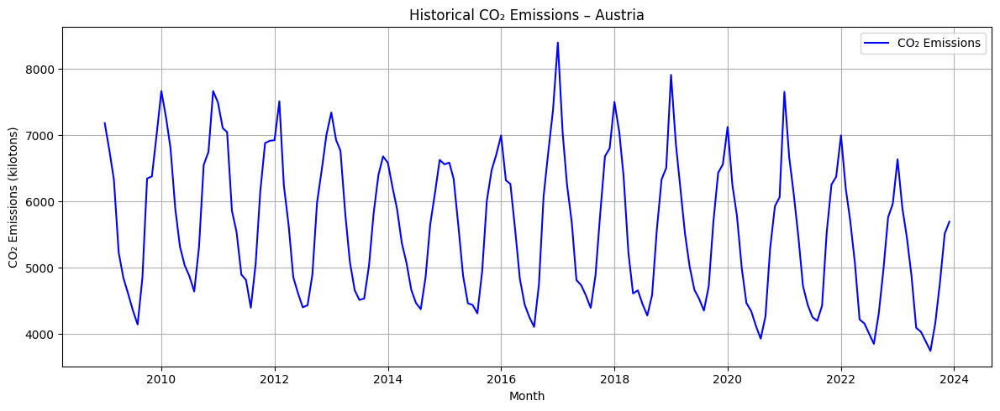

ADF Statistic for Austria: -0.6640
p-value: 0.8559
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



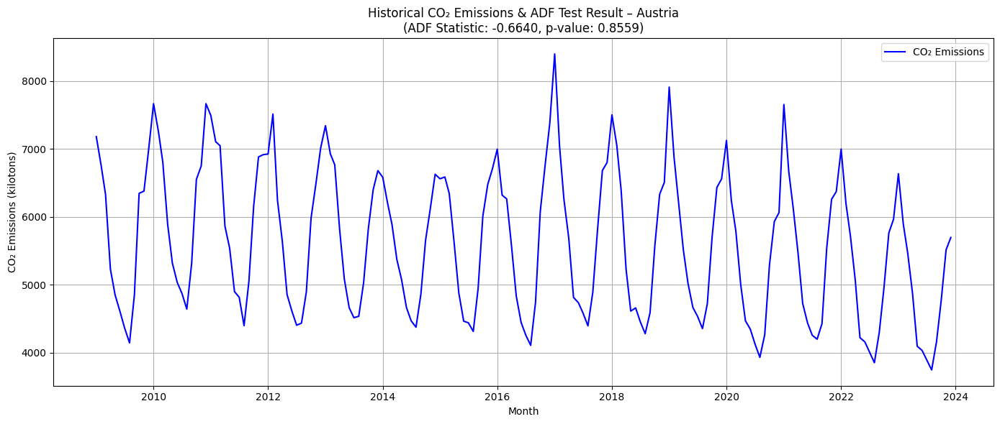

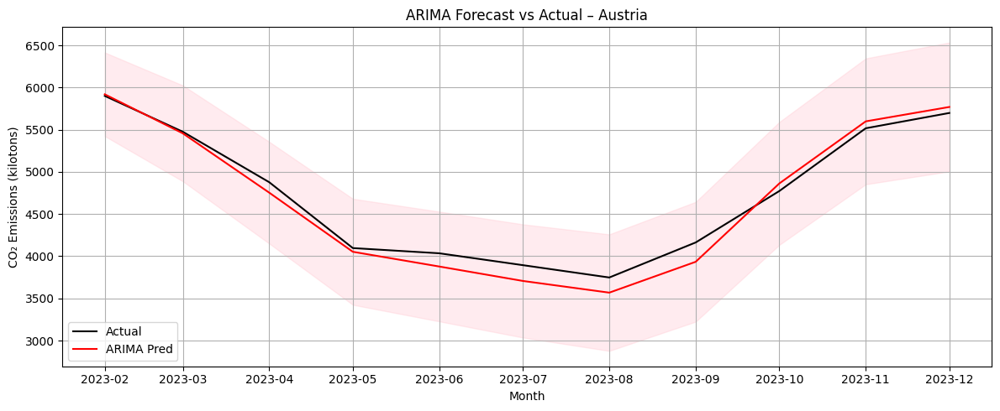


Saved 'arima_test_comparison_Austria.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  5900.087113    5919.172426  -19.085312            19.085312
1 2023-03-01  5475.470858    5456.434486   19.036371            19.036371
2 2023-04-01  4877.425768    4753.597866  123.827903           123.827903
3 2023-05-01  4096.731921    4052.740781   43.991140            43.991140
4 2023-06-01  4034.937556    3878.183362  156.754195           156.754195


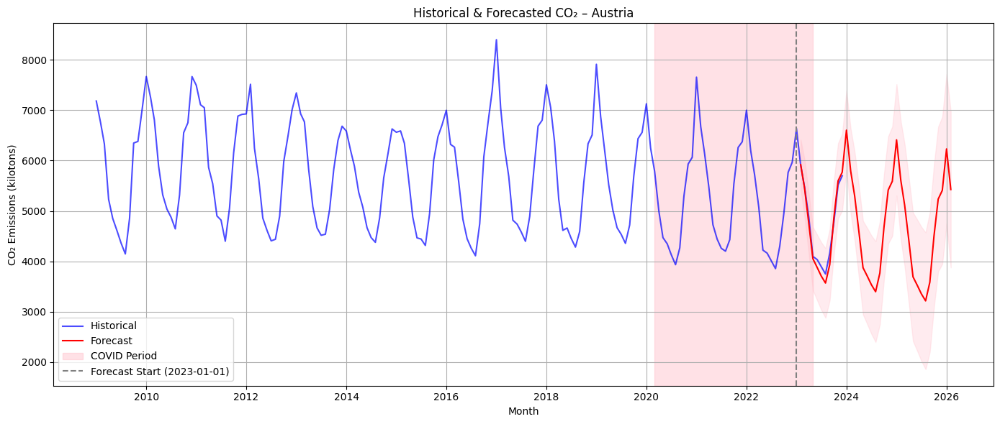


Saved 'arima_future_forecast_Austria.csv'
        Month  Forecasted_CO2     CI_Lower     CI_Upper
0 2023-02-01     5919.172426  5423.790325  6414.554526
1 2023-03-01     5456.434486  4888.585246  6024.283727
2 2023-04-01     4753.597866  4150.716179  5356.479552
3 2023-05-01     4052.740781  3424.511565  4680.969997
4 2023-06-01     3878.183362  3227.946780  4528.419944

=== Processing Belgium ===


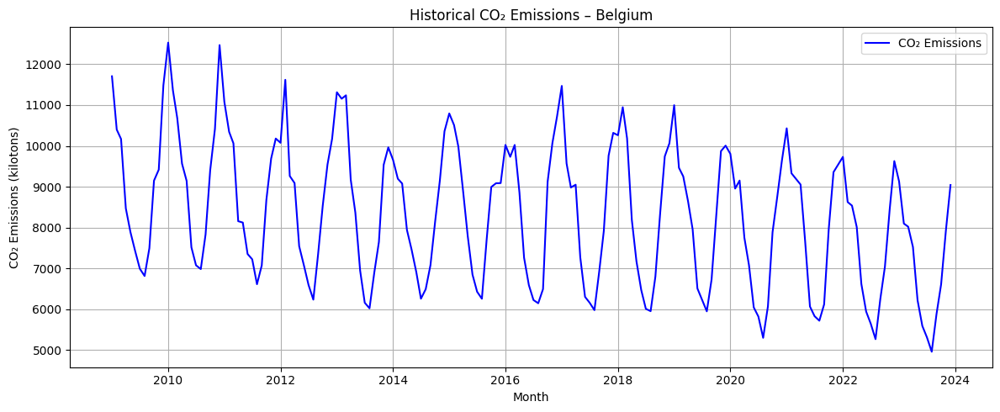

ADF Statistic for Belgium: -0.2307
p-value: 0.9348
Critical Values:
   1%: -3.4699
   5%: -2.8789
   10%: -2.5760
Stationary: False



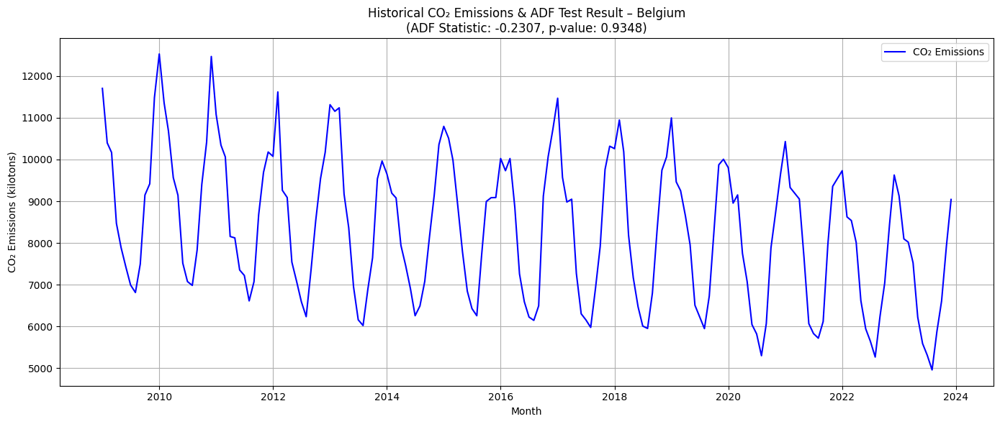

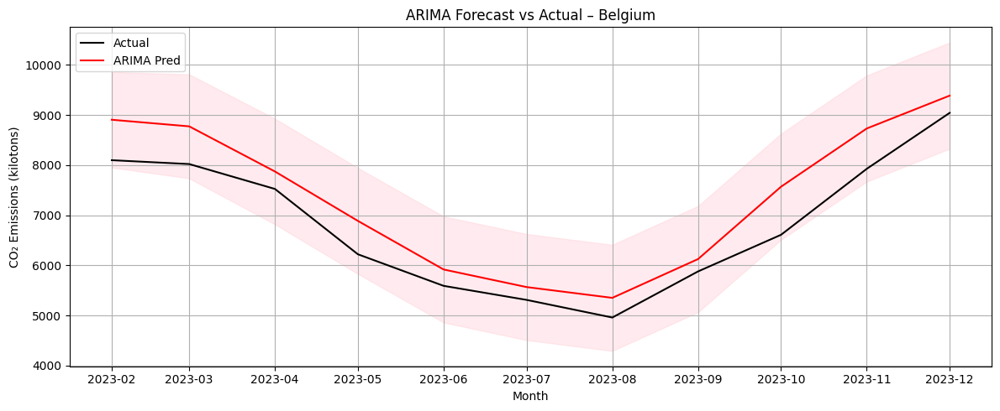


Saved 'arima_test_comparison_Belgium.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  8097.974378    8904.953231 -806.978853           806.978853
1 2023-03-01  8020.984974    8773.268279 -752.283305           752.283305
2 2023-04-01  7524.211649    7872.540989 -348.329340           348.329340
3 2023-05-01  6220.430661    6886.469152 -666.038491           666.038491
4 2023-06-01  5590.271261    5916.669622 -326.398361           326.398361


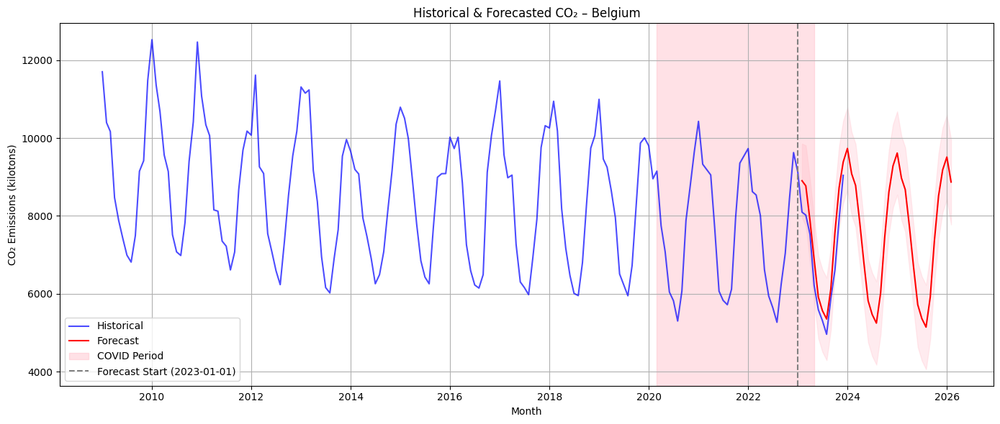


Saved 'arima_future_forecast_Belgium.csv'
        Month  Forecasted_CO2     CI_Lower     CI_Upper
0 2023-02-01     8904.953231  7952.358145  9857.548317
1 2023-03-01     8773.268279  7736.137638  9810.398919
2 2023-04-01     7872.540989  6819.217548  8925.864430
3 2023-05-01     6886.469152  5829.422891  7943.515413
4 2023-06-01     5916.669622  4858.578695  6974.760550

=== Processing Germany ===


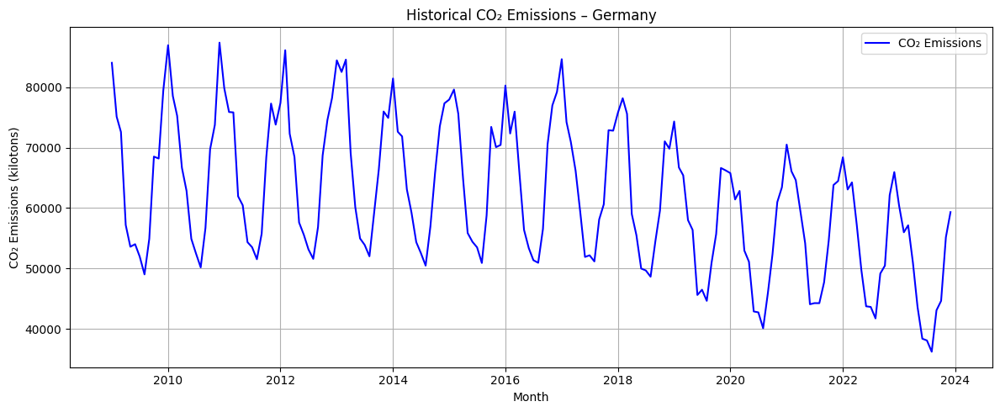

ADF Statistic for Germany: 0.9547
p-value: 0.9938
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



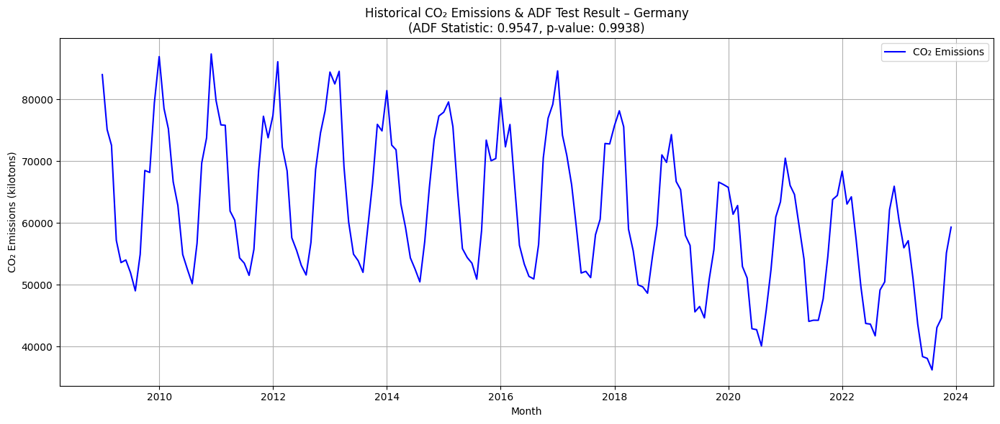

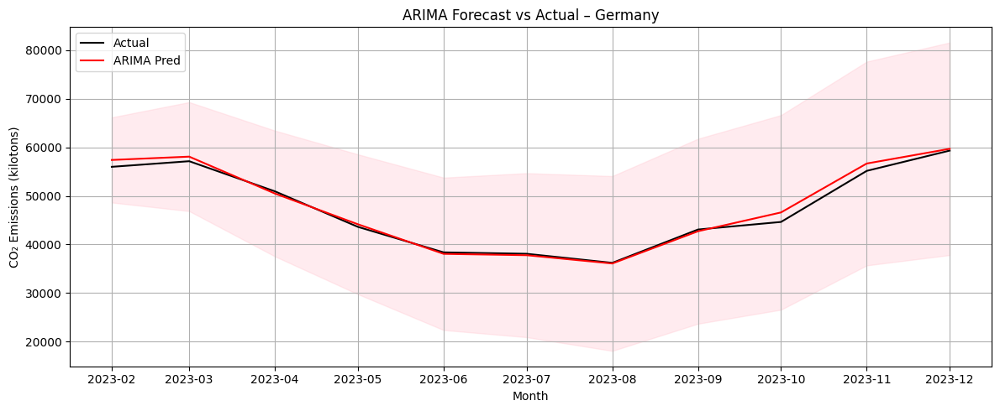


Saved 'arima_test_comparison_Germany.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  55985.026987   57397.766752 -1412.739766          1412.739766
1 2023-03-01  57140.411905   58081.579792  -941.167887           941.167887
2 2023-04-01  50936.192424   50486.855266   449.337159           449.337159
3 2023-05-01  43623.413774   44157.843490  -534.429716           534.429716
4 2023-06-01  38372.806203   38066.302216   306.503987           306.503987


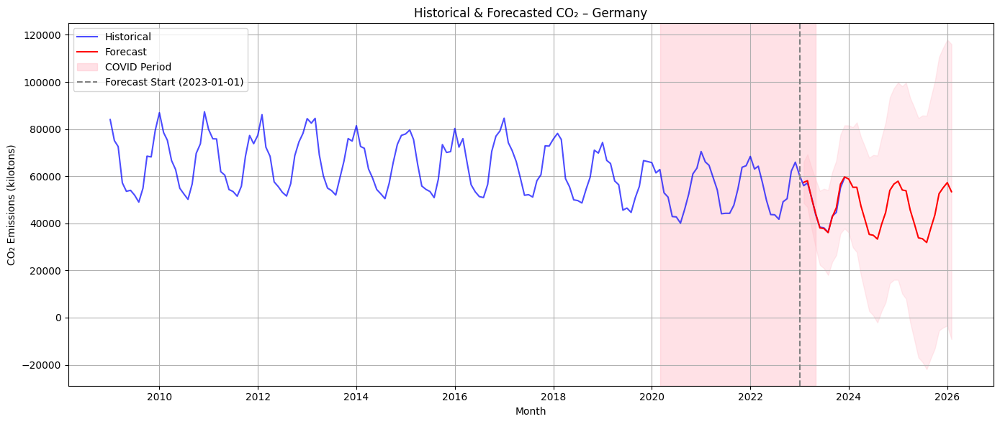


Saved 'arima_future_forecast_Germany.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    57397.766752  48633.351936  66162.181568
1 2023-03-01    58081.579792  46866.106625  69297.052959
2 2023-04-01    50486.855266  37544.151900  63429.558631
3 2023-05-01    44157.843490  29765.226120  58550.460860
4 2023-06-01    38066.302216  22377.001206  53755.603226

=== Processing France ===


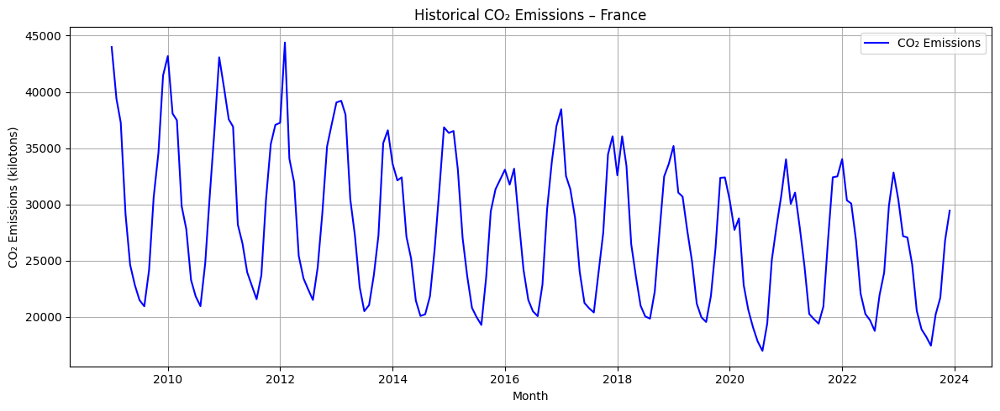

ADF Statistic for France: -0.5499
p-value: 0.8819
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



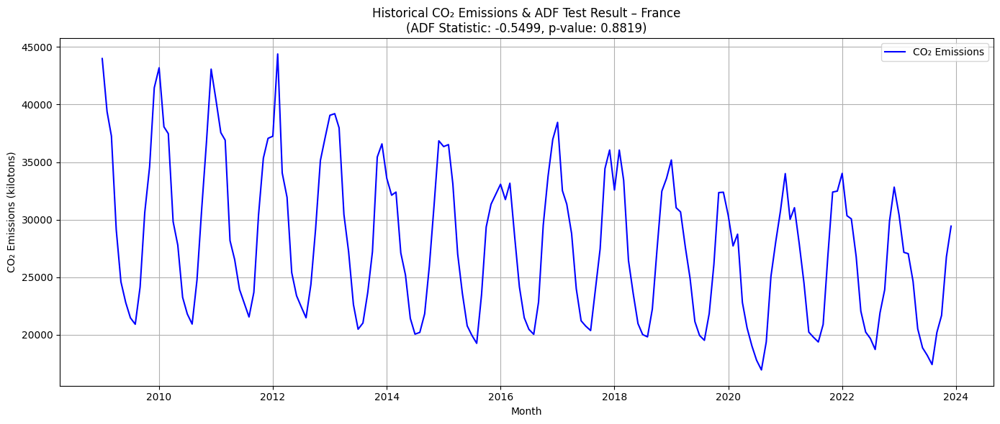

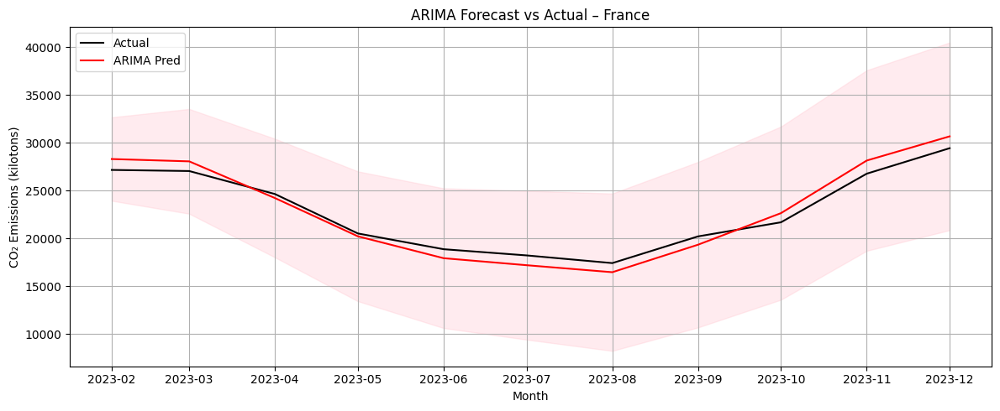


Saved 'arima_test_comparison_France.csv'
        Month    Actual_CO2  Predicted_CO2   Difference  Absolute_Difference
0 2023-02-01  27163.232346   28303.620329 -1140.387982          1140.387982
1 2023-03-01  27048.173994   28060.195890 -1012.021897          1012.021897
2 2023-04-01  24644.126358   24222.672125   421.454234           421.454234
3 2023-05-01  20520.009174   20221.589610   298.419564           298.419564
4 2023-06-01  18873.769150   17933.336773   940.432377           940.432377


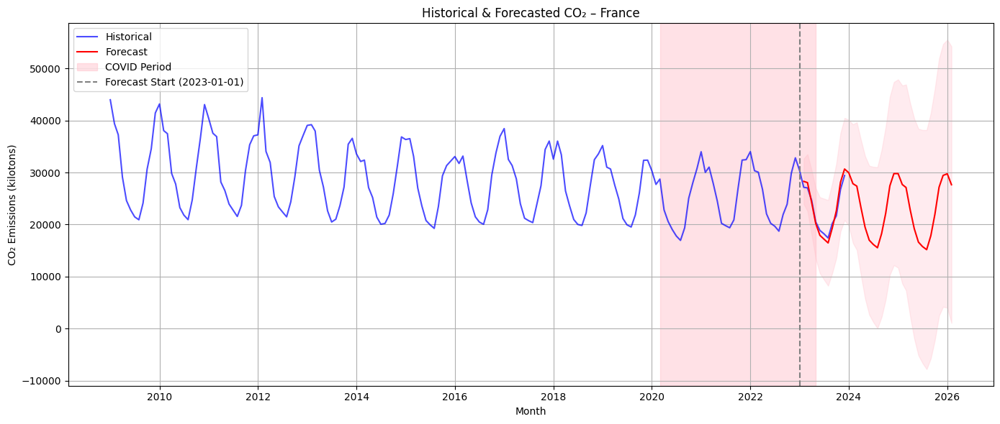


Saved 'arima_future_forecast_France.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    28303.620329  23939.096602  32668.144055
1 2023-03-01    28060.195890  22584.841612  33535.550169
2 2023-04-01    24222.672125  18022.726446  30422.617803
3 2023-05-01    20221.589610  13435.364814  27007.814405
4 2023-06-01    17933.336773  10628.541512  25238.132035

=== Processing Ireland ===


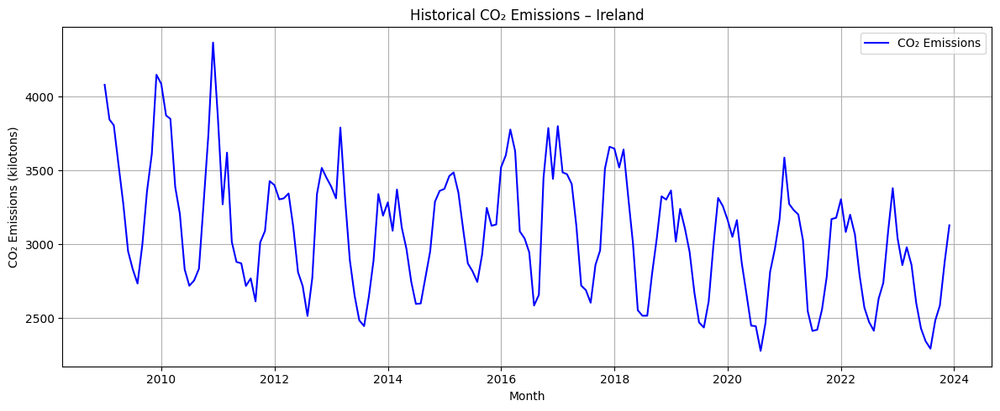

ADF Statistic for Ireland: -1.1929
p-value: 0.6766
Critical Values:
   1%: -3.4701
   5%: -2.8790
   10%: -2.5761
Stationary: False



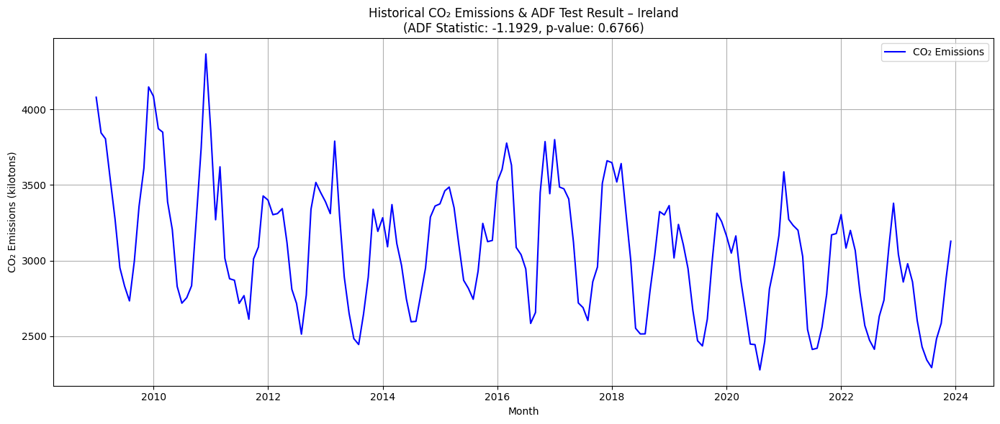

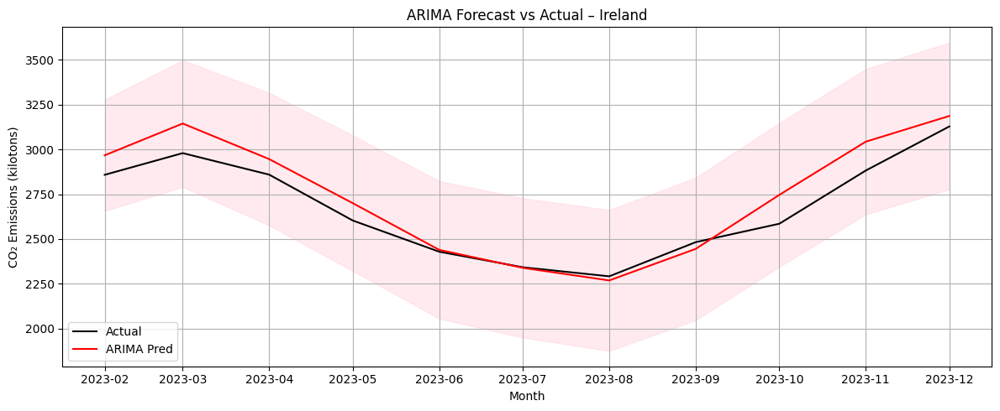


Saved 'arima_test_comparison_Ireland.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  2858.135173    2966.991720 -108.856547           108.856547
1 2023-03-01  2979.243016    3144.340784 -165.097768           165.097768
2 2023-04-01  2859.231048    2946.005643  -86.774595            86.774595
3 2023-05-01  2603.262043    2700.110297  -96.848254            96.848254
4 2023-06-01  2429.196550    2439.566419  -10.369869            10.369869


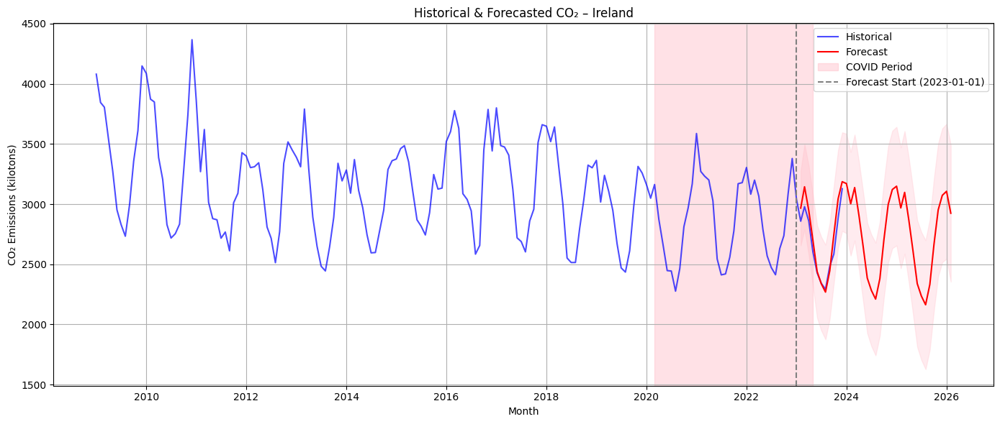


Saved 'arima_future_forecast_Ireland.csv'
        Month  Forecasted_CO2     CI_Lower     CI_Upper
0 2023-02-01     2966.991720  2656.539160  3277.444281
1 2023-03-01     3144.340784  2790.533215  3498.148353
2 2023-04-01     2946.005643  2576.358050  3315.653237
3 2023-05-01     2700.110297  2322.089018  3078.131577
4 2023-06-01     2439.566419  2055.709615  2823.423224

=== Processing Italy ===


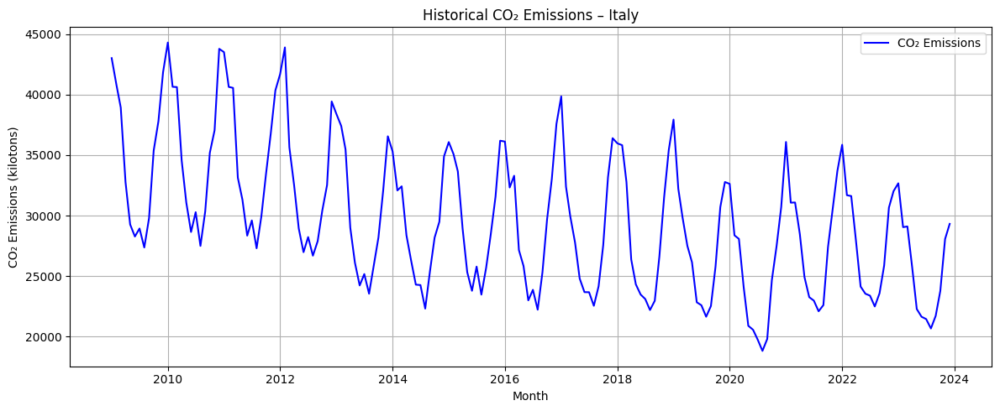

ADF Statistic for Italy: -1.5151
p-value: 0.5260
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



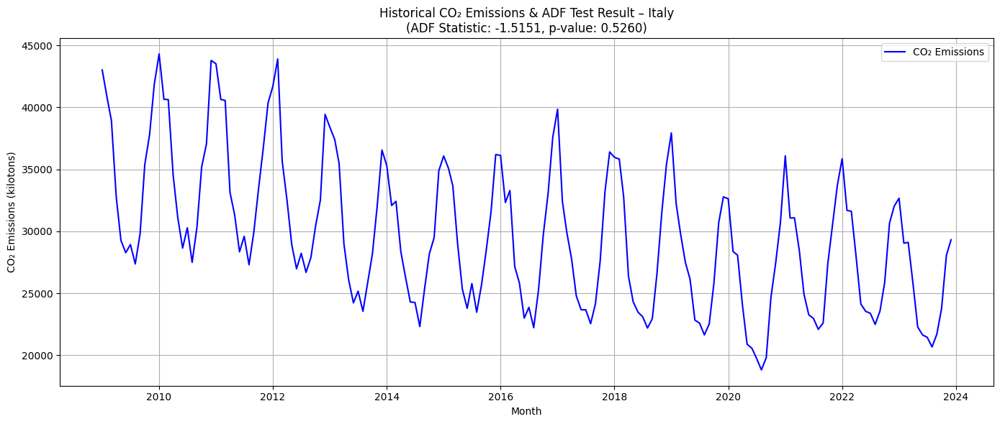

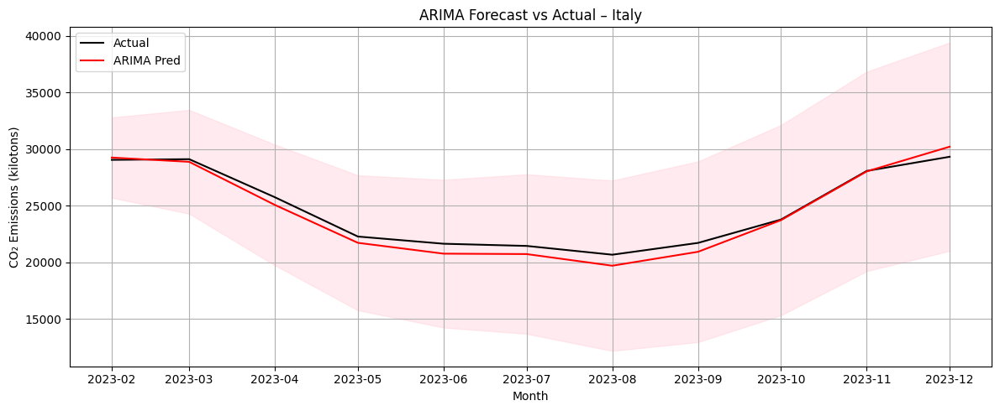


Saved 'arima_test_comparison_Italy.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  29046.750209   29247.532251 -200.782043           200.782043
1 2023-03-01  29105.204610   28871.196977  234.007633           234.007633
2 2023-04-01  25744.022809   25064.788313  679.234497           679.234497
3 2023-05-01  22276.974007   21722.989927  553.984079           553.984079
4 2023-06-01  21641.653871   20765.387967  876.265904           876.265904


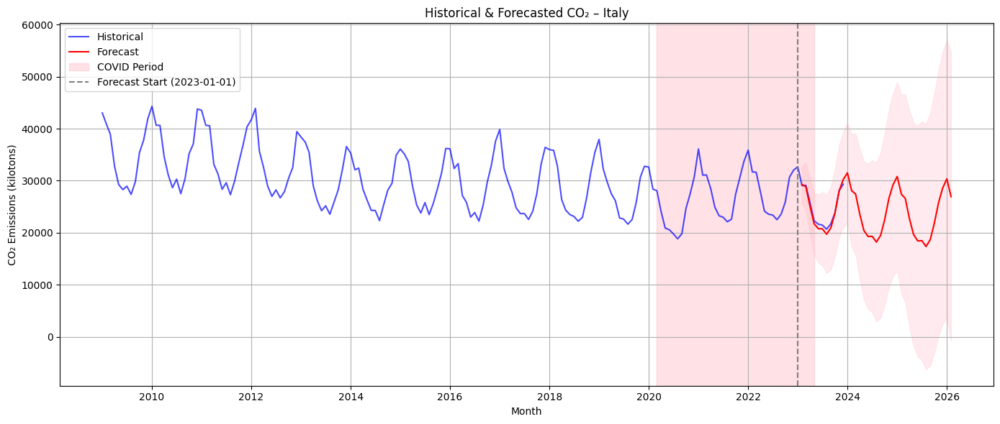


Saved 'arima_future_forecast_Italy.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    29247.532251  25704.979707  32790.084795
1 2023-03-01    28871.196977  24290.559630  33451.834324
2 2023-04-01    25064.788313  19737.556948  30392.019677
3 2023-05-01    21722.989927  15765.586745  27680.393110
4 2023-06-01    20765.387967  14244.610402  27286.165532

=== Processing Netherlands ===


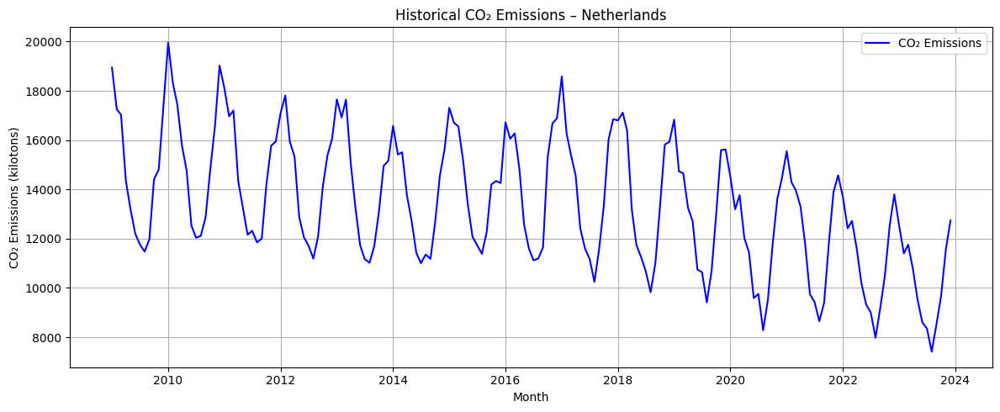

ADF Statistic for Netherlands: 0.5143
p-value: 0.9853
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



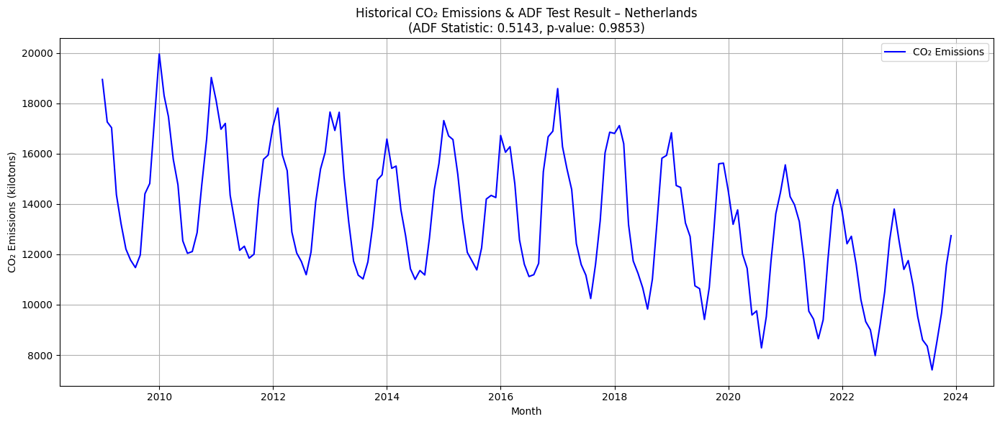

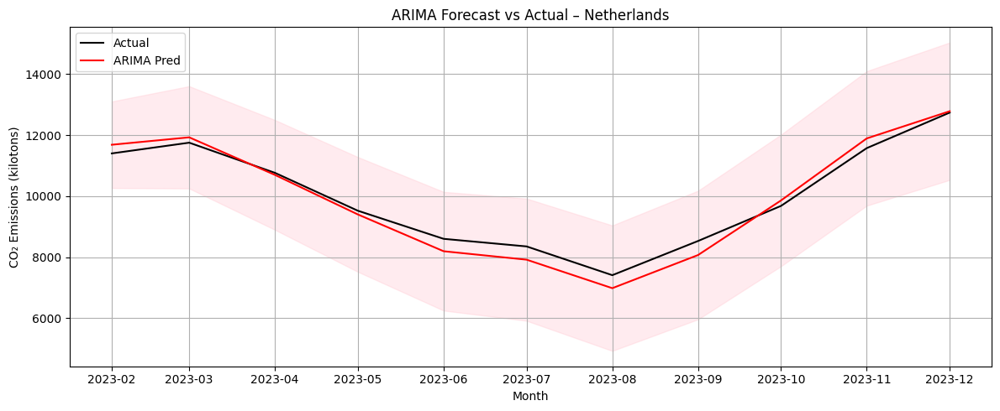


Saved 'arima_test_comparison_Netherlands.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  11401.436924   11685.563032 -284.126108           284.126108
1 2023-03-01  11753.282882   11928.612998 -175.330115           175.330115
2 2023-04-01  10764.907832   10696.672718   68.235113            68.235113
3 2023-05-01   9522.175179    9400.312873  121.862306           121.862306
4 2023-06-01   8601.282842    8194.720950  406.561892           406.561892


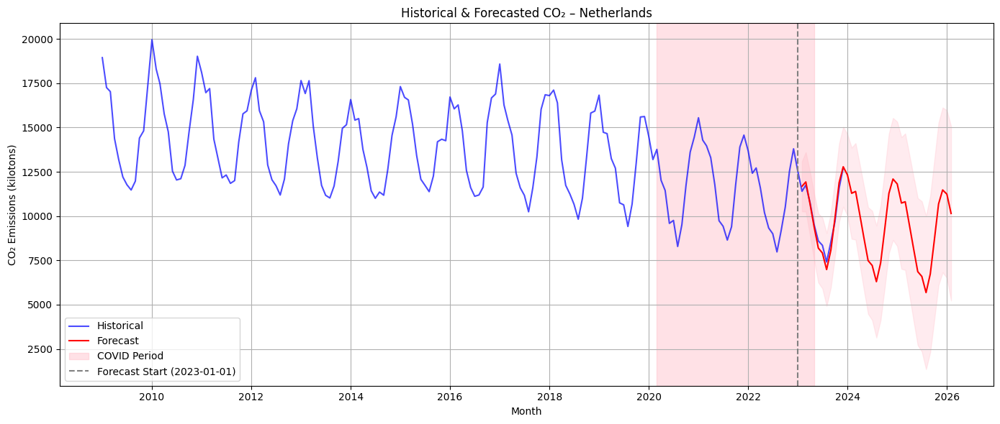


Saved 'arima_future_forecast_Netherlands.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    11685.563032  10267.196150  13103.929913
1 2023-03-01    11928.612998  10252.698055  13604.527940
2 2023-04-01    10696.672718   8897.441945  12495.903492
3 2023-05-01     9400.312873   7519.827909  11280.797838
4 2023-06-01     8194.720950   6249.420625  10140.021274

=== Processing Poland ===


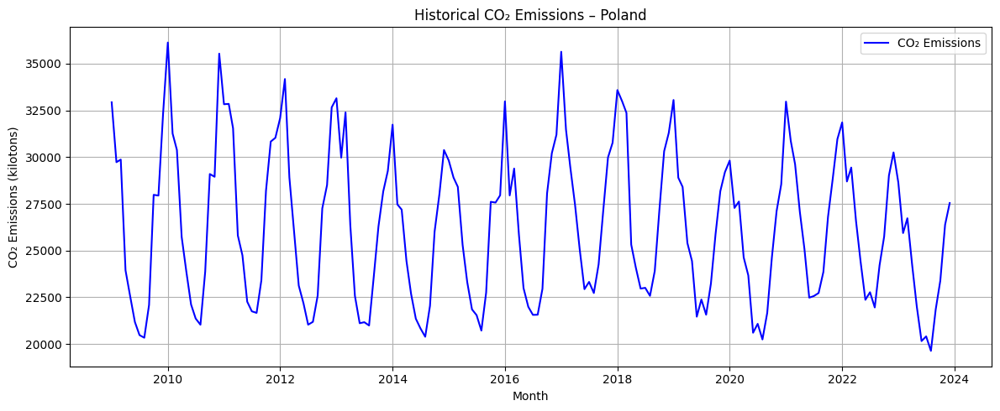

ADF Statistic for Poland: -1.8239
p-value: 0.3687
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



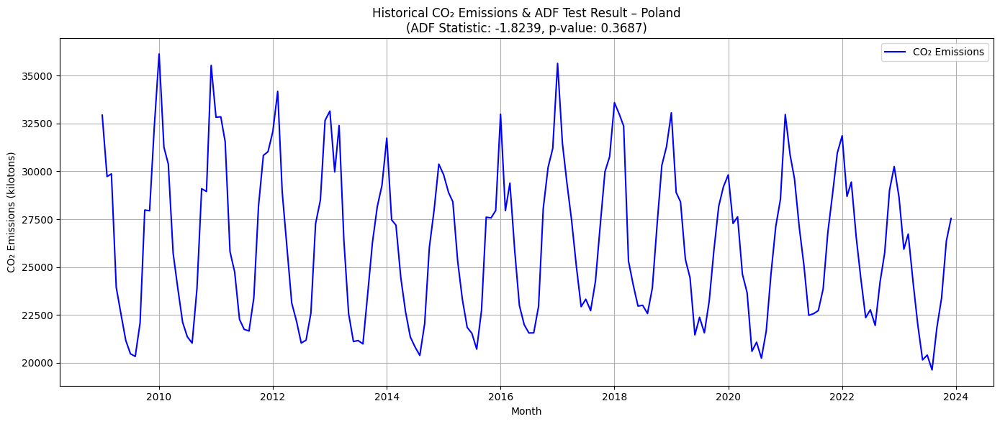

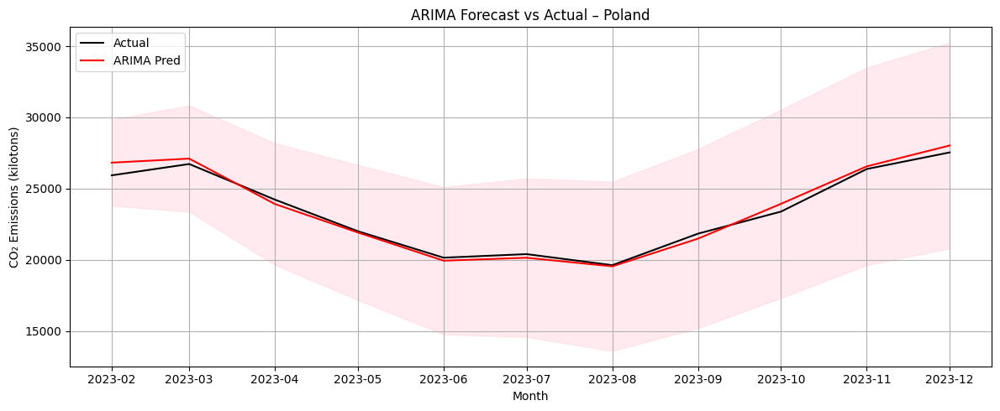


Saved 'arima_test_comparison_Poland.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  25936.026455   26825.370311 -889.343856           889.343856
1 2023-03-01  26729.181721   27108.646856 -379.465134           379.465134
2 2023-04-01  24230.123948   23922.664601  307.459347           307.459347
3 2023-05-01  22013.294691   21923.509224   89.785466            89.785466
4 2023-06-01  20158.109222   19948.501146  209.608076           209.608076


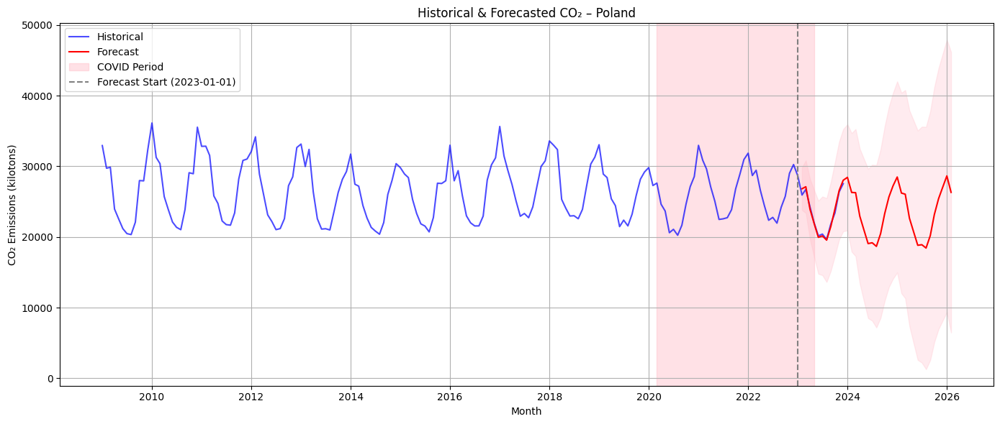


Saved 'arima_future_forecast_Poland.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    26825.370311  23806.217456  29844.523167
1 2023-03-01    27108.646856  23382.808791  30834.484920
2 2023-04-01    23922.664601  19657.199070  28188.130133
3 2023-05-01    21923.509224  17185.345030  26661.673418
4 2023-06-01    19948.501146  14781.389711  25115.612582

=== Processing Spain ===


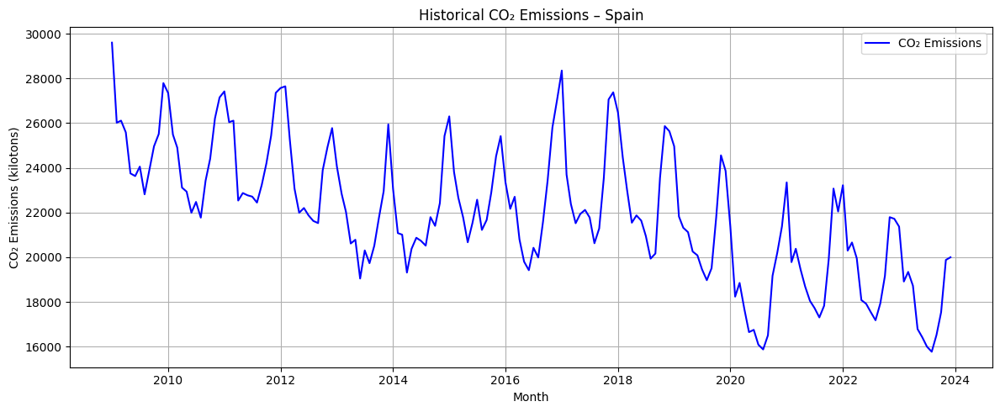

ADF Statistic for Spain: -1.0666
p-value: 0.7282
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



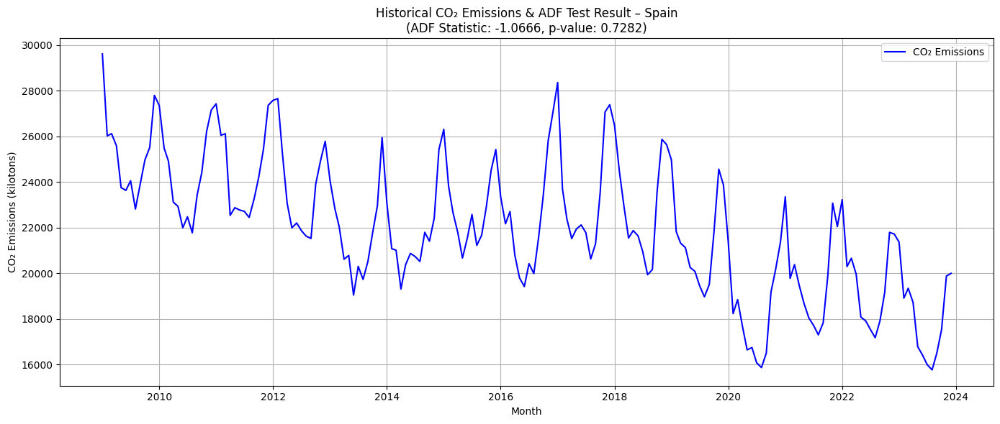

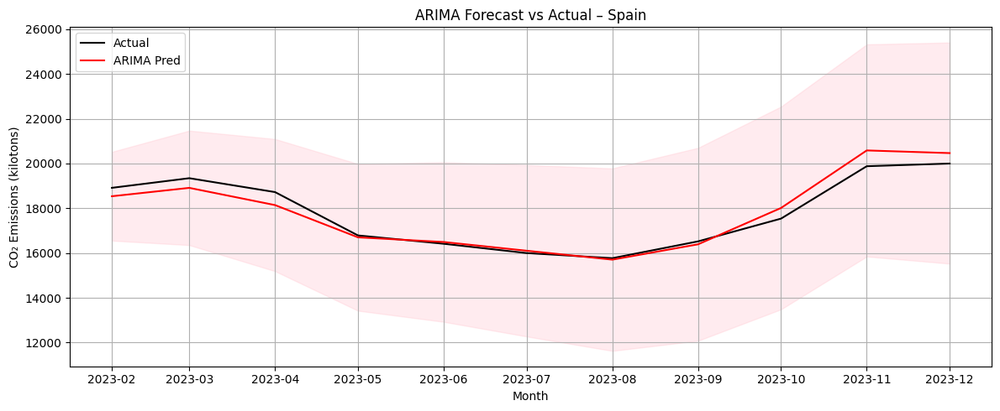


Saved 'arima_test_comparison_Spain.csv'
        Month    Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  18913.739341   18537.790093  375.949249           375.949249
1 2023-03-01  19344.562202   18912.074811  432.487391           432.487391
2 2023-04-01  18724.030617   18143.005077  581.025540           581.025540
3 2023-05-01  16786.861266   16701.675996   85.185270            85.185270
4 2023-06-01  16414.423633   16492.851284  -78.427651            78.427651


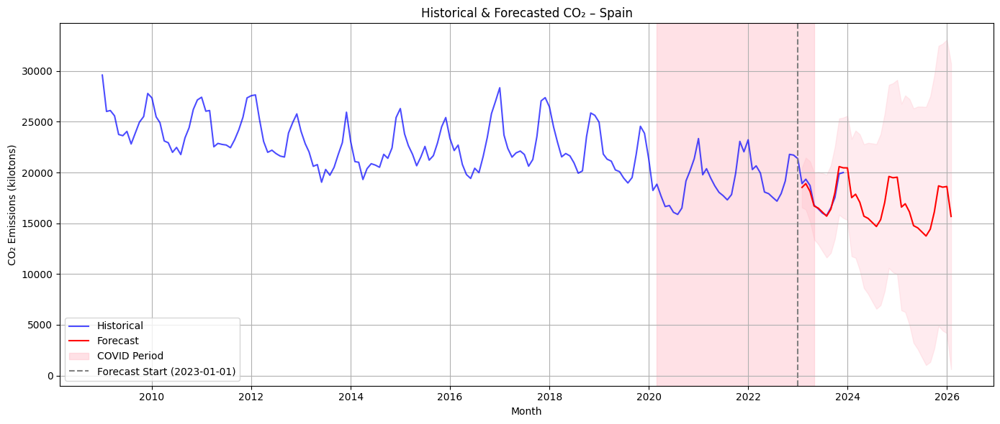


Saved 'arima_future_forecast_Spain.csv'
        Month  Forecasted_CO2      CI_Lower      CI_Upper
0 2023-02-01    18537.790093  16554.243131  20521.337055
1 2023-03-01    18912.074811  16355.061385  21469.088238
2 2023-04-01    18143.005077  15190.553327  21095.456827
3 2023-05-01    16701.675996  13423.399773  19979.952218
4 2023-06-01    16492.851284  12925.878315  20059.824253

=== Processing Sweden ===


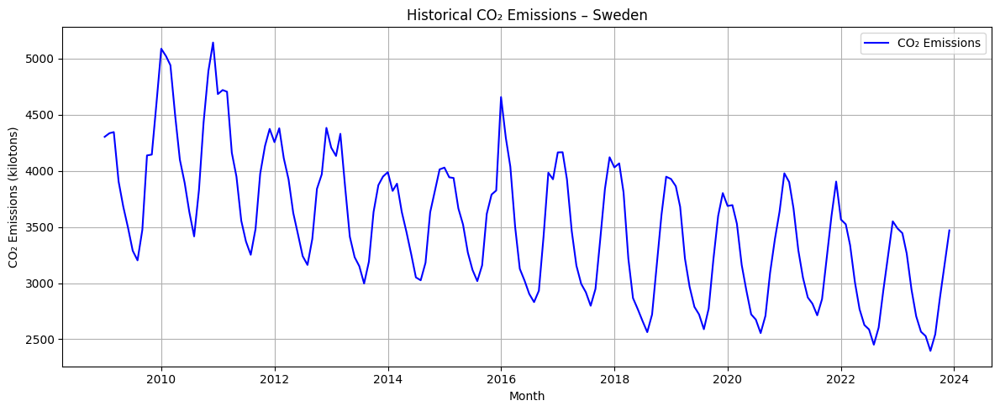

ADF Statistic for Sweden: -1.4989
p-value: 0.5341
Critical Values:
   1%: -3.4706
   5%: -2.8792
   10%: -2.5762
Stationary: False



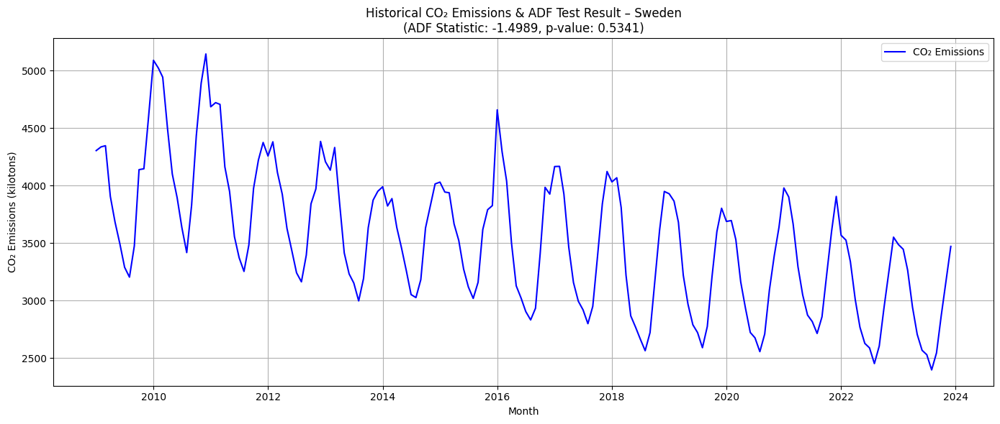

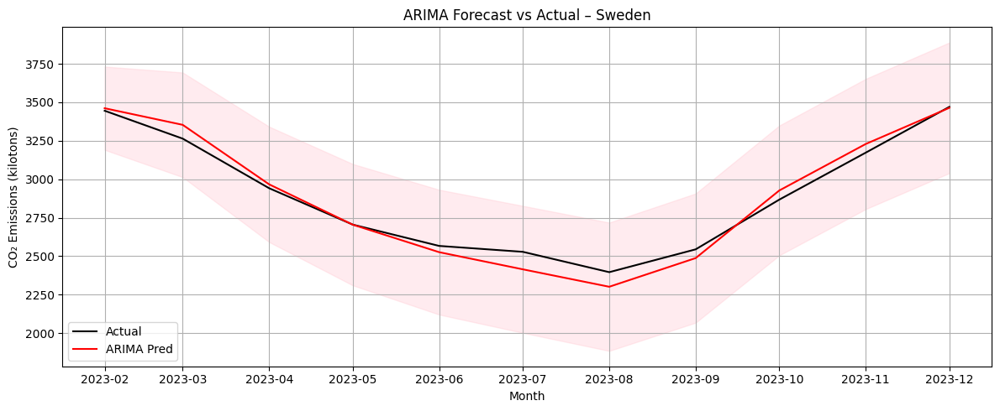


Saved 'arima_test_comparison_Sweden.csv'
        Month   Actual_CO2  Predicted_CO2  Difference  Absolute_Difference
0 2023-02-01  3445.403540    3461.658115  -16.254575            16.254575
1 2023-03-01  3264.110514    3353.723896  -89.613382            89.613382
2 2023-04-01  2941.981960    2967.131894  -25.149934            25.149934
3 2023-05-01  2705.426422    2705.000990    0.425431             0.425431
4 2023-06-01  2566.987493    2526.301362   40.686132            40.686132


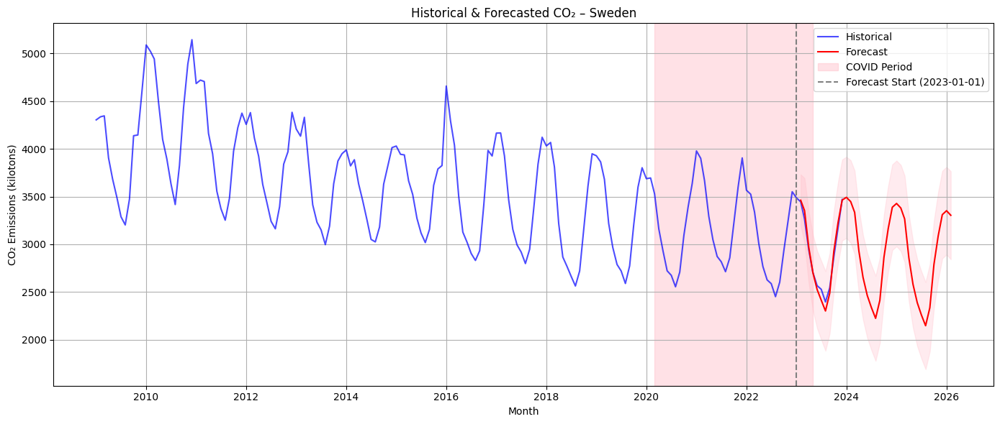


Saved 'arima_future_forecast_Sweden.csv'
        Month  Forecasted_CO2     CI_Lower     CI_Upper
0 2023-02-01     3461.658115  3191.229867  3732.086363
1 2023-03-01     3353.723896  3013.780222  3693.667570
2 2023-04-01     2967.131894  2592.313058  3341.950730
3 2023-05-01     2705.000990  2310.839731  3099.162250
4 2023-06-01     2526.301362  2120.826016  2931.776707

=== Model Performance Comparison ===
----------------------------------------------------------------------------------------------------
Country         | RMSE       | MAE        | MAPE       | R-squared 
----------------------------------------------------------------------------------------------------
Austria         | 128.67     | 109.20     | 2.53%      | 0.9714    
Belgium         | 592.07     | 536.69     | 7.81%      | 0.7891    
Germany         | 951.25     | 751.55     | 1.53%      | 0.9861    
France          | 978.56     | 930.21     | 4.11%      | 0.9410    
Ireland         | 101.51     | 82.94      | 2.9

In [5]:
import warnings
warnings.filterwarnings("ignore")  # Suppress warnings to keep output clean
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
    r2_score
)
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()  # Ensure proper datetime plotting with matplotlib

# Function to load and clean CO2 emissions data for a specific country
def load_co2_series(filepath, country_name):
    """
    Load and preprocess CO2 emissions data from an Excel file for a specific country.
    Parameters:
        filepath (str): Path to the Excel file
        country_name (str): Name of the country to filter
    Returns:
        series (Series): CO2 emissions time series with 'Month' as index
    """
    try:
        # Read Excel file and clean column names
        df = pd.read_excel(filepath)
        df.columns = df.columns.str.strip().str.replace(" ", "_")
        # Convert 'Month' column to datetime
        df["Month"] = pd.to_datetime(df["Month"], format="%Y-%m")
        # Filter for the specified country and sort by date
        df = df[df["Name"] == country_name].sort_values("Month")
        # Select only 'Month' and 'MonthlyTotal', drop missing values, and set 'Month' as index
        df = df[["Month", "MonthlyTotal"]].dropna().set_index("Month")
        return df["MonthlyTotal"]
    except Exception as e:
        print(f"Problem loading data for {country_name}: {e}")
        return None

# Function to plot historical CO2 emissions for visualization
def exploratory_analysis(endog, country_name):
    """
    Create a line plot of historical CO2 emissions.
    Parameters:
        endog (Series): CO2 emissions time series
        country_name (str): Name of the country
    """
    plt.figure(figsize=(12, 5))
    plt.plot(endog.index, endog, color="blue", label="CO₂ Emissions")
    plt.title(f"Historical CO₂ Emissions – {country_name}")
    plt.xlabel("Month")
    plt.ylabel("CO₂ Emissions (kilotons)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Function to perform ADF test and visualize stationarity results
def adf_test_and_visualization(endog, country_name):
    """
    Perform Augmented Dickey-Fuller (ADF) test to check if the time series is stationary.
    Parameters:
        endog (Series): CO2 emissions time series
        country_name (str): Name of the country
    """
    try:
        # Run ADF test to check stationarity
        result = adfuller(endog)
        print(f"ADF Statistic for {country_name}: {result[0]:.4f}")
        print(f"p-value: {result[1]:.4f}")
        print("Critical Values:")
        for key, value in result[4].items():
            print(f"   {key}: {value:.4f}")
        is_stationary = result[1] < 0.05  # p-value < 0.05 indicates stationarity
        print(f"Stationary: {is_stationary}\n")

        # Plot time series with ADF test results
        plt.figure(figsize=(14, 6))
        plt.plot(endog.index, endog, color="blue", label="CO₂ Emissions")
        plt.title(f"Historical CO₂ Emissions & ADF Test Result – {country_name}\n(ADF Statistic: {result[0]:.4f}, p-value: {result[1]:.4f})")
        plt.xlabel("Month")
        plt.ylabel("CO₂ Emissions (kilotons)")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error in ADF test for {country_name}: {e}")

# Function to split data into training and testing sets
def train_test_split(series, cutoff="2023-01-01"):
    """
    Split the time series into training and testing sets based on a cutoff date.
    Parameters:
        series (Series): CO2 emissions time series
        cutoff (str): Date to split train/test data (default: '2023-01-01')
    Returns:
        train, test: Training and testing datasets
    """
    try:
        cutoff = pd.to_datetime(cutoff)
        mask = series.index <= cutoff
        train = series.loc[mask]
        test = series.loc[~mask]
        return train, test
    except Exception as e:
        print(f"Error splitting data: {e}")
        return None, None

# Function to train an ARIMA model
def train_arima(endog_train, country_name, order=(1,1,1), seasonal_order=(1,1,1,12)):
    """
    Train an ARIMA model with specified order and seasonal order.
    Parameters:
        endog_train (Series): Training CO2 emissions
        country_name (str): Name of the country
        order (tuple): ARIMA order (p,d,q)
        seasonal_order (tuple): Seasonal ARIMA order (P,D,Q,s)
    Returns:
        fit: Trained ARIMA model
    """
    try:
        model = ARIMA(
            endog_train,
            order=order,
            seasonal_order=seasonal_order,
            trend="n"  # No trend component
        )
        return model.fit()
    except Exception as e:
        print(f"Error training ARIMA for {country_name}: {e}")
        return None

# Function to evaluate ARIMA model and plot forecasts
def evaluate_arima(fit, endog_test, country_name):
    """
    Evaluate ARIMA model by forecasting and computing performance metrics.
    Parameters:
        fit: Trained ARIMA model
        endog_test (Series): Test CO2 emissions
        country_name (str): Name of the country
    Returns:
        rmse, mae, mape, r2: Performance metrics
    """
    try:
        # Generate forecast for the test period
        fc = fit.get_forecast(steps=len(endog_test))
        pred = fc.predicted_mean
        ci = fc.conf_int()

        # Calculate performance metrics
        mae = mean_absolute_error(endog_test, pred)
        rmse = np.sqrt(mean_squared_error(endog_test, pred))
        mape = mean_absolute_percentage_error(endog_test, pred)
        r2 = r2_score(endog_test, pred)

        # Plot actual vs predicted values
        plt.figure(figsize=(12, 5))
        plt.plot(endog_test.index, endog_test, label="Actual", color="black")
        plt.plot(endog_test.index, pred, label="ARIMA Pred", color="red")
        plt.fill_between(endog_test.index, ci.iloc[:,0], ci.iloc[:,1], color="pink", alpha=0.3)
        plt.title(f"ARIMA Forecast vs Actual – {country_name}")
        plt.xlabel("Month")
        plt.ylabel("CO₂ Emissions (kilotons)")
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()

        # Save comparison of actual vs predicted values to CSV
        comp = pd.DataFrame({
            "Month": endog_test.index,
            "Actual_CO2": endog_test.values,
            "Predicted_CO2": pred.values,
            "Difference": (endog_test - pred).values,
            "Absolute_Difference": np.abs(endog_test - pred).values
        })
        comp.to_csv(f"arima_test_comparison_{country_name}.csv", index=False)
        print(f"\nSaved 'arima_test_comparison_{country_name}.csv'\n", comp.head())
        return rmse, mae, mape, r2
    except Exception as e:
        print(f"Error evaluating ARIMA model for {country_name}: {e}")
        return None, None, None, None

# Function to forecast future CO2 emissions and visualize results
def forecast_future_arima(fit, history, start_date="2023-01-01", end_date="2026-01-01", country_name="Country"):
    """
    Forecast future CO2 emissions and create a plot with historical and forecasted data.
    Parameters:
        fit: Trained ARIMA model
        history (Series): Historical CO2 emissions
        start_date (str): Start date for forecasting
        end_date (str): End date for forecasting
        country_name (str): Name of the country
    """
    try:
        # Create date range for future forecasts
        fut_idx = pd.date_range(start=start_date, end=end_date, freq="MS")
        fc = fit.get_forecast(steps=len(fut_idx))
        pred = fc.predicted_mean
        ci = fc.conf_int()

        # Plot historical and forecasted data
        plt.figure(figsize=(14, 6))
        plt.plot(history.index, history, label="Historical", color="blue", alpha=0.7)
        plt.plot(pred.index, pred, label="Forecast", color="red")
        plt.fill_between(pred.index, ci.iloc[:,0], ci.iloc[:,1], color="pink", alpha=0.3)
        # Highlight COVID period
        plt.axvspan(pd.to_datetime("2020-03-01"), pd.to_datetime("2023-05-01"),
                    color="lightpink", alpha=0.4, label="COVID Period")
        # Add vertical line for forecast start
        plt.axvline(pd.to_datetime(start_date), color="gray", linestyle="--",
                    label=f"Forecast Start ({start_date})")
        plt.title(f"Historical & Forecasted CO₂ – {country_name}")
        plt.xlabel("Month")
        plt.ylabel("CO₂ Emissions (kilotons)")
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()

        # Save forecasted data to CSV
        fut_df = pd.DataFrame({
            "Month": pred.index,
            "Forecasted_CO2": pred.values,
            "CI_Lower": ci.iloc[:,0].values,
            "CI_Upper": ci.iloc[:,1].values
        })
        fut_df.to_csv(f"arima_future_forecast_{country_name}.csv", index=False)
        print(f"\nSaved 'arima_future_forecast_{country_name}.csv'\n", fut_df.head())
    except Exception as e:
        print(f"Error forecasting for {country_name}: {e}")

# Main execution block
if __name__ == "__main__":
    # Define file path and list of countries to process
    FILEPATH = "cgrt_edgar_combined1.xlsx"
    COUNTRIES = ['Austria', 'Belgium', 'Germany', 'France', 'Ireland', 'Italy', 'Netherlands', 'Poland', 'Spain', 'Sweden']
    metrics = {}  # Dictionary to store performance metrics

    # Process each country
    for COUNTRY_NAME in COUNTRIES:
        print(f"\n=== Processing {COUNTRY_NAME} ===")
        # Load CO2 data
        series = load_co2_series(FILEPATH, COUNTRY_NAME)
        if series is None:
            continue
        # Perform exploratory analysis
        exploratory_analysis(series, COUNTRY_NAME)
        # Check stationarity with ADF test
        adf_test_and_visualization(series, COUNTRY_NAME)
        # Split data into training and testing sets
        train_y, test_y = train_test_split(series, cutoff="2023-01-01")
        if train_y is None or test_y is None:
            continue
        # Train ARIMA model
        arima_fit = train_arima(train_y, COUNTRY_NAME, order=(1,1,1), seasonal_order=(1,1,1,12))
        if arima_fit is None:
            continue
        # Evaluate ARIMA model
        rmse, mae, mape, r2 = evaluate_arima(arima_fit, test_y, COUNTRY_NAME)
        if rmse is None:
            continue
        # Forecast future CO2 emissions
        forecast_future_arima(arima_fit, series, start_date="2023-01-01", end_date="2026-01-01", country_name=COUNTRY_NAME)
        # Store performance metrics
        metrics[COUNTRY_NAME] = {'RMSE': rmse, 'MAE': mae, 'MAPE': mape, 'R-squared': r2}

    # Compare metrics
    if metrics:
        print("\n=== Model Performance Comparison ===")
        print("-" * 100)
        # Print header for comparison table
        print(f"{'Country':<15} | {'RMSE':<10} | {'MAE':<10} | {'MAPE':<10} | {'R-squared':<10}")
        print("-" * 100)
        # Print metrics for each country
        for country, metric in metrics.items():
            print(f"{country:<15} | {metric['RMSE']:<10.2f} | {metric['MAE']:<10.2f} | {metric['MAPE']:<10.2%} | {metric['R-squared']:<10.4f}")
        print("-" * 100)

## Full model comparisons with visualisation of all 3 models together per country
* XGBoost
* SARIMAX
* ARIMA




=== Processing Austria ===
Best Parameters for Austria: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 200}


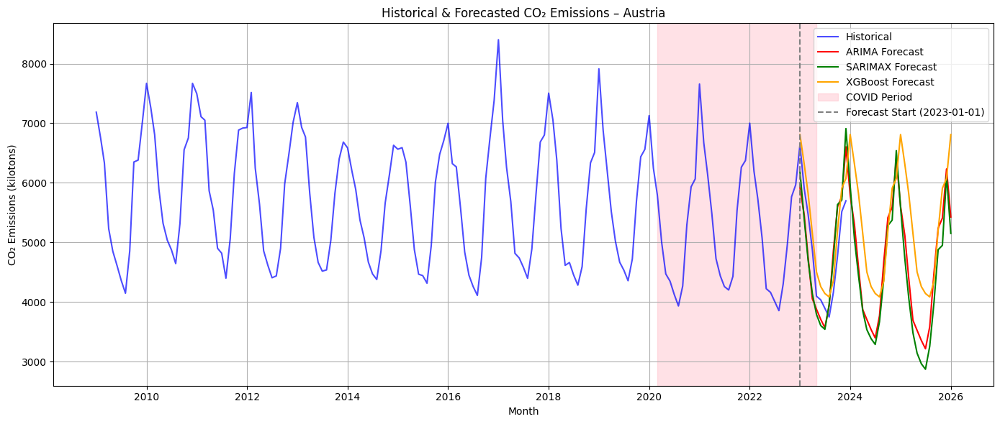


Saved 'combined_forecast_Austria.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01     5919.172426     5423.790325     6414.554526   
1 2023-02-01     5456.434486     4888.585246     6024.283727   
2 2023-03-01     4753.597866     4150.716179     5356.479552   
3 2023-04-01     4052.740781     3424.511565     4680.969997   
4 2023-05-01     3878.183362     3227.946780     4528.419944   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0       6184.766174       5575.197877       6794.334470       6809.217285  
1       5390.236461       4684.838969       6095.633953       6310.834473  
2       4706.510398       3925.398345       5487.622452       5823.882812  
3       4138.434563       3288.913000       4987.956127       5152.438477  
4       3792.086812       2879.310077       4704.863547       4503.005859  

=== Processing Belgium ===
Best Parameters for Belgium: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 200}


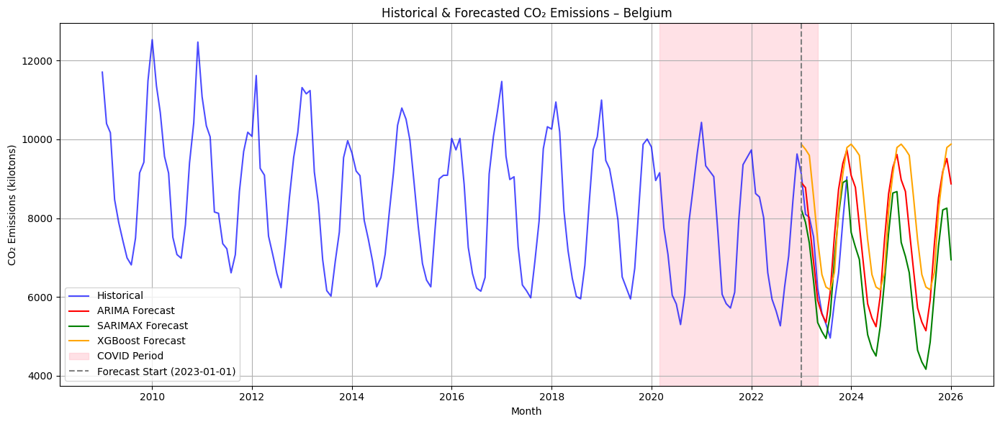


Saved 'combined_forecast_Belgium.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01     8904.953231     7952.358145     9857.548317   
1 2023-02-01     8773.268279     7736.137638     9810.398919   
2 2023-03-01     7872.540989     6819.217548     8925.864430   
3 2023-04-01     6886.469152     5829.422891     7943.515413   
4 2023-05-01     5916.669622     4858.578695     6974.760550   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0       8226.357255       6814.816614       9637.897896       9878.209961  
1       7894.804923       6234.792452       9554.817395       9745.793945  
2       7370.033838       5570.887479       9169.180197       9594.212891  
3       6402.620230       4495.164196       8310.076265       8539.845703  
4       5350.944297       3347.254530       7354.634065       7449.866211  

=== Processing Germany ===
Best Parameters for Germany: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


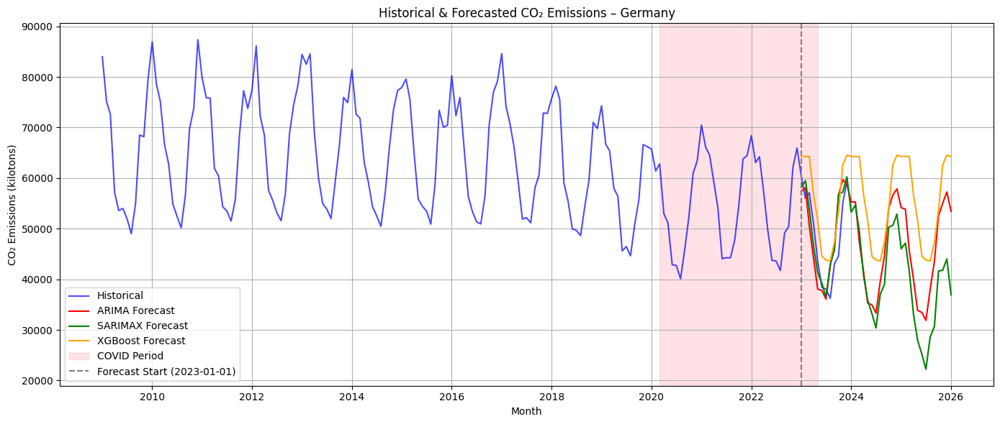


Saved 'combined_forecast_Germany.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01    57397.766752    48633.351936    66162.181568   
1 2023-02-01    58081.579792    46866.106625    69297.052959   
2 2023-03-01    50486.855266    37544.151900    63429.558631   
3 2023-04-01    44157.843490    29765.226120    58550.460860   
4 2023-05-01    38066.302216    22377.001206    53755.603226   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0      58196.383303      49724.955170      66667.811436      64283.816406  
1      59492.299454      50221.345694      68763.253214      64283.816406  
2      53922.365728      44071.907798      63772.823659      64283.816406  
3      46515.628855      36130.870547      56900.387163      56675.476562  
4      41385.482551      30493.741773      52277.223329      51697.347656  

=== Processing France ===
Best Parameters for France: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


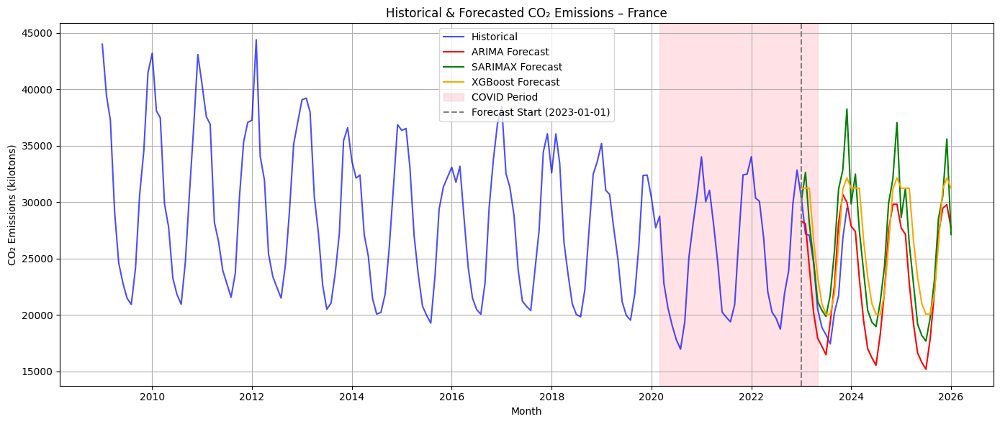


Saved 'combined_forecast_France.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01    28303.620329    23939.096602    32668.144055   
1 2023-02-01    28060.195890    22584.841612    33535.550169   
2 2023-03-01    24222.672125    18022.726446    30422.617803   
3 2023-04-01    20221.589610    13435.364814    27007.814405   
4 2023-05-01    17933.336773    10628.541512    25238.132035   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0      30049.394447      25493.096979      34605.691916      31228.111328  
1      32626.733322      27579.078427      37674.388217      31228.111328  
2      28105.663304      22695.751537      33515.575070      31228.111328  
3      24811.924353      19069.750535      30554.098171      26607.937500  
4      21180.243998      15124.654499      27235.833496      23349.107422  

=== Processing Ireland ===
Best Parameters for Ireland: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}


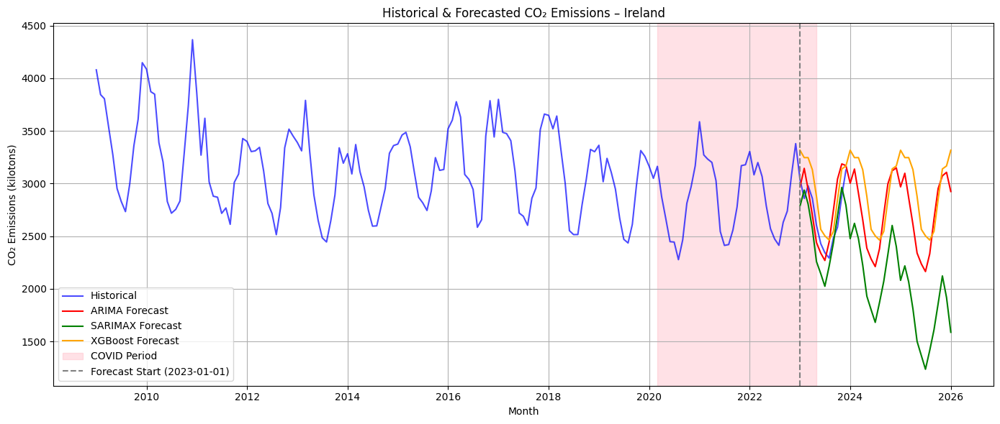


Saved 'combined_forecast_Ireland.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01     2966.991720     2656.539160     3277.444281   
1 2023-02-01     3144.340784     2790.533215     3498.148353   
2 2023-03-01     2946.005643     2576.358050     3315.653237   
3 2023-04-01     2700.110297     2322.089018     3078.131577   
4 2023-05-01     2439.566419     2055.709615     2823.423224   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0       2783.988876       2366.673247       3201.304505       3316.725586  
1       2937.498449       2396.980768       3478.016130       3246.169189  
2       2806.741106       2182.789766       3430.692445       3246.578369  
3       2571.510281       1880.059364       3262.961198       3131.545654  
4       2258.427386       1507.826565       3009.028207       2877.869873  

=== Processing Italy ===
Best Parameters for Italy: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 100}


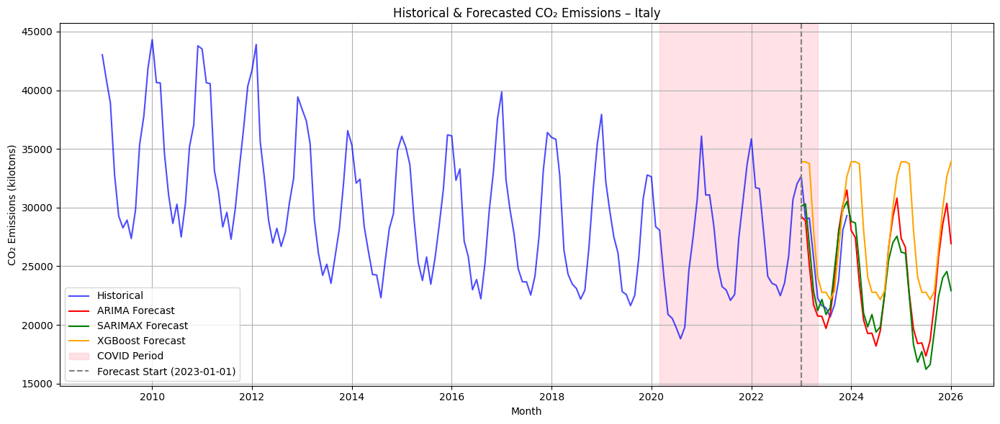


Saved 'combined_forecast_Italy.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01    29247.532251    25704.979707    32790.084795   
1 2023-02-01    28871.196977    24290.559630    33451.834324   
2 2023-03-01    25064.788313    19737.556948    30392.019677   
3 2023-04-01    21722.989927    15765.586745    27680.393110   
4 2023-05-01    20765.387967    14244.610402    27286.165532   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0      30128.909323      26782.544018      33475.274628      33903.101562  
1      30305.995076      26610.859217      34001.130936      33903.101562  
2      26801.833011      22857.014863      30746.651159      33739.558594  
3      22859.918460      18686.690386      27033.146534      28091.529297  
4      21213.733421      16824.593945      25602.872898      24108.966797  

=== Processing Netherlands ===
Best Parameters for Netherlands: {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 2

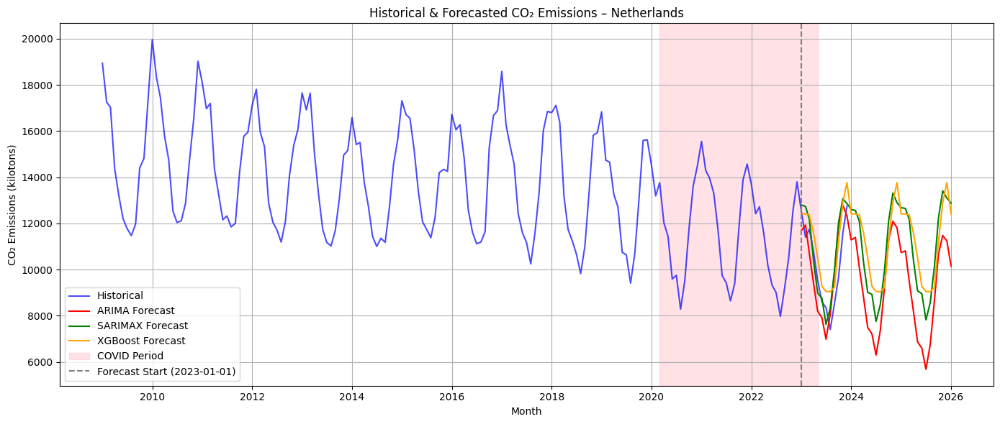


Saved 'combined_forecast_Netherlands.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01    11685.563032    10267.196150    13103.929913   
1 2023-02-01    11928.612998    10252.698055    13604.527940   
2 2023-03-01    10696.672718     8897.441945    12495.903492   
3 2023-04-01     9400.312873     7519.827909    11280.797838   
4 2023-05-01     8194.720950     6249.420625    10140.021274   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0      12799.393374      11079.916483      14518.870265      12411.967773  
1      12731.235239      10681.018065      14781.452414      12411.967773  
2      12185.074338       9888.912056      14481.236620      12367.500977  
3      10376.105789       7862.540616      12889.670961      11572.758789  
4       8974.993218       6261.972783      11688.013653      10509.161133  

=== Processing Poland ===
Best Parameters for Poland: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}


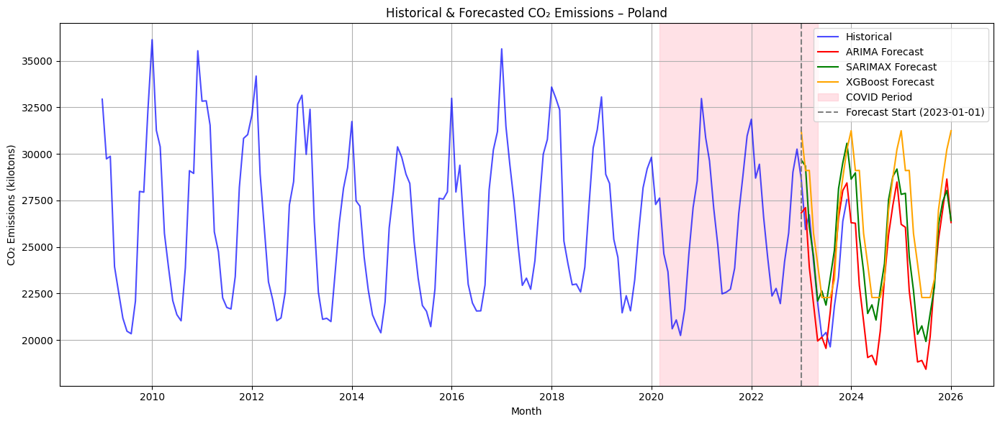


Saved 'combined_forecast_Poland.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01    26825.370311    23806.217456    29844.523167   
1 2023-02-01    27108.646856    23382.808791    30834.484920   
2 2023-03-01    23922.664601    19657.199070    28188.130133   
3 2023-04-01    21923.509224    17185.345030    26661.673418   
4 2023-05-01    19948.501146    14781.389711    25115.612582   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0      29670.021380      26579.790917      32760.251843      31239.001953  
1      29346.944189      26093.173690      32600.714688      29100.849609  
2      26083.886352      22624.607508      29543.165197      29108.654297  
3      24488.427480      20838.941666      28137.913293      25724.730469  
4      22092.818910      18262.291457      25923.346364      24086.179688  

=== Processing Spain ===
Best Parameters for Spain: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}


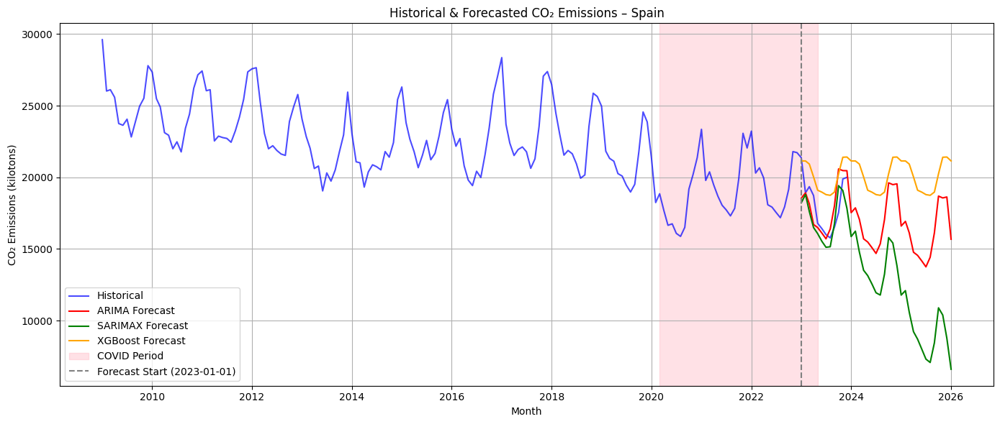


Saved 'combined_forecast_Spain.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01    18537.790093    16554.243131    20521.337055   
1 2023-02-01    18912.074811    16355.061385    21469.088238   
2 2023-03-01    18143.005077    15190.553327    21095.456827   
3 2023-04-01    16701.675996    13423.399773    19979.952218   
4 2023-05-01    16492.851284    12925.878315    20059.824253   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0      18214.644797      16030.110991      20399.178603      21141.582031  
1      18801.074919      16063.015829      21539.134008      21141.582031  
2      17611.800896      14541.002816      20682.598976      20923.425781  
3      16489.886472      13169.416310      19810.356633      20028.099609  
4      16066.333675      12535.256842      19597.410508      19097.691406  

=== Processing Sweden ===
Best Parameters for Sweden: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}


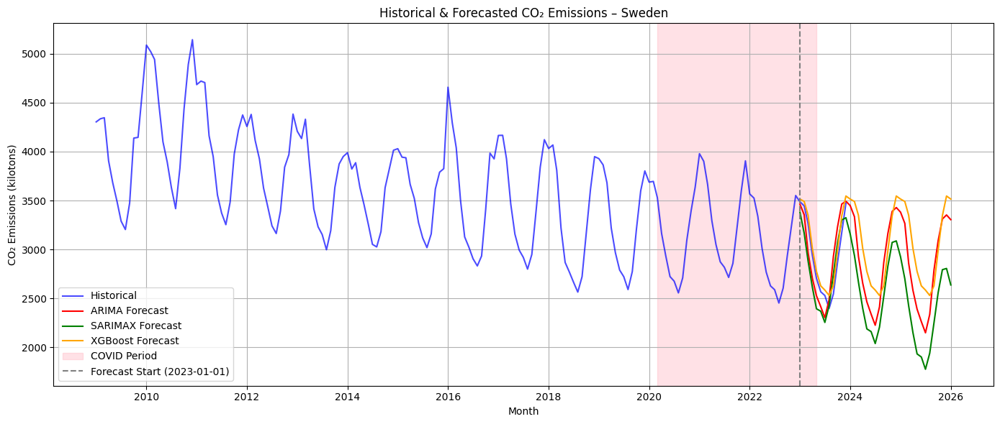


Saved 'combined_forecast_Sweden.csv'
        Month  ARIMA_Forecast  ARIMA_CI_Lower  ARIMA_CI_Upper  \
0 2023-01-01     3461.658115     3191.229867     3732.086363   
1 2023-02-01     3353.723896     3013.780222     3693.667570   
2 2023-03-01     2967.131894     2592.313058     3341.950730   
3 2023-04-01     2705.000990     2310.839731     3099.162250   
4 2023-05-01     2526.301362     2120.826016     2931.776707   

   SARIMAX_Forecast  SARIMAX_CI_Lower  SARIMAX_CI_Upper  XGBoost_Forecast  
0       3378.975237       3036.980725       3720.969749       3514.815430  
1       3165.056520       2737.803740       3592.309300       3489.875977  
2       2882.973862       2396.908277       3369.039447       3348.751953  
3       2615.600735       2080.037796       3151.163673       3010.411377  
4       2392.978261       1812.873540       2973.082982       2775.170166  

=== Model Performance Comparison ===
----------------------------------------------------------------------------------

In [3]:
import warnings
warnings.filterwarnings("ignore")  # Suppress warnings to keep output clean
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
    r2_score
)
from pandas.plotting import register_matplotlib_converters
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
register_matplotlib_converters()  # Ensure proper datetime plotting with matplotlib

# ARIMA
# Function to load and clean CO2 emissions data for a specific country
def load_co2_series(filepath, country_name):
    """
    Load and preprocess CO2 emissions data from an Excel file for a specific country.
    Parameters:
        filepath (str): Path to the Excel file
        country_name (str): Name of the country to filter
    Returns:
        series (Series): CO2 emissions time series with 'Month' as index
    """
    try:
        # Read Excel file and clean column names
        df = pd.read_excel(filepath)
        df.columns = df.columns.str.strip().str.replace(" ", "_")
        # Convert 'Month' column to datetime
        df["Month"] = pd.to_datetime(df["Month"], format="%Y-%m")
        # Filter for the specified country and sort by date
        df = df[df["Name"] == country_name].sort_values("Month")
        # Select only 'Month' and 'MonthlyTotal', drop missing values, and set 'Month' as index
        df = df[["Month", "MonthlyTotal"]].dropna().set_index("Month")
        return df["MonthlyTotal"]
    except Exception as e:
        print(f"Problem loading data for {country_name}: {e}")
        return None

# Function to split data into training and testing sets for ARIMA
def train_test_split(series, cutoff="2023-01-01"):
    """
    Split the time series into training and testing sets based on a cutoff date.
    Parameters:
        series (Series): CO2 emissions time series
        cutoff (str): Date to split train/test data (default: '2023-01-01')
    Returns:
        train, test: Training and testing datasets
    """
    try:
        cutoff = pd.to_datetime(cutoff)
        mask = series.index <= cutoff
        train = series.loc[mask]
        test = series.loc[~mask]
        return train, test
    except Exception as e:
        print(f"Error splitting data: {e}")
        return None, None

# Function to train an ARIMA model
def train_arima(endog_train, country_name, order=(1,1,1), seasonal_order=(1,1,1,12)):
    """
    Train an ARIMA model with specified order and seasonal order.
    Parameters:
        endog_train (Series): Training CO2 emissions
        country_name (str): Name of the country
        order (tuple): ARIMA order (p,d,q)
        seasonal_order (tuple): Seasonal ARIMA order (P,D,Q,s)
    Returns:
        fit: Trained ARIMA model
    """
    try:
        model = ARIMA(
            endog_train,
            order=order,
            seasonal_order=seasonal_order,
            trend="n"  # No trend component
        )
        return model.fit()
    except Exception as e:
        print(f"Error training ARIMA for {country_name}: {e}")
        return None

# Function to evaluate ARIMA model and save results
def evaluate_arima(fit, endog_test, country_name):
    """
    Evaluate ARIMA model by forecasting and computing performance metrics.
    Parameters:
        fit: Trained ARIMA model
        endog_test (Series): Test CO2 emissions
        country_name (str): Name of the country
    Returns:
        rmse, mae, mape, r2, pred, ci: Performance metrics, predictions, and confidence intervals
    """
    try:
        # Generate forecast for the test period
        fc = fit.get_forecast(steps=len(endog_test))
        pred = fc.predicted_mean
        ci = fc.conf_int()

        # Calculate performance metrics
        mae = mean_absolute_error(endog_test, pred)
        rmse = np.sqrt(mean_squared_error(endog_test, pred))
        mape = mean_absolute_percentage_error(endog_test, pred)
        r2 = r2_score(endog_test, pred)

        # Save comparison of actual vs predicted values to CSV
        comp = pd.DataFrame({
            "Month": endog_test.index,
            "Actual_CO2": endog_test.values,
            "Predicted_CO2": pred.values,
            "Difference": (endog_test - pred).values,
            "Absolute_Difference": np.abs(endog_test - pred).values
        })
        comp.to_csv(f"arima_test_comparison_{country_name}.csv", index=False)
        # print(f"\nSaved 'arima_test_comparison_{country_name}.csv'\n", comp.head()) # Commented out to reduce output
        return rmse, mae, mape, r2, pred, ci
    except Exception as e:
        print(f"Error evaluating ARIMA model for {country_name}: {e}")
        return None, None, None, None, None, None

# SARIMAX
# Function to load CO2 data with exogenous variables
def load_with_exog(filepath, country_name):
    """
    Load and preprocess CO2 emissions and exogenous variables for a specific country.
    Parameters:
        filepath (str): Path to the Excel file
        country_name (str): Name of the country to filter
    Returns:
        endog (Series): CO2 emissions time series
        exog (DataFrame): Exogenous variables (GDP, Energy Consumption, etc.)
    """
    try:
        # Read Excel file and clean column names
        df = pd.read_excel(filepath)
        df.columns = df.columns.str.strip().str.replace(' ', '_')
        # Convert 'Month' column to datetime
        df['Month'] = pd.to_datetime(df['Month'], format='%Y-%m')
        # Filter for the specified country and sort by date
        df = df[df['Name'] == country_name].sort_values('Month')
        # Select exogenous variables
        exog_cols = ['GDP', 'Energy_Consumption_TWh', 'StringencyIndex', 'Mobility_Index',
                     'Temperature_C', 'Unemployment_Rate', 'Industrial_Production_Index',
                     'C1E_School_closing', 'C2E_Workplace_closing', 'C3E_Cancel_public_events',
                     'C4E_Restrictions_on_gatherings', 'C5E_Close_public_transport',
                     'C6E_Stay_at_home_requirements', 'C7E_Restrictions_on_internal_movement',
                     'C8E_International_travel_controls']
        # Keep only relevant columns and drop missing values
        df = df[['Month', 'MonthlyTotal'] + [col for col in exog_cols if col in df.columns]].dropna()
        df = df.set_index('Month')
        endog = df['MonthlyTotal']  # Target variable (CO2 emissions)
        exog = df[[col for col in exog_cols if col in df.columns]]  # Exogenous variables
        return endog, exog
    except Exception as e:
        print(f"Problem loading data for {country_name}: {e}")
        return None, None

# Function to split data with exogenous variables
def split_with_exog(endog, exog, cutoff='2023-01-01'):
    """
    Split data into training and testing sets for SARIMAX, including exogenous variables.
    Parameters:
        endog (Series): CO2 emissions time series
        exog (DataFrame): Exogenous variables
        cutoff (str): Date to split train/test data (default: '2023-01-01')
    Returns:
        train_endog, test_endog, train_exog, test_exog: Split datasets
    """
    try:
        cutoff = pd.to_datetime(cutoff)
        train_mask = endog.index <= cutoff
        train_endog = endog[train_mask]
        test_endog = endog[~train_mask]
        train_exog = exog.loc[train_endog.index]
        test_exog = exog.loc[test_endog.index]
        return train_endog, test_endog, train_exog, test_exog
    except Exception as e:
        print(f"Error splitting data: {e}")
        return None, None, None, None

# Function to train a SARIMAX model with exogenous variables
def train_sarimax_with_exog(endog_train, exog_train, country_name, order=(1,1,1), seasonal_order=(1,1,1,12), trend='t'):
    """
    Train a SARIMAX model with specified parameters.
    Parameters:
        endog_train (Series): Training CO2 emissions
        exog_train (DataFrame): Training exogenous variables
        country_name (str): Name of the country
        order (tuple): ARIMA order (p,d,q)
        seasonal_order (tuple): Seasonal ARIMA order (P,D,Q,s)
        trend (str): Trend component ('t' for linear trend)
    Returns:
        fit: Trained SARIMAX model
    """
    try:
        # Ensure exog_train has the same index as endog_train
        exog_train = exog_train.loc[endog_train.index]

        model = SARIMAX(
            endog_train,
            exog=exog_train,
            order=order,
            seasonal_order=seasonal_order,
            trend=trend,
            enforce_stationarity=False,  # Allow non-stationary series
            enforce_invertibility=False  # Allow non-invertible MA components
        )
        fit = model.fit(disp=False)  # Fit model without verbose output
        return fit
    except Exception as e:
        print(f"Error training SARIMAX for {country_name}: {e}")
        return None

# Function to evaluate SARIMAX model and save results
def evaluate_sarimax(fit, endog_test, exog_test, country_name):
    """
    Evaluate SARIMAX model by forecasting and computing performance metrics.
    Parameters:
        fit: Trained SARIMAX model
        endog_test (Series): Test CO2 emissions
        exog_test (DataFrame): Test exogenous variables
        country_name (str): Name of the country
    Returns:
        rmse, mae, mape, r2, pred, ci: Performance metrics, predictions, and confidence intervals
    """
    try:
        # Ensure exog_test has the same index as endog_test
        exog_test = exog_test.loc[endog_test.index]

        # Generate forecast for the test period
        fc = fit.get_forecast(steps=len(endog_test), exog=exog_test)
        pred = fc.predicted_mean
        ci = fc.conf_int().astype(float)

        # Calculate performance metrics
        mae = mean_absolute_error(endog_test, pred)
        rmse = np.sqrt(mean_squared_error(endog_test, pred))
        mape = mean_absolute_percentage_error(endog_test, pred)
        r2 = r2_score(endog_test, pred)

        # Save comparison of actual vs predicted values to CSV
        comp = pd.DataFrame({
            'Month': endog_test.index,
            'Actual_CO2': endog_test.values,
            'Predicted_CO2': pred.values,
            'Difference': (endog_test - pred).values,
            'Absolute_Difference': np.abs(endog_test - pred).values
        })
        comp.to_csv(f'sarimax_test_comparison_{country_name}.csv', index=False)
        # print(f"\nSaved 'sarimax_test_comparison_{country_name}.csv'\n", comp.head()) # Commented out to reduce output
        return rmse, mae, mape, r2, pred, ci
    except Exception as e:
        print(f"Error evaluating SARIMAX model for {country_name}: {e}")
        return None, None, None, None, None, None

# XGBoost
# Function to remove highly correlated features
def remove_correlated_features(df, thresh=0.8):
    """
    Identify and remove features with high correlation to prevent multicollinearity.
    Parameters:
        df (DataFrame): Input data with numeric features
        thresh (float): Correlation threshold (default: 0.8)
    Returns:
        to_drop (list): List of columns to drop
    """
    corr = df.corr().abs()  # Compute absolute correlation matrix
    upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))  # Upper triangle
    to_drop = [col for col in upper.columns if any(upper[col] > thresh)]  # Columns to drop
    return to_drop

# Function to load and clean data for XGBoost
def load_and_clean_data(filepath='cgrt_edgar_combined1.xlsx'):
    """
    Load and clean the dataset, handling missing values and policy columns.
    Parameters:
        filepath (str): Path to the Excel file
    Returns:
        data (DataFrame): Cleaned dataset
    """
    data = pd.read_excel(filepath)
    data = data.dropna(how='all')  # Drop rows with all missing values
    data.columns = data.columns.str.strip().str.replace(' ', '_')  # Clean column names
    # Convert 'Month' to datetime
    data['Month'] = pd.to_datetime(data['Month'], format='%Y-%m')
    # Split data into pre- and post-COVID periods
    pre = data[data['Month'] < '2020-01-01'].copy() # Added .copy()
    post = data[data['Month'] >= '2020-01-01'].copy() # Added .copy()
    # Define policy-related columns
    policy_cols = [
        'StringencyIndex', 'C1E_School_closing', 'C2E_Workplace_closing',
        'C3E_Cancel_public_events', 'C4E_Restrictions_on_gatherings',
        'C5E_Close_public_transport', 'C6E_Stay_at_home_requirements',
        'C7E_Restrictions_on_internal_movement', 'C8E_International_travel_controls'
    ]
    # Ensure all policy columns exist
    for col in policy_cols:
        if col not in data.columns:
            data[col] = np.nan
    # Fill missing policy values with 0 for pre-COVID data
    pre[policy_cols] = pre[policy_cols].fillna(0)
    data = pd.concat([pre, post], ignore_index=True)
    # Define numeric columns and convert to numeric, filling missing with 0
    numeric_cols = [
        'MonthlyTotal', 'GDP', 'Temperature_C', 'Unemployment_Rate',
        'Industrial_Production_Index', 'Energy_Consumption_TWh', 'Mobility_Index'
    ] + policy_cols
    for col in numeric_cols:
        data[col] = pd.to_numeric(data[col], errors='coerce').fillna(0)
    return data

# Function to engineer features for XGBoost
def feature_engineering(data, country_name):
    """
    Create additional features for the dataset (e.g., year, month, COVID periods).
    Parameters:
        data (DataFrame): Input dataset
        country_name (str): Name of the country
    Returns:
        data (DataFrame): Dataset with engineered features
    """
    data = data[data['Name'] == country_name].copy()
    # Extract year, month, and quarter from 'Month'
    data['Year'] = data['Month'].dt.year
    data['Month_num'] = data['Month'].dt.month
    data['Quarter'] = data['Month'].dt.quarter
    # Define COVID periods
    data['Period'] = 'Pre-COVID'
    mask_covid = (data['Month'] >= '2020-03-01') & (data['Month'] <= '2023-05-01')
    data.loc[mask_covid, 'Period'] = 'COVID'
    data.loc[data['Month'] > '2023-05-01', 'Period'] = 'Post-COVID'
    # Create dummy variables for periods
    data = pd.get_dummies(data, columns=['Period'], drop_first=False) # Changed drop_first to False
    return data

# Function to split data for XGBoost
def train_test_split_data(data, cutoff='2023-01-01'):
    """
    Split data into training and testing sets for XGBoost.
    Parameters:
        data (DataFrame): Input dataset
        cutoff (str): Date to split train/test data (default: '2023-01-01')
    Returns:
        X_train, X_test, y_train, y_test, feature_cols, test: Split datasets and features
    """
    train_mask = data['Month'] <= cutoff
    train = data[train_mask].copy() # Added .copy()
    test = data[~train_mask].copy() # Added .copy()
    # Select feature columns (exclude non-feature columns)
    feature_cols = [c for c in data.columns if c not in ['Month', 'Name', 'Substance', 'MonthlyTotal']]
    X_train = train[feature_cols]
    y_train = train['MonthlyTotal']
    X_test = test[feature_cols]
    y_test = test['MonthlyTotal']
    return X_train, X_test, y_train, y_test, feature_cols, test

# Function to train an XGBoost model
def train_xgboost(X_train, y_train, country_name):
    """
    Train an XGBoost model with grid search for hyperparameter tuning.
    Parameters:
        X_train (DataFrame): Training features
        y_train (Series): Training target
        country_name (str): Name of the country
    Returns:
        model: Trained XGBoost model
    """
    model = xgb.XGBRegressor(random_state=42)
    # Define hyperparameter grid
    params = {
        'n_estimators': [100, 200],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.3]
    }
    # Perform grid search with cross-validation
    grid = GridSearchCV(model, params, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid.fit(X_train, y_train)
    print(f"Best Parameters for {country_name}:", grid.best_params_)
    return grid.best_estimator_

# Function to evaluate XGBoost model and save results
def evaluate_xgboost(model, X_test, y_test, test_orig, country_name):
    """
    Evaluate XGBoost model by forecasting and computing performance metrics.
    Parameters:
        model: Trained XGBoost model
        X_test (DataFrame): Test features
        y_test (Series): Test target
        test_orig (DataFrame): Original test dataset
        country_name (str): Name of the country
    Returns:
        rmse, mae, mape, r2, y_pred: Performance metrics and predictions
    """
    y_pred = model.predict(X_test)
    # Calculate performance metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Save comparison of actual vs predicted values to CSV
    comp = pd.DataFrame({
        'Month': test_orig['Month'],
        'Actual_CO2': y_test,
        'Predicted_CO2': y_pred,
        'Difference': (y_test - y_pred),
        'Absolute_Difference': np.abs(y_test - y_pred)
    })
    comp.to_csv(f'xgboost_test_comparison_{country_name}.csv', index=False)
    # print(f"\nSaved 'xgboost_test_comparison_{country_name}.csv'\n", comp.head()) # Commented out to reduce output
    return rmse, mae, mape, r2, y_pred

# Function to forecast and plot combined results from ARIMA, SARIMAX, and XGBoost
def forecast_and_plot_combined(arima_fit, sarimax_fit, xgb_model, history, exog, feature_cols, country_name, start_date="2023-01-01", end_date="2026-01-01"):
    """
    Forecast future CO2 emissions using ARIMA, SARIMAX, and XGBoost, and plot combined results.
    Parameters:
        arima_fit: Trained ARIMA model
        sarimax_fit: Trained SARIMAX model
        xgb_model: Trained XGBoost model
        history (Series): Historical CO2 emissions
        exog (DataFrame): Exogenous variables
        feature_cols (list): Feature columns for XGBoost
        country_name (str): Name of the country
        start_date (str): Start date for forecasting
        end_date (str): End date for forecasting
    """
    try:
        # Create date range for future forecasts
        fut_idx = pd.date_range(start=start_date, end=end_date, freq="MS")

        # ARIMA Forecast
        arima_fc = arima_fit.get_forecast(steps=len(fut_idx))
        arima_pred = arima_fc.predicted_mean
        arima_ci = arima_fc.conf_int()

        # SARIMAX Forecast
        # Use mean of historical exogenous variables for future predictions
        exog_mean = exog.mean()
        exog_future = pd.DataFrame({col: [exog_mean[col]] * len(fut_idx) for col in exog.columns}, index=fut_idx)
        sarimax_fc = sarimax_fit.get_forecast(steps=len(fut_idx), exog=exog_future)
        sarimax_pred = sarimax_fc.predicted_mean
        sarimax_ci = sarimax_fc.conf_int()

        # XGBoost Forecast
        # Create future dataset for XGBoost, ensuring all original feature columns are present
        future_data = pd.DataFrame({'Month': fut_idx})
        future_data['Year'] = future_data['Month'].dt.year
        future_data['Month_num'] = future_data['Month'].dt.month
        future_data['Quarter'] = future_data['Month'].dt.quarter

        # Initialize all possible period columns that might be in feature_cols to 0
        for period_col in ['Period_Pre-COVID', 'Period_COVID', 'Period_Post-COVID']:
             if period_col in feature_cols: # Check if the column was actually used as a feature
                 future_data[period_col] = 0


        # Set the 'Post-COVID' period to 1 for the forecast period, if that feature exists
        if 'Period_Post-COVID' in future_data.columns:
             future_data['Period_Post-COVID'] = 1

        # Populate other feature columns using historical means
        # Ensure we only try to populate columns that are in feature_cols and are not the temporal/period ones handled above
        other_feature_cols = [c for c in feature_cols if c not in ['Year', 'Month_num', 'Quarter', 'Period_Pre-COVID', 'Period_COVID', 'Period_Post-COVID']]

        for col in other_feature_cols:
             future_data[col] = exog_mean.get(col, 0) # Use exog_mean, default to 0 if column not in exog or was dropped

        # Reorder columns to match the training data used by the XGBoost model
        try:
            xgb_future = future_data[feature_cols]
        except KeyError as e:
             print(f"Error preparing XGBoost future data for {country_name}: Missing feature {e}. Available future columns: {future_data.columns.tolist()}")
             return # Skip plotting for this country if features are missing

        xgb_pred = xgb_model.predict(xgb_future)

        # Plot historical and forecasted data
        plt.figure(figsize=(14, 6))
        plt.plot(history.index, history, label="Historical", color="blue", alpha=0.7)
        plt.plot(fut_idx, arima_pred, label="ARIMA Forecast", color="red")
        #plt.fill_between(fut_idx, arima_ci.iloc[:,0], arima_ci.iloc[:,1], color="red", alpha=0.1, label="ARIMA CI") # Commented out CI for cleaner plot
        plt.plot(fut_idx, sarimax_pred, label="SARIMAX Forecast", color="green")
        #plt.fill_between(fut_idx, sarimax_ci.iloc[:,0], sarimax_ci.iloc[:,1], color="green", alpha=0.1, label="SARIMAX CI") # Commented out CI for cleaner plot
        plt.plot(fut_idx, xgb_pred, label="XGBoost Forecast", color="orange")
        # Highlight COVID period
        plt.axvspan(pd.to_datetime("2020-03-01"), pd.to_datetime("2023-05-01"), color="lightpink", alpha=0.4, label="COVID Period")
        # Add vertical line for forecast start
        plt.axvline(pd.to_datetime(start_date), color="gray", linestyle="--", label=f"Forecast Start ({start_date})")
        plt.title(f"Historical & Forecasted CO₂ Emissions – {country_name}")
        plt.xlabel("Month")
        plt.ylabel("CO₂ Emissions (kilotons)")
        plt.legend()
        plt.grid(True) # Ensure grid is on
        plt.tight_layout()
        plt.show()

        # Save combined forecasts to CSV
        fut_df = pd.DataFrame({
            "Month": fut_idx,
            "ARIMA_Forecast": arima_pred.values,
            "ARIMA_CI_Lower": arima_ci.iloc[:,0].values,
            "ARIMA_CI_Upper": arima_ci.iloc[:,1].values,
            "SARIMAX_Forecast": sarimax_pred.values,
            "SARIMAX_CI_Lower": sarimax_ci.iloc[:,0].values,
            "SARIMAX_CI_Upper": sarimax_ci.iloc[:,1].values,
            "XGBoost_Forecast": xgb_pred
        })
        fut_df.to_csv(f"combined_forecast_{country_name}.csv", index=False)
        print(f"\nSaved 'combined_forecast_{country_name}.csv'\n", fut_df.head())
    except Exception as e:
        print(f"Error forecasting for {country_name}: {e}")

# Main execution block
if __name__ == "__main__":
    # Define file path and list of countries to process
    FILEPATH = "cgrt_edgar_combined1.xlsx"
    COUNTRIES = ['Austria', 'Belgium', 'Germany', 'France', 'Ireland', 'Italy', 'Netherlands', 'Poland', 'Spain', 'Sweden']
    # Initialize dictionary to store performance metrics
    metrics = {country: {'ARIMA': {}, 'SARIMAX': {}, 'XGBoost': {}} for country in COUNTRIES}

    # Load and clean data for XGBoost (needs all features)
    data = load_and_clean_data(FILEPATH)
    numeric_feats = data.select_dtypes(include=[np.number])
    drops = remove_correlated_features(numeric_feats, thresh=0.8)
    data.drop(columns=drops, inplace=True)  # Remove highly correlated features

    # Process each country
    for COUNTRY_NAME in COUNTRIES:
        print(f"\n=== Processing {COUNTRY_NAME} ===")

        # ARIMA Processing
        # Load CO2 data for ARIMA
        series = load_co2_series(FILEPATH, COUNTRY_NAME)
        if series is None or series.empty:
            print(f"No data found for {COUNTRY_NAME}. Skipping ARIMA.")
            metrics[COUNTRY_NAME]['ARIMA'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
            arima_fit = None
            test_y = None
        else:
            # Split data for ARIMA
            train_y, test_y = train_test_split(series, cutoff="2023-01-01")
            if train_y is None or test_y is None or train_y.empty or test_y.empty:
                 print(f"Not enough data to split for ARIMA in {COUNTRY_NAME}. Skipping ARIMA.")
                 metrics[COUNTRY_NAME]['ARIMA'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
                 arima_fit = None
                 test_y = None
            else:
                # Train ARIMA model
                arima_fit = train_arima(train_y, COUNTRY_NAME, order=(1,1,1), seasonal_order=(1,1,1,12))
                if arima_fit is None:
                    metrics[COUNTRY_NAME]['ARIMA'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
                else:
                    # Evaluate ARIMA model
                    rmse_arima, mae_arima, mape_arima, r2_arima, arima_pred, arima_ci = evaluate_arima(arima_fit, test_y, COUNTRY_NAME)
                    metrics[COUNTRY_NAME]['ARIMA'] = {'RMSE': rmse_arima, 'MAE': mae_arima, 'MAPE': mape_arima, 'R-squared': r2_arima}


        # SARIMAX Processing
        # Load data with exogenous variables for SARIMAX
        endog, exog = load_with_exog(FILEPATH, COUNTRY_NAME)
        if endog is None or exog is None or endog.empty or exog.empty:
            print(f"No data (with exogenous variables) found for {COUNTRY_NAME}. Skipping SARIMAX.")
            metrics[COUNTRY_NAME]['SARIMAX'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
            sarimax_fit = None
            test_y_sarimax = None
            exog = None # Ensure exog is None if data loading failed
        else:
            # Split data for SARIMAX
            train_y_sarimax, test_y_sarimax, train_x_sarimax, test_x_sarimax = split_with_exog(endog, exog, cutoff='2023-01-01')
            if train_y_sarimax is None or test_y_sarimax is None or train_y_sarimax.empty or test_y_sarimax.empty:
                 print(f"Not enough data to split for SARIMAX in {COUNTRY_NAME}. Skipping SARIMAX.")
                 metrics[COUNTRY_NAME]['SARIMAX'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
                 sarimax_fit = None
                 test_y_sarimax = None
            else:
                # Train SARIMAX model
                sarimax_fit = train_sarimax_with_exog(train_y_sarimax, train_x_sarimax, COUNTRY_NAME)
                if sarimax_fit is None:
                    metrics[COUNTRY_NAME]['SARIMAX'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
                else:
                    # Evaluate SARIMAX model
                    rmse_sarimax, mae_sarimax, mape_sarimax, r2_sarimax, sarimax_pred, sarimax_ci = evaluate_sarimax(sarimax_fit, test_y_sarimax, test_x_sarimax, COUNTRY_NAME)
                    metrics[COUNTRY_NAME]['SARIMAX'] = {'RMSE': rmse_sarimax, 'MAE': mae_sarimax, 'MAPE': mape_sarimax, 'R-squared': r2_sarimax}

        # XGBoost Processing
        # Engineer features for XGBoost
        data_country = feature_engineering(data, COUNTRY_NAME)
        if data_country.empty:
             print(f"No data after feature engineering for XGBoost in {COUNTRY_NAME}. Skipping XGBoost.")
             metrics[COUNTRY_NAME]['XGBoost'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
             xgb_model = None
             X_train = pd.DataFrame() # Ensure X_train is empty if data is empty
             X_test = pd.DataFrame() # Ensure X_test is empty if data is empty
             y_train = pd.Series() # Ensure y_train is empty if data is empty
             y_test = pd.Series() # Ensure y_test is empty if data is empty
             feature_cols = [] # Ensure feature_cols is empty if data is empty
             test_orig = pd.DataFrame() # Ensure test_orig is empty if data is empty
        else:
            # Split data for XGBoost
            X_train, X_test, y_train, y_test, feature_cols, test_orig = train_test_split_data(data_country, cutoff='2023-01-01')
            if X_train.empty or X_test.empty or y_train.empty or y_test.empty:
                print(f"Not enough data to split for XGBoost in {COUNTRY_NAME}. Skipping XGBoost.")
                metrics[COUNTRY_NAME]['XGBoost'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
                xgb_model = None
            else:
                # Train XGBoost model
                xgb_model = train_xgboost(X_train, y_train, COUNTRY_NAME)
                if xgb_model is None:
                     metrics[COUNTRY_NAME]['XGBoost'] = {'RMSE': None, 'MAE': None, 'MAPE': None, 'R-squared': None}
                else:
                    # Evaluate XGBoost model
                    rmse_xgb, mae_xgb, mape_xgb, r2_xgb, xgb_pred = evaluate_xgboost(xgb_model, X_test, y_test, test_orig, COUNTRY_NAME)
                    metrics[COUNTRY_NAME]['XGBoost'] = {'RMSE': rmse_xgb, 'MAE': mae_xgb, 'MAPE': mape_xgb, 'R-squared': r2_xgb}

        # Generate and plot combined forecasts ONLY if all models were successfully trained and data is available
        if arima_fit and sarimax_fit and xgb_model is not None and not series.empty and exog is not None and not exog.empty and not X_train.empty:
            # Pass the feature_cols used during training to the plotting function
            forecast_and_plot_combined(arima_fit, sarimax_fit, xgb_model, series, exog, feature_cols, COUNTRY_NAME)
        else:
             print(f"Skipping combined forecast plot for {COUNTRY_NAME} due to missing data or failed model training.")

    # Compare Metrics
    if metrics:
        print("\n=== Model Performance Comparison ===")
        print("-" * 120)
        # Print header for comparison table
        print(f"{'Country':<15} | {'Model':<10} | {'RMSE':<10} | {'MAE':<10} | {'MAPE':<10} | {'R-squared':<10}")
        print("-" * 120)
        # Print metrics for each country and model
        for country in COUNTRIES:
            for model_name in ['ARIMA', 'SARIMAX', 'XGBoost']:
                metric = metrics[country][model_name]
                # Check if metrics are None before printing
                rmse_str = f"{metric['RMSE']:<10.2f}" if metric['RMSE'] is not None else f"{'N/A':<10}"
                mae_str = f"{metric['MAE']:<10.2f}" if metric['MAE'] is not None else f"{'N/A':<10}"
                mape_str = f"{metric['MAPE']:<10.2%}" if metric['MAPE'] is not None else f"{'N/A':<10}"
                r2_str = f"{metric['R-squared']:<10.4f}" if metric['R-squared'] is not None else f"{'N/A':<10}"
                print(f"{country:<15} | {model_name:<10} | {rmse_str} | {mae_str} | {mape_str} | {r2_str}")
        print("-" * 120)

    print("Program finished.")